# Capstone Project: CDC Diabetes Health Indicator

**Overview**: In this capstone project, my goal is to understand the relationship between the lifstyle of the people in the US to diabetes. The dataset from CDC provides enough information about the lifestyle of both male and female participants. With this data, I want to identify patterns that can potentially increase the chances of diabetes. Ths capstone project will explore the classification models namely K Nearest Neighbor, Logistic Regression, Decision Trees, and Support Vector Machines. In the final submission, I will use hyperparametes to tune the model to determine patterns to identify patients with diabetes.

# Getting Started

Our dataset comes from the UCI Machine Learning repository [link](https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators).

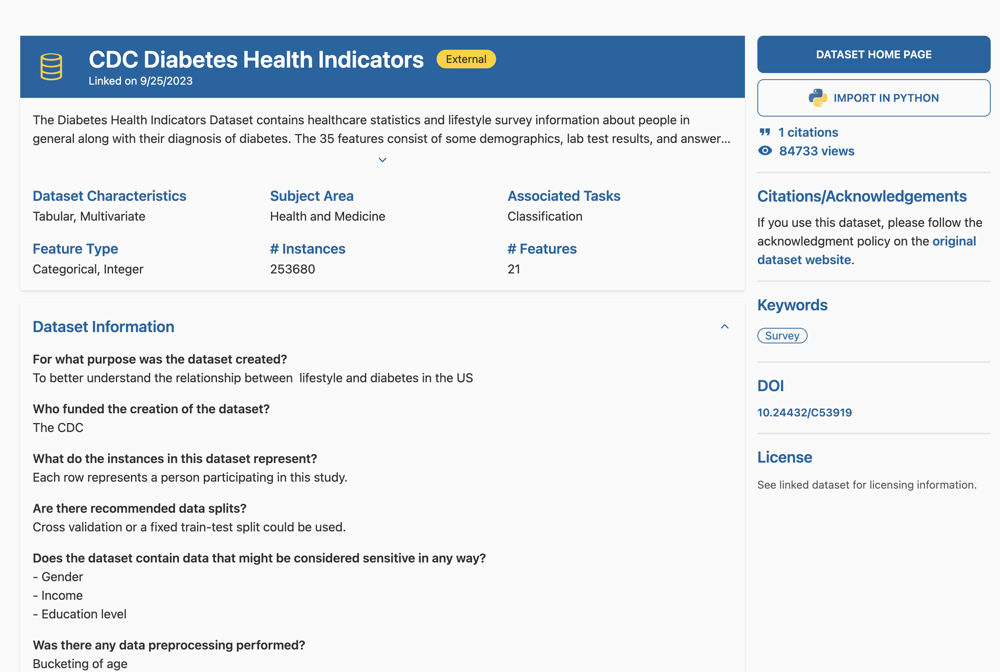

# Understanding the Data

This data will be used to get a better understanding of the relationship between lifestyle and diabetes in the US. Each row in this dataset represents a person participating in this study. 

In reference to this work, the UCI link also provides an introductory paper about the correlation of other deceases with Diabetes. The link to the paper is here : https://www.cdc.gov/mmwr/volumes/66/wr/mm6643a2.htm

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import timeit
import plotly.graph_objs as go
from plotly.subplots import make_subplots

%matplotlib inline

In [2]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import LabelEncoder, StandardScaler
from sklearn.model_selection import train_test_split 
from sklearn.cluster import KMeans

from sklearn.dummy import DummyClassifier
from sklearn.linear_model import LogisticRegression, RidgeClassifier

from sklearn.tree import DecisionTreeClassifier, export_text, plot_tree
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.inspection import permutation_importance

from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV

from sklearn.metrics import mean_squared_error, accuracy_score, recall_score, precision_score, f1_score, roc_auc_score
from sklearn.metrics import confusion_matrix, precision_recall_curve, roc_curve, auc
from sklearn.metrics import RocCurveDisplay, ConfusionMatrixDisplay, classification_report

from xgboost import XGBClassifier
from sklearn.ensemble import VotingClassifier, AdaBoostClassifier, RandomForestClassifier

import graphviz
import warnings
warnings.filterwarnings("ignore")

### Load Data for analysis

In [3]:
# Import the dataset into the Jupyter Notebook Project

from ucimlrepo import fetch_ucirepo 
  
# fetch dataset 
cdc_diabetes_health_indicators = fetch_ucirepo(id=891) 
  
# data (as pandas dataframes) 
X = cdc_diabetes_health_indicators.data.features 
y = cdc_diabetes_health_indicators.data.targets 
  
# metadata 
print(cdc_diabetes_health_indicators.metadata)

{'uci_id': 891, 'name': 'CDC Diabetes Health Indicators', 'repository_url': 'https://archive.ics.uci.edu/dataset/891/cdc+diabetes+health+indicators', 'data_url': 'https://archive.ics.uci.edu/static/public/891/data.csv', 'abstract': 'The Diabetes Health Indicators Dataset contains healthcare statistics and lifestyle survey information about people in general along with their diagnosis of diabetes. The 35 features consist of some demographics, lab test results, and answers to survey questions for each patient. The target variable for classification is whether a patient has diabetes, is pre-diabetic, or healthy. ', 'area': 'Health and Medicine', 'tasks': ['Classification'], 'characteristics': ['Tabular', 'Multivariate'], 'num_instances': 253680, 'num_features': 21, 'feature_types': ['Categorical', 'Integer'], 'demographics': ['Sex', 'Age', 'Education Level', 'Income'], 'target_col': ['Diabetes_binary'], 'index_col': ['ID'], 'has_missing_values': 'no', 'missing_values_symbol': None, 'year_

In [4]:
# variable information 

cdc_diabetes_health_indicators.variables

,name,role,type,demographic,description,units,missing_values
0,ID,ID,Integer,None,Patient ID,None,no
1,Diabetes_binary,Target,Binary,None,0 = no diabetes 1 = prediabetes or diabetes,None,no
2,HighBP,Feature,Binary,None,0 = no high BP 1 = high BP,None,no
3,HighChol,Feature,Binary,None,0 = no high cholesterol 1 = high cholesterol,None,no
4,CholCheck,Feature,Binary,None,0 = no cholesterol check in 5 years 1 = yes ch...,None,no
5,BMI,Feature,Integer,None,Body Mass Index,None,no
6,Smoker,Feature,Binary,None,Have you smoked at least 100 cigarettes in you...,None,no
7,Stroke,Feature,Binary,None,(Ever told) you had a stroke. 0 = no 1 = yes,None,no
8,HeartDiseaseorAttack,Feature,Binary,None,coronary heart disease (CHD) or myocardial inf...,None,no
9,PhysActivity,Feature,Binary,None,physical activity in past 30 days - not includ...,None,no


# Exploratory Data Analysis

In [5]:
with pd.option_context('display.max_colwidth', None):
  display(cdc_diabetes_health_indicators.variables.description)

0                                                                                                                                                                                                                                                                                                                                  Patient ID
1                                                                                                                                                                                                                                                                                                 0 = no diabetes 1 = prediabetes or diabetes
2                                                                                                                                                                                                                                                                                                                  0 = no high BP 1 = high B

In [6]:
X.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype
---  ------                --------------   -----
 0   HighBP                253680 non-null  int64
 1   HighChol              253680 non-null  int64
 2   CholCheck             253680 non-null  int64
 3   BMI                   253680 non-null  int64
 4   Smoker                253680 non-null  int64
 5   Stroke                253680 non-null  int64
 6   HeartDiseaseorAttack  253680 non-null  int64
 7   PhysActivity          253680 non-null  int64
 8   Fruits                253680 non-null  int64
 9   Veggies               253680 non-null  int64
 10  HvyAlcoholConsump     253680 non-null  int64
 11  AnyHealthcare         253680 non-null  int64
 12  NoDocbcCost           253680 non-null  int64
 13  GenHlth               253680 non-null  int64
 14  MentHlth              253680 non-null  int64
 15  PhysHlth              253680 non-n

In [7]:
print (f'Total # of Rows: {X.shape[0]:,} and Total # of Columns: {X.shape[1]}')

Total # of Rows: 253,680 and Total # of Columns: 21


In [8]:
# Since all the attributes are numeric data, let's explore the statistical information for each of the attribute

X.describe().T

,count,mean,std,min,25%,50%,75%,max
HighBP,253680.0,0.429001,0.494934,0.0,0.0,0.0,1.0,1.0
HighChol,253680.0,0.424121,0.494210,0.0,0.0,0.0,1.0,1.0
CholCheck,253680.0,0.962670,0.189571,0.0,1.0,1.0,1.0,1.0
BMI,253680.0,28.382364,6.608694,12.0,24.0,27.0,31.0,98.0
Smoker,253680.0,0.443169,0.496761,0.0,0.0,0.0,1.0,1.0
Stroke,253680.0,0.040571,0.197294,0.0,0.0,0.0,0.0,1.0
HeartDiseaseorAttack,253680.0,0.094186,0.292087,0.0,0.0,0.0,0.0,1.0
PhysActivity,253680.0,0.756544,0.429169,0.0,1.0,1.0,1.0,1.0
Fruits,253680.0,0.634256,0.481639,0.0,0.0,1.0,1.0,1.0
Veggies,253680.0,0.811420,0.391175,0.0,1.0,1.0,1.0,1.0


In [9]:
# Let's look at the first 10 rows of the dataset
# Since there are 21 columns, I will transpose the data to display the data 
X.head(10).T

,0,1,2,3,4,5,6,7,8,9
HighBP,1,0,1,1,1,1,1,1,1,0
HighChol,1,0,1,0,1,1,0,1,1,0
CholCheck,1,0,1,1,1,1,1,1,1,1
BMI,40,25,28,27,24,25,30,25,30,24
Smoker,1,1,0,0,0,1,1,1,1,0
Stroke,0,0,0,0,0,0,0,0,0,0
HeartDiseaseorAttack,0,0,0,0,0,0,0,0,1,0
PhysActivity,0,1,0,1,1,1,0,1,0,0
Fruits,0,0,1,1,1,1,0,0,1,0
Veggies,1,0,0,1,1,1,0,1,1,1


In [10]:
# Let's look at the last 10 rows of the dataset
X.tail(10).T

,253670,253671,253672,253673,253674,253675,253676,253677,253678,253679
HighBP,1,1,1,1,0,1,1,0,1,1
HighChol,1,1,0,0,0,1,1,0,0,1
CholCheck,1,1,1,1,1,1,1,1,1,1
BMI,25,23,30,42,27,45,18,28,23,25
Smoker,0,0,1,0,0,0,0,0,0,0
Stroke,0,1,0,0,0,0,0,0,0,0
HeartDiseaseorAttack,1,1,1,0,0,0,0,0,0,1
PhysActivity,0,0,1,1,0,0,0,1,0,1
Fruits,1,0,1,1,0,1,0,1,1,1
Veggies,0,0,1,1,1,1,0,0,1,0


In [11]:
y.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 253680 entries, 0 to 253679
Data columns (total 1 columns):
 #   Column           Non-Null Count   Dtype
---  ------           --------------   -----
 0   Diabetes_binary  253680 non-null  int64
dtypes: int64(1)
memory usage: 1.9 MB


In [12]:
y.Diabetes_binary.unique()

array([0, 1])

In [13]:
# List the count of unique values for each column
# If column has less than 15 unique values, display them in sorted order

for col in X.columns:
    print (f'{col:<20} : {X[col].nunique():2} unique values.', end = ' ')
    print ('They are :', sorted(X[col].unique())) if (X[col].nunique() < 15) else print()

HighBP               :  2 unique values. They are : [0, 1]
HighChol             :  2 unique values. They are : [0, 1]
CholCheck            :  2 unique values. They are : [0, 1]
BMI                  : 84 unique values. 
Smoker               :  2 unique values. They are : [0, 1]
Stroke               :  2 unique values. They are : [0, 1]
HeartDiseaseorAttack :  2 unique values. They are : [0, 1]
PhysActivity         :  2 unique values. They are : [0, 1]
Fruits               :  2 unique values. They are : [0, 1]
Veggies              :  2 unique values. They are : [0, 1]
HvyAlcoholConsump    :  2 unique values. They are : [0, 1]
AnyHealthcare        :  2 unique values. They are : [0, 1]
NoDocbcCost          :  2 unique values. They are : [0, 1]
GenHlth              :  5 unique values. They are : [1, 2, 3, 4, 5]
MentHlth             : 31 unique values. 
PhysHlth             : 31 unique values. 
DiffWalk             :  2 unique values. They are : [0, 1]
Sex                  :  2 unique values

### Key values for each of the Binary Attributes
```
Target Variable: 

Diabetes_binary (y)   0 = no diabetes
                      1 = prediabetes or diabetes

Input Variables:

HighBP                0 = no high BP
                      1 = high BP

HighChol              0 = no high cholesterol
                      1 = high cholesterol

CholCheck             0 = no cholesterol check in 5 years
                      1 = yes cholesterol check in 5 years

Smoker                Have you smoked at least 100 cigarettes in your entire life? [Note: 5 packs = 100 cigarettes]
                      0 = no
                      1 = yes

Stroke                (Ever told) you had a stroke
                      0 = no
                      1 = yes 

HeartDiseaseorAttack  Coronary Heart Disease (CHD) or Myocardial Infarction (MI)
                      0 = no
                      1 = yes 

PhysActivity          Physical activity in past 30 days - not including job
                      0 = no
                      1 = yes 

Fruits                Consume Fruit 1 or more times per day
                      0 = no
                      1 = yes 

Veggies               Consume Vegetables 1 or more times per day
                      0 = no
                      1 = yes 

HvyAlcoholConsump     Heavy drinkers (adult men having more than 14 drinks per week and
                                      adult women having more than 7 drinks per week)
                      0 = no
                      1 = yes 

AnyHealthcare         Have any kind of health care coverage, including health insurance, prepaid plans such as HMO, etc.
                      0 = no
                      1 = yes 

NoDocbcCost           Was there a time in the past 12 months when you needed to see a doctor
                      but could not because of cost?
                      0 = no
                      1 = yes

DiffWalk              Do you have serious difficulty walking or climbing stairs?
                      0 = no
                      1 = yes 

Sex                   0 = female
                      1 = male
```

### Key values for each of the Numeric Attributes with Range of Values

```
GenHlth               Would you say that in general your health is: scale 1-5
                      1 = excellent
                      2 = very good
                      3 = good
                      4 = fair
                      5 = poor

Age                   13-level age category (_AGEG5YR see codebook)
                      1  = 18-24
                      2  = 25-29
                      3  = 30-34
                      4  = 35-39
                      5  = 40-44
                      6  = 45-49
                      7  = 50-54
                      8  = 55-59
                      9  = 60-64
                      10 = 65-69
                      11 = 70-74
                      12 = 75-79
                      13 = 80 or older

Education             Education level (EDUCA see codebook) scale 1-6
                      1 = Never attended school or only kindergarten
                      2 = Grades 1 through 8 (Elementary)
                      3 = Grades 9 through 11 (Some high school)
                      4 = Grade 12 or GED (High school graduate)
                      5 = College 1 year to 3 years (Some college or technical school)
                      6 = College 4 years or more (College graduate)  

Income                Income scale (INCOME2 see codebook) scale 1-8
                      1 = less than $10,000
                      2 = less than $15,000
                      3 = less than $20,000
                      4 = less than $25,000
                      5 = less than $35,000
                      6 = less than $50,000
                      7 = less than $75,000
                      8 = $75,000 or more

```

Refer to pages 23 (for Income) and 108 (for Age) in the link below \
https://www.cdc.gov/brfss/annual_data/2014/pdf/CODEBOOK14_LLCP.pdf

# Data Analysis and Data Visualization 

In [14]:
# Let's visualize each of the attributes using the pie plot to see how they are distributed

#### HighBP - Attribute to evaluate if Patient has High BP
A value of 0 = No High BP, a value of 1 = High BP

In [15]:
# First, summarize the High BP column and calculate the % of data split between the two values 
# (0 and 1 - No High BP and High BP)

grouped_v = X.groupby(['HighBP'])['HighBP'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

HighBP
0    57.09989
1    42.90011
Name: HighBP, dtype: float64

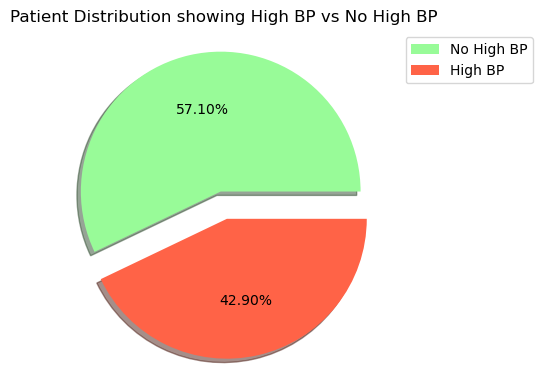

In [16]:
# Next is to visualizing the High BP attribute

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = ['No High BP', 'High BP'],
                  colors = ['palegreen','tomato'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 1),loc='best')
plt.title('Patient Distribution showing High BP vs No High BP')
plt.tight_layout()
plt.show()

#### HighChol - Attribute to evaluate if Patient has High Cholesterol
A value of 0 = No High Cholesterol, a value of 1 = High Cholesterol

In [17]:
# First, summarize the High Cholesterol column and calculate the % of data split between the two values 
# (0 and 1 - No High Cholesterol and High Cholesterol)

grouped_v = X.groupby(['HighChol'])['HighChol'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

HighChol
0    57.587906
1    42.412094
Name: HighChol, dtype: float64

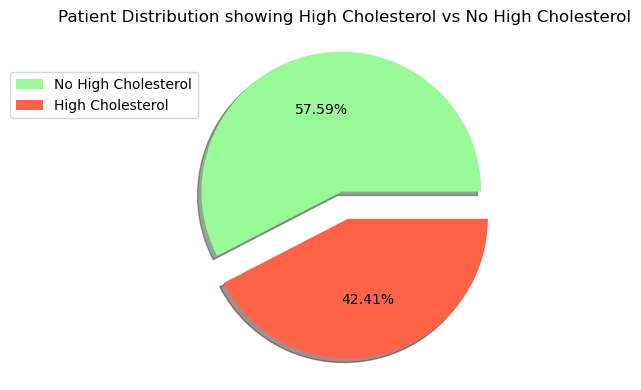

In [18]:
# Next is to visualizing the High Cholesterol attribute

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = ['No High Cholesterol', 'High Cholesterol'],
                  colors = ['palegreen','tomato'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(0.1, 0.9),loc='upper right')
plt.title('Patient Distribution showing High Cholesterol vs No High Cholesterol')
plt.tight_layout()
plt.show()

#### CholCheck - Attribute to evaluate if Patient has done a Cholesterol Check in the past 5 years
A value of 0 = Did not do a Cholesterol Check in last 5 years, a value of 1 = Did a Cholesterol Check in last 5 years

In [19]:
# First, summarize the High Cholesterol column and calculate the % of data split between the two values 
# (0 and 1 - No Cholesterol Check in last 5 years and Did Cholesterol Check in last 5 years)

grouped_v = X.groupby(['CholCheck'])['CholCheck'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

CholCheck
0     3.73305
1    96.26695
Name: CholCheck, dtype: float64

In [20]:
# Convert the Index values into meaningful values
cc_label = grouped_v.index.map({0:'No Cholestrol Check in last 5 years',
                               1:'Cholestrol Check in last 5 years'}).to_list()
cc_label

['No Cholestrol Check in last 5 years', 'Cholestrol Check in last 5 years']

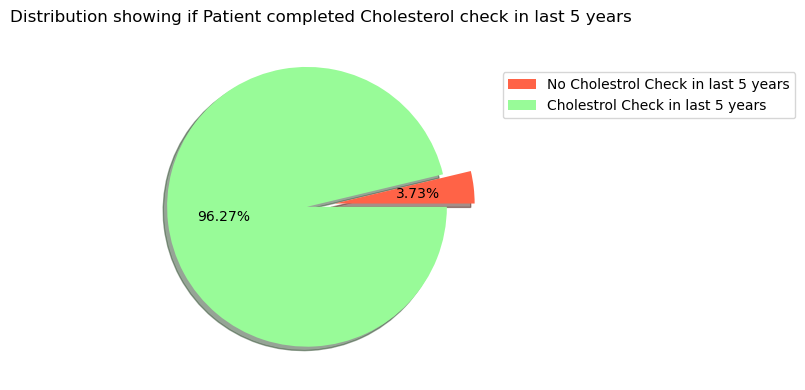

In [21]:
# Next is to visualizing the attribute for Cholesterol Check for last 5 years

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  #labels = ['No Cholestrol Check in last 5 years', 'Cholestrol Check in last 5 years'],
                  labels = cc_label,
                  colors = ['tomato','palegreen'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing if Patient completed Cholesterol check in last 5 years')
plt.tight_layout()
plt.show()

#### Smoker - Attribute to evaluate if Patient has smoked at least 100 cigarettes in their entire life

[Note: 5 packs = 100 cigarettes]

A value of 0 = incdicates they are not considered a Smoker, a value of 1 = indicates they have smoked 100 cigarettes and considered a Smoker

In [22]:
# First, summarize the Smoker column and calculate the % of data split between the two values 
# (0 and 1 - No Cholesterol Check in last 5 years and Did Cholesterol Check in last 5 years)

grouped_v = X.groupby(['Smoker'])['Smoker'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

Smoker
0    55.683144
1    44.316856
Name: Smoker, dtype: float64

In [23]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({0:'Not a Smoker',1:'Smoker'}).to_list()
label_v

['Not a Smoker', 'Smoker']

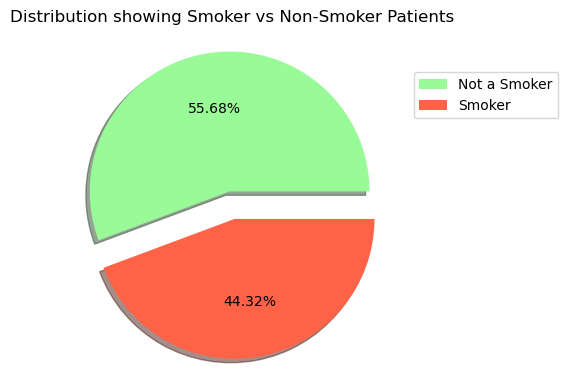

In [24]:
# Next is to visualizing the attribute if Patient is a Smoker

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = label_v,
                  colors = ['palegreen','tomato'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Smoker vs Non-Smoker Patients')
plt.tight_layout()
plt.show()

#### Stroke - Attribute checks if Patient has ever had a Stoke in the past
A value of 0 = has not had a Stroke in the past, a value of 1 = has had a Stoke in the past

In [25]:
# First, summarize the Stroke column and calculate the % of data split between the two values 
# (0 and 1 - Has NOT had Stroke and Had Stroke)

grouped_v = X.groupby(['Stroke'])['Stroke'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

Stroke
0    95.94292
1     4.05708
Name: Stroke, dtype: float64

In [26]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({0:'Has Not had a Stroke',1:'Had a Stroke'}).to_list()
label_v

['Has Not had a Stroke', 'Had a Stroke']

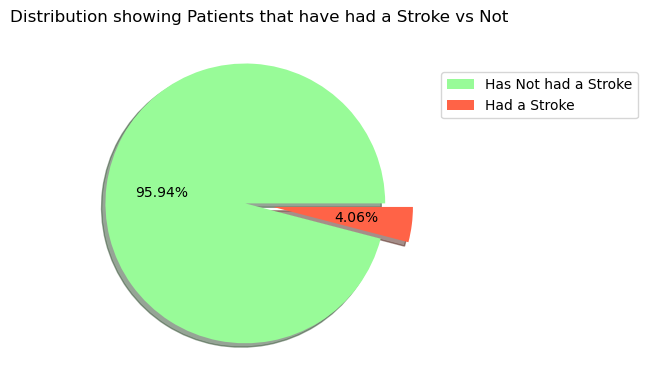

In [27]:
# Next is to visualizing the attribute if Patient is has had a Stroke

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = label_v,
                  colors = ['palegreen','tomato'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Patients that have had a Stroke vs Not')
plt.tight_layout()
plt.show()

#### HeartDiseaseorAttack - Attribute checks if Patient has been diagnosed having Coronary Heart Disease (CHD) or Myocardial Infarction (MI)
A value of 0 = has not had a Heart Disease or Attack, a value of 1 = has had a Heart Disease or Attack in the past

In [28]:
# First, summarize the HeartDiseaseorAttack column and calculate the % of data split between the two values 
# (0 and 1 - Has NOT had Heart Disease or Attack and Had Heart Disease or Attack)

grouped_v = X.groupby(['HeartDiseaseorAttack'])['HeartDiseaseorAttack'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

HeartDiseaseorAttack
0    90.581441
1     9.418559
Name: HeartDiseaseorAttack, dtype: float64

In [29]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({0:'Has Not had a Heart Disease or Attack',1:'Had a Heart Disease or Attack'}).to_list()
label_v

['Has Not had a Heart Disease or Attack', 'Had a Heart Disease or Attack']

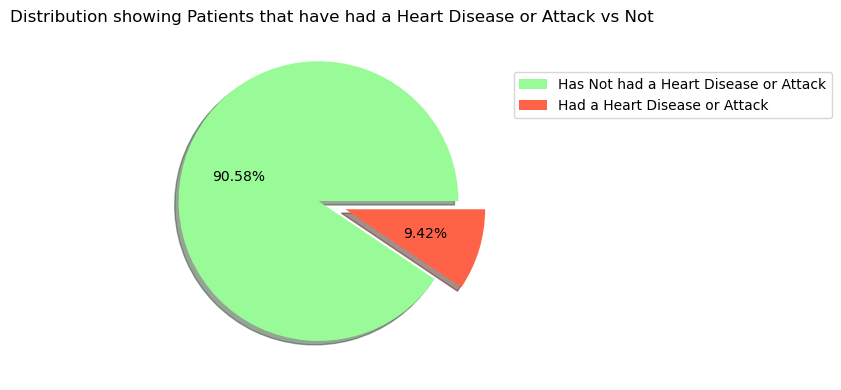

In [30]:
# Next is to visualizing the attribute if Patient has had a Heart Discease or Heart Attack

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = label_v,
                  colors = ['palegreen','tomato'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Patients that have had a Heart Disease or Attack vs Not')
plt.tight_layout()
plt.show()

#### PhysActivity - Attribute checks if Patient has had any Physical Activity in the past 30 days (not including job)
A value of 0 = has not had any Physical Activity, a value of 1 = has had a Physical Activity in past 30 days

In [31]:
# First, summarize the PhysActivity column and calculate the % of data split between the two values 
# (0 and 1 - Has NOT had any Physical Activity and Had Physical Activity)

grouped_v = X.groupby(['PhysActivity'])['PhysActivity'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

PhysActivity
0    24.345632
1    75.654368
Name: PhysActivity, dtype: float64

In [32]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({0:'No Physical Activity',1:'Had Physical Activity'}).to_list()
label_v

['No Physical Activity', 'Had Physical Activity']

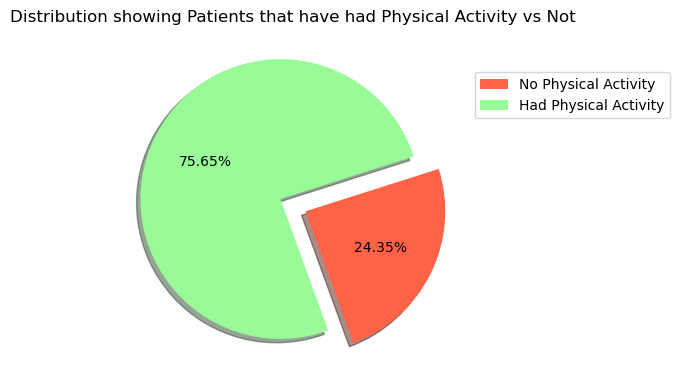

In [33]:
# Next is to visualizing the attribute if Patient is a Smoker

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = label_v,
                  startangle=290,
                  colors = ['tomato', 'palegreen'],
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Patients that have had Physical Activity vs Not')
plt.tight_layout()
plt.show()

### Visualization of all Binary Attributes 

In [34]:
# Let's create a list of all binary columns and build a pie plot grid to show the 

binary_cols = [col for col in X.columns if X[col].nunique() == 2]
print (binary_cols)

['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk', 'Sex']


In [35]:
nrows = len(binary_cols)//2

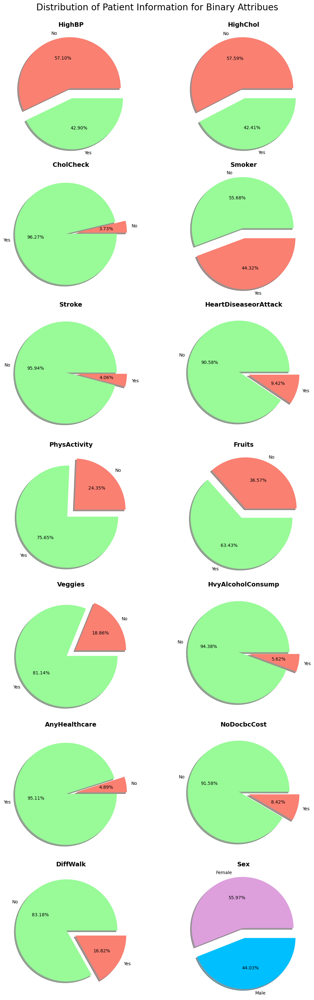

In [36]:
fig, axs = plt.subplots(nrows=nrows, ncols=2, figsize=(12, 31))

#wedge_properties = {'linewidth': 1, 'edgecolor': "black"}

good_colors = ['salmon', 'palegreen']
bad_colors  = ['palegreen', 'salmon']

for col, ax in zip(binary_cols, axs.flat):
    grouped_v = X.groupby([col])[col].count().transform(lambda x: x / x.sum() * 100)

    label_val = grouped_v.index.map({0:'No',1:'Yes'})

    if col in ['Smoker', 'Stroke', 'HeartDiseaseorAttack', 'HvyAlcoholConsump', 'DiffWalk', 'NoDocbcCost']:
        color_set = bad_colors
    elif col == 'Sex':
        color_set = ['plum', 'deepskyblue']
        label_val = grouped_v.index.map({0:'Female',1:'Male'})
    else:
        color_set = good_colors

    
    texts, autotexts, wedges = ax.pie(grouped_v,
                                      labels=label_val,
                                      #labeldistance=-0.2,
                                      shadow=True, explode=[0.1, 0.1],
                                      #colors = ['tomato', 'palegreen'],
                                      colors = color_set,
                                      startangle=0,
                                      #wedgeprops=wedge_properties,
                                      autopct='%1.2f%%',
                                    )
    ax.set_title(col, size=14, weight="bold", y=1, x = 0.5)

plt.suptitle('Distribution of Patient Information for Binary Attribues', fontsize=20, y=1)
plt.tight_layout()
plt.savefig('Patient Data - Binary Attributes.png')
plt.show()

#### GenHlth - Attribute rates the Patient's General Health from a scale of 1 to 5
Scale values are : 1 = excellent, 2 = very good, 3 = good, 4 = fair, 5 = poor

In [37]:
# First, summarize the PhysActivity column and calculate the % of data split between the five values 
# (1 = excellent, 2 = very good, 3 = good, 4 = fair, 5 = poor)

grouped_v = X.groupby(['GenHlth'])['GenHlth'].count().transform(lambda x: x / x.sum() * 100)
grouped_v

GenHlth
1    17.856749
2    35.116682
3    29.819458
4    12.444812
5     4.762299
Name: GenHlth, dtype: float64

In [38]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({1:'Excellent', 2:'Very Good', 3:'Good', 4:'Fair', 5:'Poor'}).to_list()
label_v

['Excellent', 'Very Good', 'Good', 'Fair', 'Poor']

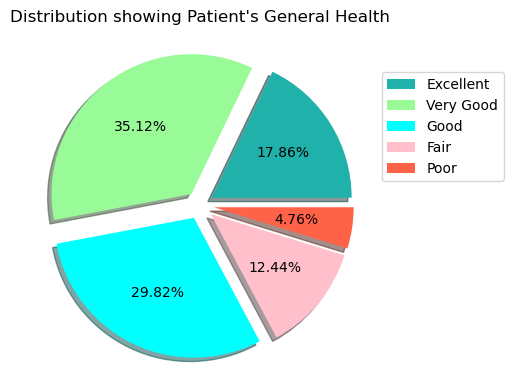

In [39]:
# Next is to visualizing the attribute if Patient is a Smoker

# Create a colormap for green shades
#green_cmap = plt.cm.Greens

# Create a colormap for red shades
#red_cmap = plt.cm.Reds

# Generate colors for each slice
#colors_v = [green_cmap(i) for i in np.linspace(0.8, 0.2, len(label_v))]

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  labels = label_v,
                  startangle=0,
                  colors = ['lightseagreen', 'palegreen', 'cyan', 'pink', 'tomato'],
                  #colors = plt.cm.Pastel2.colors,
                  shadow=True, explode=[0.1, 0.1, 0.1, 0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Patient\'s General Health')
plt.tight_layout()
plt.show()

#### Education - Attribute to show Patient's Education from a scale of 1 to 6
1 = Never attended school or only kindergarten \
2 = Grades 1 through 8 (Elementary) \
3 = Grades 9 through 11 (Some high school) \
4 = Grade 12 or GED (High school graduate) \
5 = College 1 year to 3 years (Some college or technical school) \
6 = College 4 years or more (College graduate)

In [40]:
# First, summarize the PhysActivity column and calculate the % of data split between the six values 
# see details above for scale 1-6

grouped_v = X.groupby(['Education'])['Education'].count()
grouped_v

Education
1       174
2      4043
3      9478
4     62750
5     69910
6    107325
Name: Education, dtype: int64

In [41]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({1:'None or Kindergarten', 2:'Grades 1 - 8', 3:'Grades 9 - 11', 
                               4:'Grade 12 or GED', 5:'College 1-3 Years', 6 : 'College 4 or more Years'}).to_list()
label_v

['None or Kindergarten',
 'Grades 1 - 8',
 'Grades 9 - 11',
 'Grade 12 or GED',
 'College 1-3 Years',
 'College 4 or more Years']

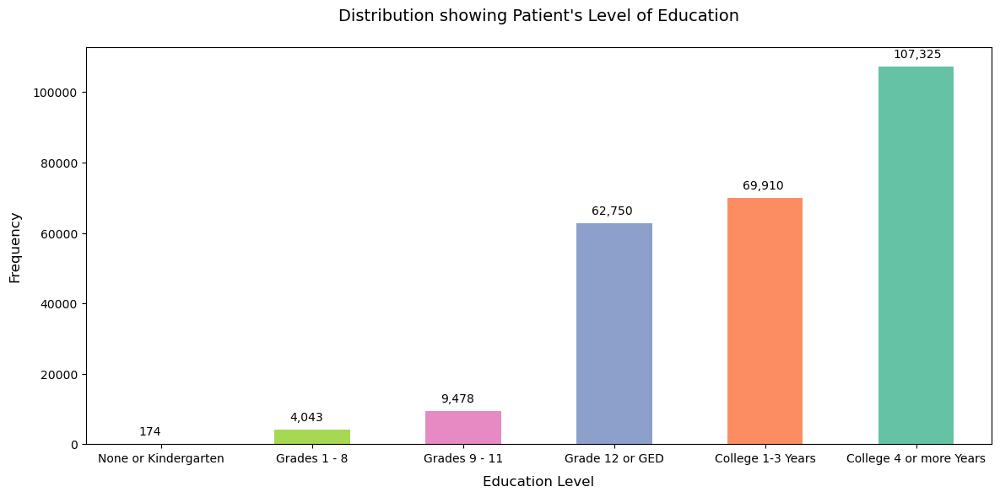

In [42]:
# Next is to visualizing the attribute if Patient is a Smoker

lv_len = len(label_v)

ax = grouped_v.plot(kind='bar', figsize=(12,6), color = plt.cm.Set2.colors[:lv_len][::-1])
plt.title('Distribution showing Patient\'s Level of Education', fontsize=14, y=1.05)
plt.xticks(range(lv_len),label_v, rotation = 0)
for index,data in enumerate(grouped_v):
    plt.text(x=index - .15 , y =data+2500 , s=f"{data:,}" , fontdict=dict(fontsize=10))
plt.xlabel('Education Level', labelpad=10, fontsize=12)
plt.ylabel('Frequency', labelpad=10, fontsize=12)
plt.tight_layout()
plt.show()

#### Income - Attribute provides Patient's Income level from a scale of 1 to 8
1 = less than \\$10,000 \
2 = less than \\$15,000 \
3 = less than \\$20,000 \
4 = less than \\$25,000 \
5 = less than \\$35,000 \
6 = less than \\$50,000 \
7 = less than \\$75,000 \
8 = \$75,000 or more

Refer to Page 23 in this document for INCOME2 scale \
https://www.cdc.gov/brfss/annual_data/2014/pdf/CODEBOOK14_LLCP.pdf (refer to page 23)

In [43]:
# First, summarize the PhysActivity column and calculate the % of data split between the six values 
# see details above for scale 1-6

grouped_v = X.groupby(['Income'])['Income'].count()
grouped_v

Income
1     9811
2    11783
3    15994
4    20135
5    25883
6    36470
7    43219
8    90385
Name: Income, dtype: int64

In [44]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({1:'less than $10k', 2 : '10k to $15k', 3:'15k to $20k', 4:'20k to $25k',
                               5:'25k to $35k', 6 : '35k to $50k', 7:'50k to $75k', 8:'$75k or more', }).to_list()
label_v

['less than $10k',
 '10k to $15k',
 '15k to $20k',
 '20k to $25k',
 '25k to $35k',
 '35k to $50k',
 '50k to $75k',
 '$75k or more']

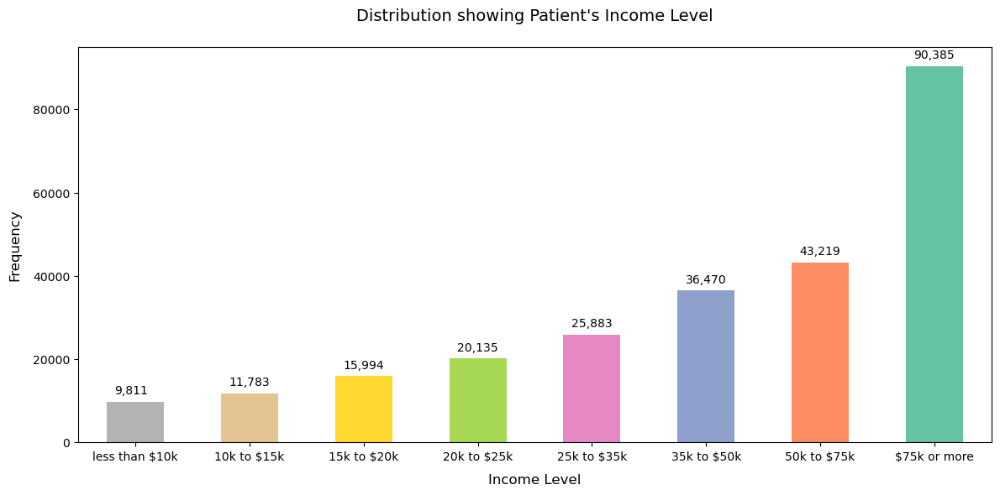

In [45]:
# Next is to visualizing the attribute if Patient is a Smoker

lv_len = len(label_v)

ax = grouped_v.plot(kind='bar', figsize=(12,6), color = plt.cm.Set2.colors[:lv_len][::-1])
plt.title('Distribution showing Patient\'s Income Level', fontsize=14, y=1.05)
plt.xticks(range(lv_len),label_v, rotation = 0)
for index,data in enumerate(grouped_v):
    plt.text(x=index - .18 , y =data+1800 , s=f"{data:,}" , fontdict=dict(fontsize=10))
plt.xlabel('Income Level', labelpad=10, fontsize=12)
plt.ylabel('Frequency', labelpad=10, fontsize=12)
plt.tight_layout()
plt.show()

#### Age - Attribute provides Patient's Age level from a scale of 1 to 13
```
1  = Age 18 to 24       2 = Age 25 to 29      3  = Age 30 to 34       4 = Age 35 to 39 \
5  = Age 40 to 44       6 = Age 45 to 49      7  = Age 50 to 54       8 = Age 55 to 59 \
9  = Age 60 to 64      10 = Age 65 to 69     11  = Age 70 to 74      12 = Age 75 to 79 \
13 = Age 80 or older
```
Refer to Page 101 in this document for _AGEG5YR scale \
https://www.cdc.gov/brfss/annual_data/2014/pdf/CODEBOOK14_LLCP.pdf \

In [46]:
# First, summarize the PhysActivity column and calculate the % of data split between the six values 
# see details above for scale 1-6

grouped_v = X.groupby(['Age'])['Age'].count()
grouped_v

Age
1      5700
2      7598
3     11123
4     13823
5     16157
6     19819
7     26314
8     30832
9     33244
10    32194
11    23533
12    15980
13    17363
Name: Age, dtype: int64

In [47]:
# Convert the Index values into meaningful values
label_v = grouped_v.index.map({1:'Age 18 to 24',  2 : 'Age 25 to 29',  3:'Age 30 to 34',  4:'Age 35 to 39',
                               5:'Age 40 to 44',  6 : 'Age 45 to 49',  7:'Age 50 to 54',  8:'Age 55 to 59', 
                               9:'Age 60 to 64', 10 : 'Age 65 to 69', 11:'Age 70 to 74', 12:'Age 75 to 79', 13:'Age 80 or older',
                              }).to_list()
label_v

['Age 18 to 24',
 'Age 25 to 29',
 'Age 30 to 34',
 'Age 35 to 39',
 'Age 40 to 44',
 'Age 45 to 49',
 'Age 50 to 54',
 'Age 55 to 59',
 'Age 60 to 64',
 'Age 65 to 69',
 'Age 70 to 74',
 'Age 75 to 79',
 'Age 80 or older']

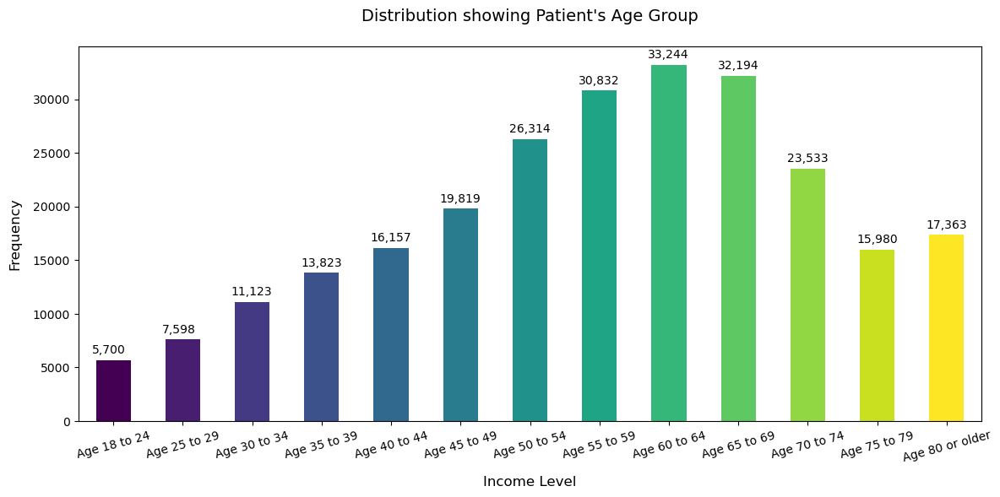

In [48]:
# Next is to visualizing the attribute if Patient is a Smoker

lv_len = len(label_v)

color_scheme = plt.cm.viridis(np.linspace(0, 1, lv_len))

ax = grouped_v.plot(kind='bar', figsize=(12,6), 
                    color = color_scheme,
                    #color = plt.cm.tab20c.colors[:lv_len]
                   )
plt.title('Distribution showing Patient\'s Age Group', fontsize=14, y=1.05)
plt.xticks(range(lv_len),label_v, rotation = 15)
for index,data in enumerate(grouped_v):
    plt.text(x=index - .3 , y =data+600 , s=f"{data:,}" , fontdict=dict(fontsize=10))
plt.xlabel('Income Level', labelpad=10, fontsize=12)
plt.ylabel('Frequency', labelpad=10, fontsize=12)
plt.tight_layout()
plt.show()

In [49]:
df_original = pd.DataFrame(cdc_diabetes_health_indicators.data.original)
df_original.drop('ID', axis = 1, inplace=True)
df_original.rename(columns={'Diabetes_binary': 'Diabetes'}, inplace=True)
df_original

,Diabetes,HighBP,HighChol,CholCheck,BMI,Smoker,Stroke,HeartDiseaseorAttack,PhysActivity,Fruits,...,AnyHealthcare,NoDocbcCost,GenHlth,MentHlth,PhysHlth,DiffWalk,Sex,Age,Education,Income
0,0,1,1,1,40,1,0,0,0,0,...,1,0,5,18,15,1,0,9,4,3
1,0,0,0,0,25,1,0,0,1,0,...,0,1,3,0,0,0,0,7,6,1
2,0,1,1,1,28,0,0,0,0,1,...,1,1,5,30,30,1,0,9,4,8
3,0,1,0,1,27,0,0,0,1,1,...,1,0,2,0,0,0,0,11,3,6
4,0,1,1,1,24,0,0,0,1,1,...,1,0,2,3,0,0,0,11,5,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
253675,0,1,1,1,45,0,0,0,0,1,...,1,0,3,0,5,0,1,5,6,7
253676,1,1,1,1,18,0,0,0,0,0,...,1,0,4,0,0,1,0,11,2,4
253677,0,0,0,1,28,0,0,0,1,1,...,1,0,1,0,0,0,0,2,5,2
253678,0,1,0,1,23,0,0,0,0,1,...,1,0,3,0,0,0,1,7,5,1


In [50]:
income_labels = ['less than $10k', '10k to $15k', '15k to $20k', '20k to $25k',
                 '25k to $35k',    '35k to $50k', '50k to $75k', '$75k or more']

age_labels = ['Age 18 to 24', 'Age 25 to 29', 'Age 30 to 34', 'Age 35 to 39',
              'Age 40 to 44', 'Age 45 to 49', 'Age 50 to 54', 'Age 55 to 59', 
              'Age 60 to 64', 'Age 65 to 69', 'Age 70 to 74', 'Age 75 to 79', 'Age 80 or older']

edu_labels = ['None or Kindergarten', 'Grades 1 - 8',      'Grades 9 - 11', 
              'Grade 12 or GED',      'College 1-3 Years', 'College 4 or more Years']

#### BMI attribute - Data Analysis

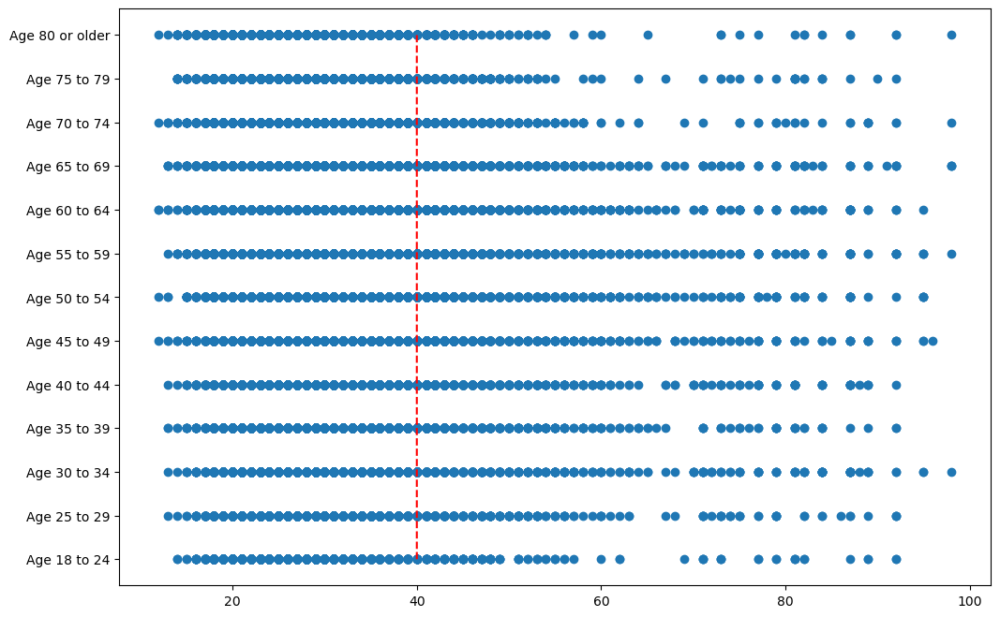

In [51]:
# Let's display to the scatter plot for BMI against Age values

fig = plt.figure(figsize=(12, 8))
plt.scatter(x=X['BMI'], y=X['Age'])
plt.yticks(range(1, len(age_labels)+1), age_labels)

line = 1*np.linspace(40, 40, X.shape[0])
x_line = np.linspace(1, 13, X.shape[0])
plt.plot(line, x_line, 'k--', color = 'r')
plt.show()

***There are many records with a BMI value above 40. A normal adult will have their BMI range between 18.5 and 40. Any value above 40 would be an anomoly.***

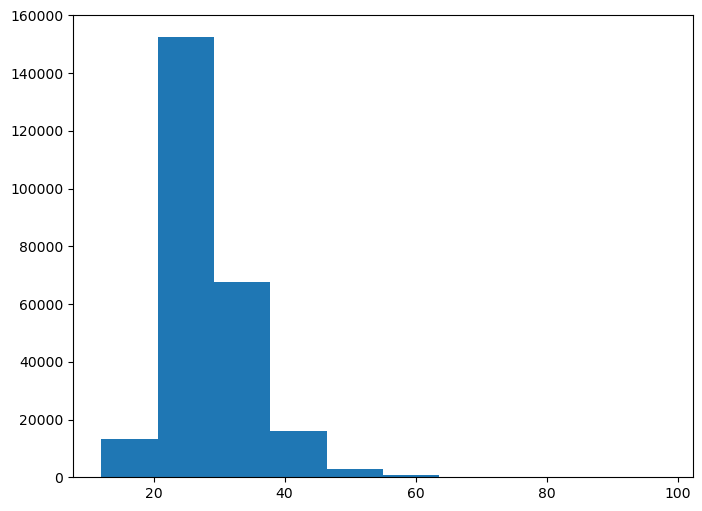

In [52]:
# Let's plot a histogram to see how many values are beyond 40
fig = plt.figure(figsize=(8, 6))
X['BMI'].hist(grid=False)
plt.show()

In [53]:
# There are a few records that are beyond 40. Let's explore further using a pie chart
# To do this, we will have to create a groupby and call all values 40 or less to be Good and anything above 40 as Bad

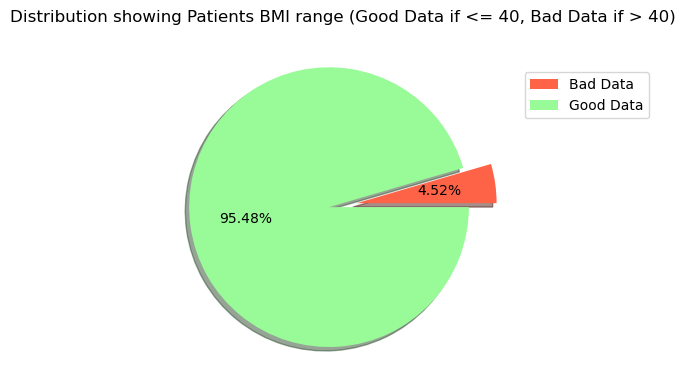

In [54]:
#bmi_data = pd.cut(X['BMI'], bins=[0, 45, 100], labels=['Good', 'Bad'])
bmi_data = X.groupby(X['BMI'].apply(lambda x: 'Good Data' if x <= 40 else 'Bad Data'))
grouped_v = bmi_data['BMI'].count().transform(lambda   x: x / x.sum() * 100)

# Next is to visualizing the attribute for BMI

color_v = grouped_v.index.map({'Good Data':'palegreen','Bad Data':'tomato'})

ax = grouped_v.plot(kind='pie', figsize=(12,4),
                  grid=False, ylabel='',
                  #labels = label_v,
                  startangle=0,
                  colors = color_v,
                  shadow=True, explode=[0.1, 0.1],
                  legend=True, labeldistance=None,
                  autopct='%1.2f%%')
ax.legend(bbox_to_anchor=(1, 0.9),loc='upper left')
plt.title('Distribution showing Patients BMI range (Good Data if <= 40, Bad Data if > 40)')
plt.tight_layout()
plt.show()

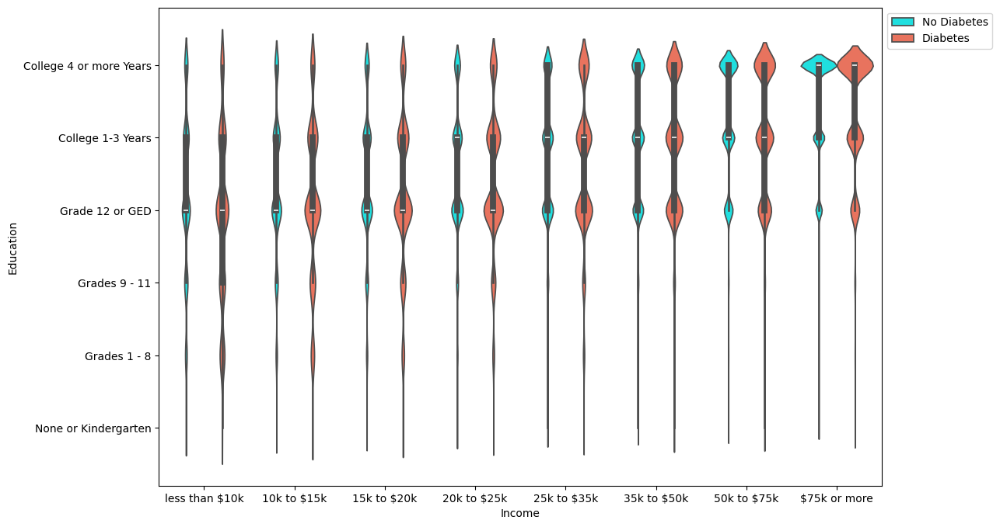

In [55]:
# Let's display to the violin plot for Income and Education against target values - Diabetes

fig = plt.figure(figsize=(12, 8))
ax = sns.violinplot(data=df_original, x='Income', y='Education', hue='Diabetes', palette={0:'cyan', 1:'tomato'})

handles, labels = ax.get_legend_handles_labels()

ax.legend(bbox_to_anchor=(1, 1),loc='upper left', handles=handles, 
          labels = ['No Diabetes', 'Diabetes'])

plt.xticks(range(len(income_labels)), income_labels)
plt.yticks(range(1, len(edu_labels)+1), edu_labels)

plt.show()

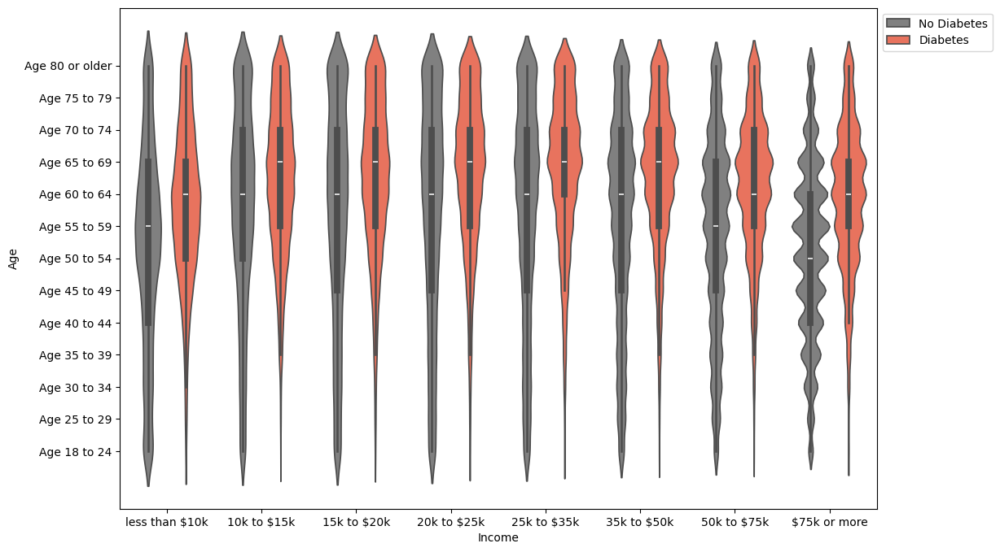

In [56]:
# Let's display to the violin plot for Income and Age against target values - Diabetes

fig = plt.figure(figsize=(12, 8))

ax = sns.violinplot(data=df_original, x='Income', y='Age', hue='Diabetes', palette=['grey','tomato'])

handles, labels = ax.get_legend_handles_labels()

ax.legend(bbox_to_anchor=(1, 1),loc='upper left', handles=handles, #handles=ax.legend_.legendHandles, 
          labels = ['No Diabetes', 'Diabetes'])

plt.xticks(range(len(income_labels)), income_labels)
plt.yticks(range(1, len(age_labels)+1), age_labels)

plt.show()

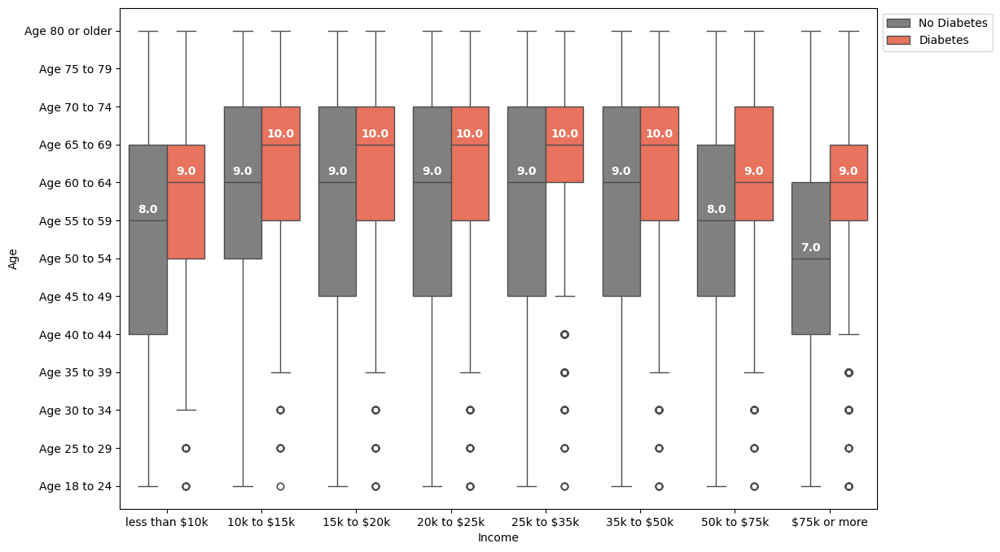

In [57]:
# Let's display to the Box plot for Income and Age against target values - Diabetes

fig = plt.figure(figsize=(12, 8))

ax = sns.boxplot(data=df_original, x='Income', y='Age', hue='Diabetes', palette=['grey','tomato'])

handles, labels = ax.get_legend_handles_labels()

ax.legend(bbox_to_anchor=(1, 1),loc='upper left', handles = handles, #handles=ax.legend_.legendHandles, 
          labels = ['No Diabetes', 'Diabetes'])
medians = df_original.groupby(['Income', 'Diabetes'])['Age'].median().values

ind = 0

for tick in range(len(ax.get_xticklabels())):
    #left side value is medians_label[ind]; median + 0.2 is to move the value up; tick - 0.2 is to shift left from center
    ax.text(tick-.2, medians[ind] + 0.2, medians[ind], horizontalalignment='center', color='w', weight='semibold')

    #right side value is medians_label[ind+1]; median + 0.2 is to move the value up; tick + 0.2 is to shift right from center
    ax.text(tick+.2, medians[ind+1] + 0.2, medians[ind+1],  horizontalalignment='center',  color='w', weight='semibold')

    ind += 2 # to move the medians list by 2 as we have two values for each income group

plt.xticks(range(len(income_labels)), income_labels)
plt.yticks(range(1, len(age_labels)+1), age_labels)

plt.show()

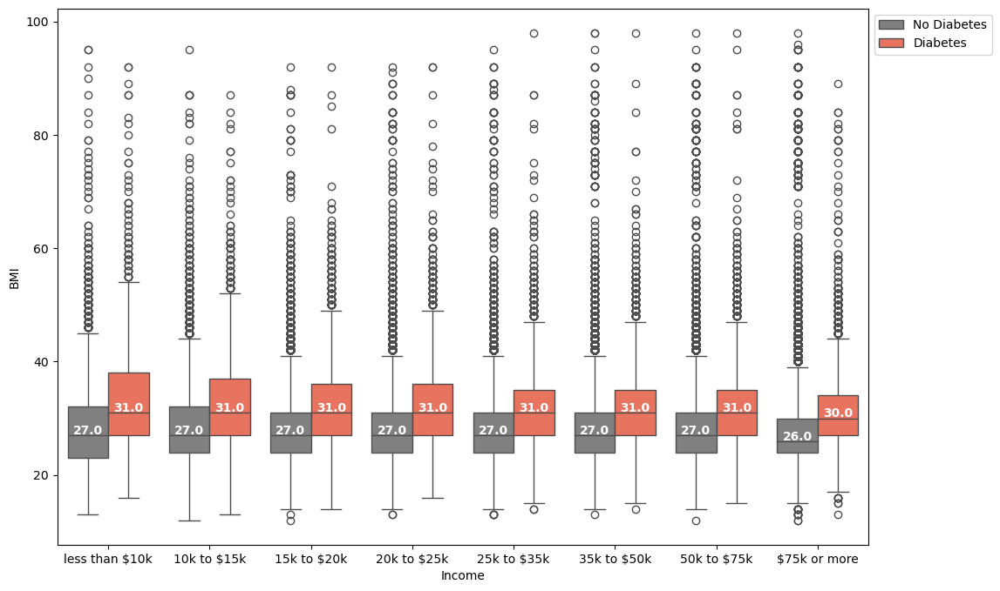

In [58]:
# Let's display to the Box plot for Income and BMI against target values - Diabetes

fig = plt.figure(figsize=(12, 8))

ax = sns.boxplot(data=df_original, x='Income', y='BMI', hue='Diabetes', palette=['grey','tomato'])

handles, labels = ax.get_legend_handles_labels()

ax.legend(bbox_to_anchor=(1, 1),loc='upper left', handles = handles, #handles=ax.legend_.legendHandles, 
          labels = ['No Diabetes', 'Diabetes'])
medians = df_original.groupby(['Income', 'Diabetes'])['BMI'].median().values

ind = 0

for tick in range(len(ax.get_xticklabels())):
    #left side value is medians_label[ind]; median + 0.2 is to move the value up; tick - 0.2 is to shift left from center
    ax.text(tick-.2, medians[ind] + 0.2, medians[ind], horizontalalignment='center', color='w', weight='semibold')

    #right side value is medians_label[ind+1]; median + 0.2 is to move the value up; tick + 0.2 is to shift right from center
    ax.text(tick+.2, medians[ind+1] + 0.2, medians[ind+1],  horizontalalignment='center',  color='w', weight='semibold')

    ind += 2 # to move the medians list by 2 as we have two values for each income group

plt.xticks(range(len(income_labels)), income_labels)
#yticks will be the min and max values of BMI scores

plt.show()

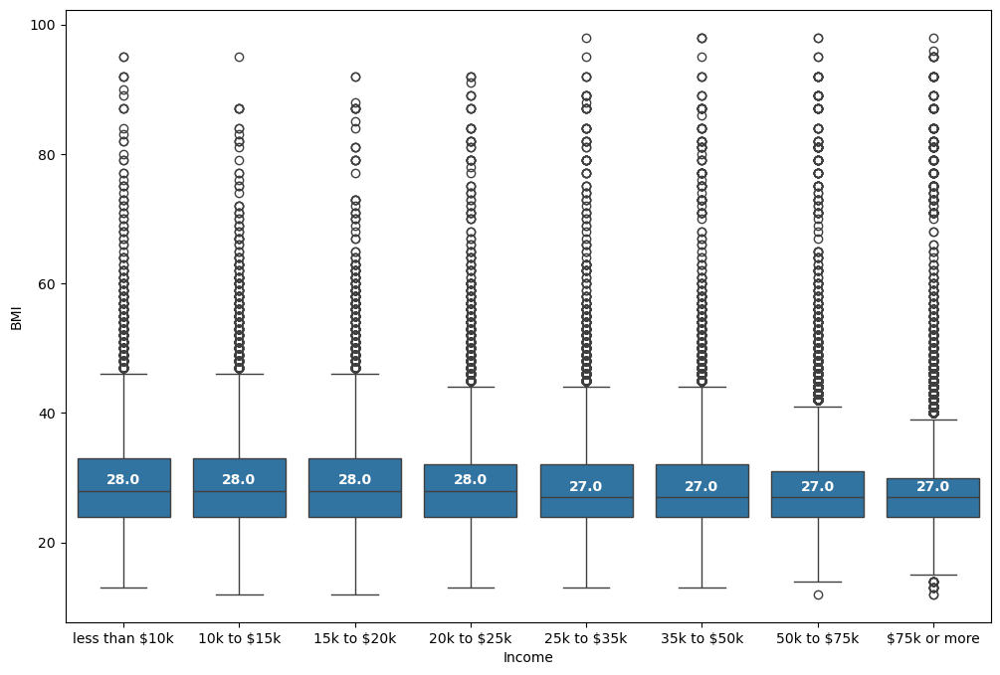

In [59]:
# Let's display the Box plot for Income against BMI

fig = plt.figure(figsize=(12, 8))

ax = sns.boxplot(data=df_original, x='Income', y='BMI')

medians = df_original.groupby(['Income'])['BMI'].median().values

for tick in range(len(ax.get_xticklabels())):
    ax.text(tick, medians[tick] + 1, medians[tick], horizontalalignment='center', color='w', weight='semibold')

plt.xticks(range(len(income_labels)), income_labels)
#yticks will be the min and max values of BMI scores

plt.show()

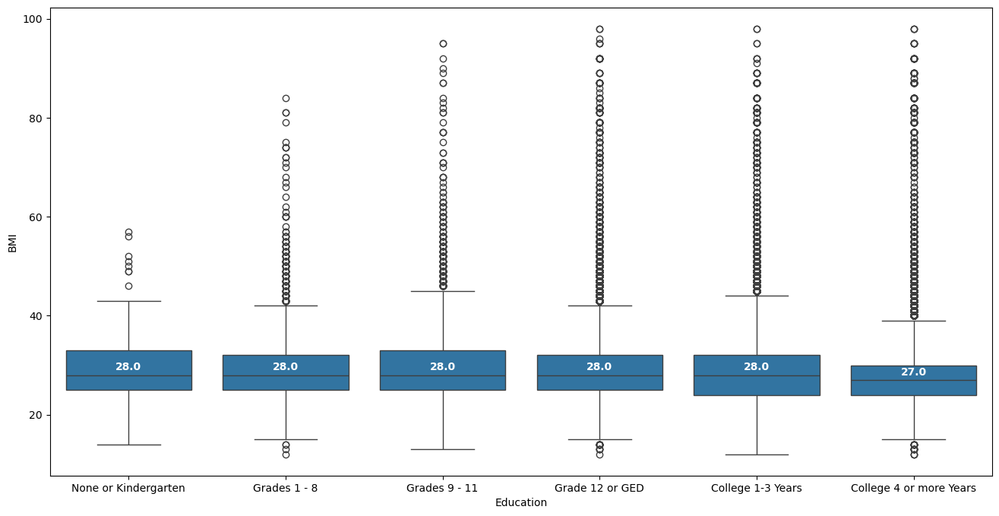

In [60]:
# Let's display the Box plot for Income against BMI

fig = plt.figure(figsize=(16, 8))

ax = sns.boxplot(data=df_original, x='Education', y='BMI')

medians = df_original.groupby(['Education'])['BMI'].median().values

for tick in range(len(ax.get_xticklabels())):
    ax.text(tick, medians[tick] + 1, medians[tick], horizontalalignment='center', color='w', weight='semibold')

plt.xticks(range(len(edu_labels)), edu_labels)
#yticks will be the min and max values of BMI scores

plt.show()

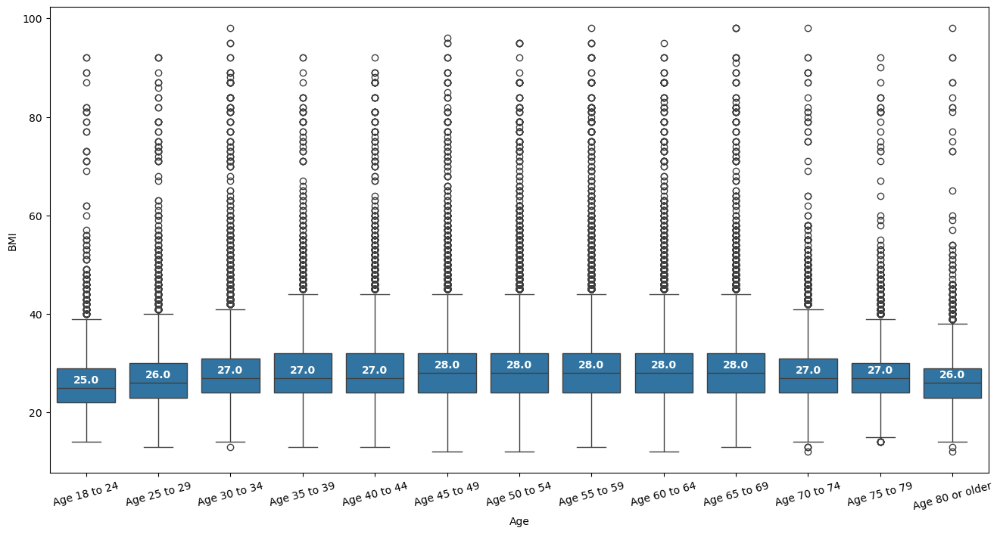

In [61]:
# Let's display the Box plot for Income against BMI

fig = plt.figure(figsize=(16, 8))

ax = sns.boxplot(data=df_original, x='Age', y='BMI')

medians = df_original.groupby(['Age'])['BMI'].median().values

for tick in range(len(ax.get_xticklabels())):
    ax.text(tick, medians[tick] + 1, medians[tick], horizontalalignment='center', color='w', weight='semibold')

plt.xticks(range(len(age_labels)), age_labels,rotation=15)
#yticks will be the min and max values of BMI scores

plt.show()

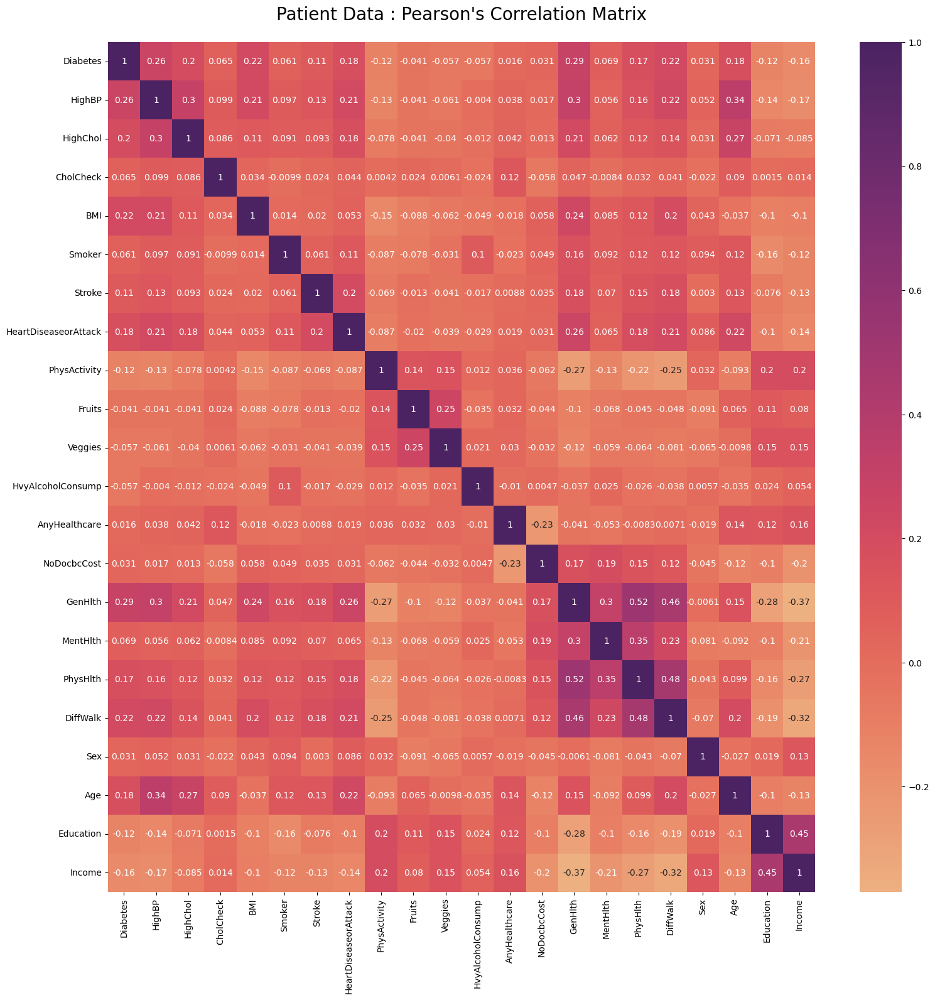

In [62]:
# Let's create a HeatMap to correlate all the numerical datasets

plt.figure(figsize=(16,16))
corr = df_original.corr()
sns.heatmap(corr, annot=True, cmap='flare')
plt.title('Patient Data : Pearson\'s Correlation Matrix', fontsize = 20, y=1.02)
plt.tight_layout()
plt.savefig('Pearsons Correlation - Patient Data.png')
plt.show()

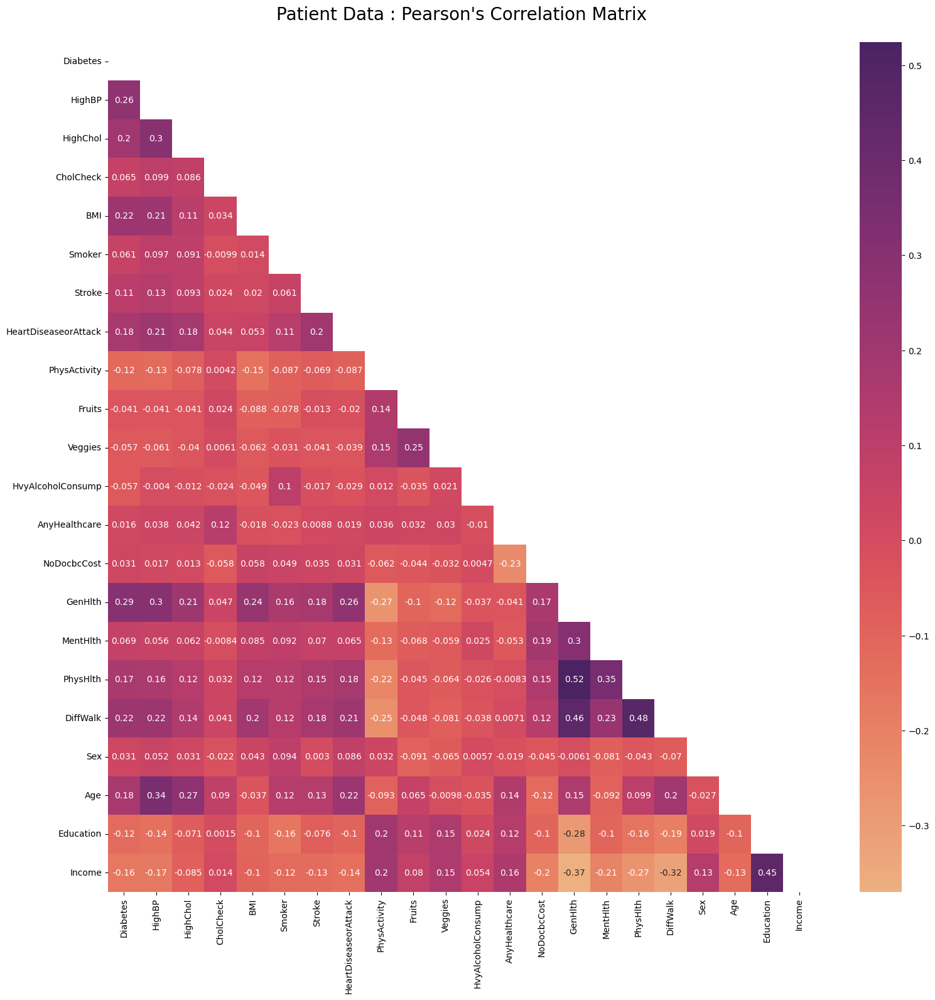

In [63]:
# Let's create a HeatMap to correlate all the numerical datasets

plt.figure(figsize=(16,16))
corr = df_original.corr()
matrix = np.triu(np.ones_like(corr, dtype=bool))

sns.heatmap(corr, annot=True, mask = matrix, cmap='flare')
plt.title('Patient Data : Pearson\'s Correlation Matrix', fontsize = 20, y=1.02)
plt.tight_layout()
plt.show()

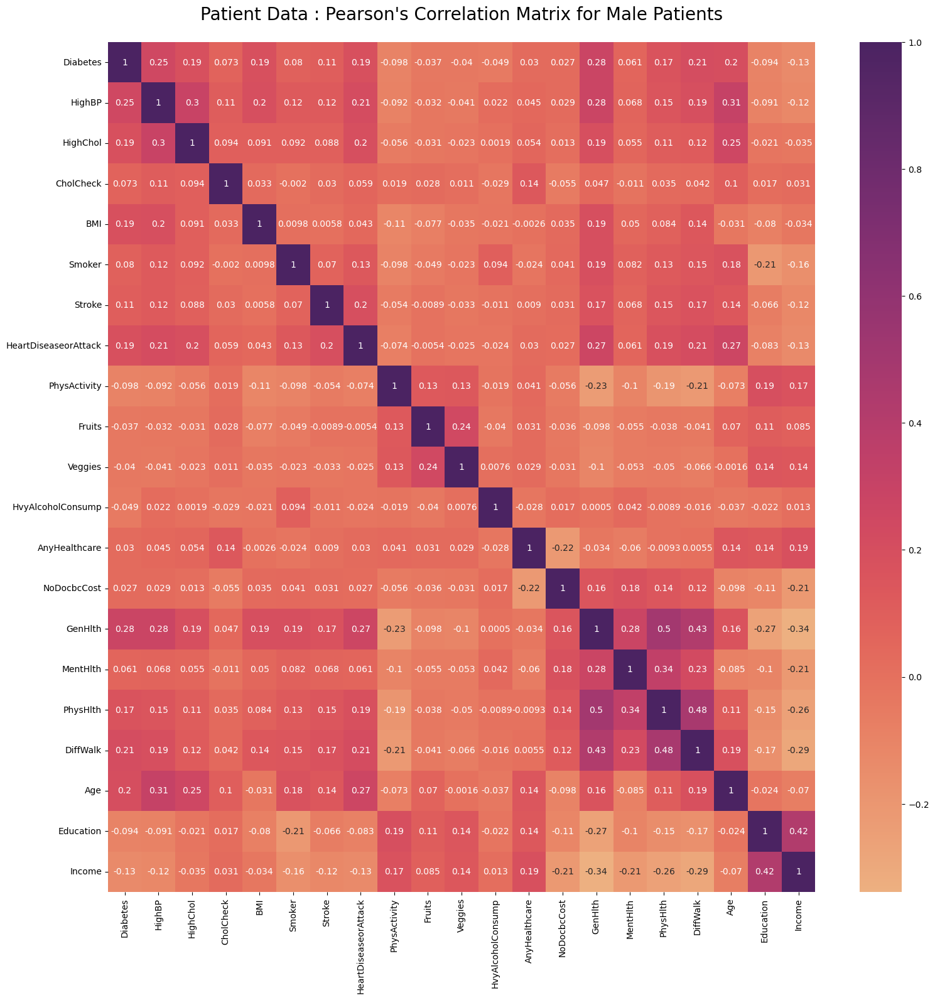

In [64]:
# Let's create a HeatMap to correlate all the numerical datasets for Male Patients

df_males = df_original[df_original['Sex']== 1]

df_males.drop('Sex', axis=1, inplace=True)

plt.figure(figsize=(16,16))
corr = df_males.corr()
sns.heatmap(corr, annot=True, cmap='flare')
plt.title('Patient Data : Pearson\'s Correlation Matrix for Male Patients', fontsize = 20, y=1.02)
plt.tight_layout()
plt.show()

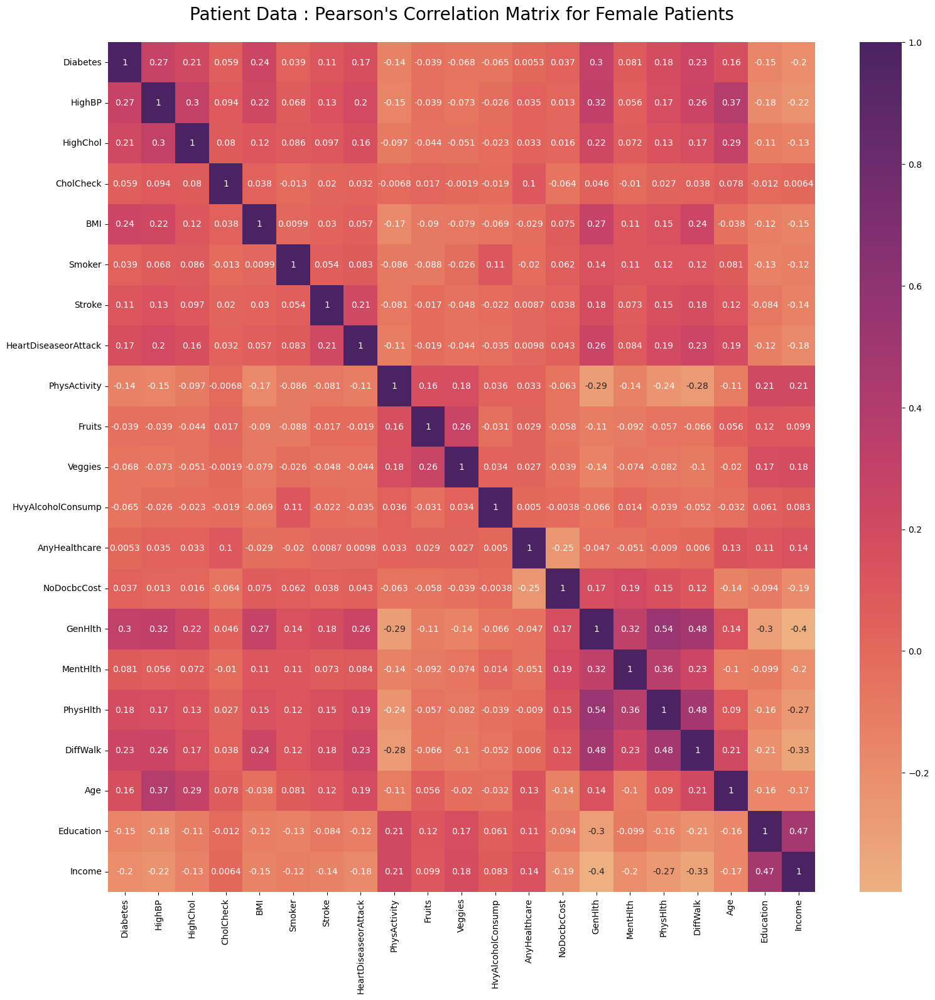

In [65]:
# Let's create a HeatMap to correlate all the numerical datasets for Female Patients

df_females = df_original[df_original['Sex']== 0]

df_females.drop('Sex', axis=1, inplace=True)

plt.figure(figsize=(16,16))
corr = df_females.corr()
sns.heatmap(corr, annot=True, cmap='flare')
plt.title('Patient Data : Pearson\'s Correlation Matrix for Female Patients', fontsize = 20, y=1.02)
plt.tight_layout()
plt.show()

In [66]:
Xf = X[X['Sex']== 0]  # X_female
Xm = X[X['Sex']== 1]  # X_male

Xf.drop('Sex', axis=1, inplace=True)
Xm.drop('Sex', axis=1, inplace=True)

In [67]:
ym = y.loc[Xm.index]  # y female
yf = y.loc[Xf.index]  # y male

In [68]:
Xm.shape, ym.shape

((111706, 20), (111706, 1))

In [69]:
Xf.shape, yf.shape

((141974, 20), (141974, 1))

In [70]:
# Let's create a list of all binary columns and build a pie plot grid to show the 

binary_cols = [col for col in Xf.columns if Xf[col].nunique() == 2]
print (binary_cols)

['HighBP', 'HighChol', 'CholCheck', 'Smoker', 'Stroke', 'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'DiffWalk']


In [71]:
cols_detailed = ['High BP', 'High Cholesterol', 'Cholesterol Check in last 5 Years', 
                 'Is a Smoker', 'Had a Stroke', 'Had a Heart Disease or Attack', 
                 'Physical Activity in last 30 days', 'Consumed Fruits', 'Consumed Veggies', 
                 'Heavy Alcohol Consumption', 'Any Healthcare Issues', 
                 'No Doctor Visit due to Cost', 'Difficulty in Walking']

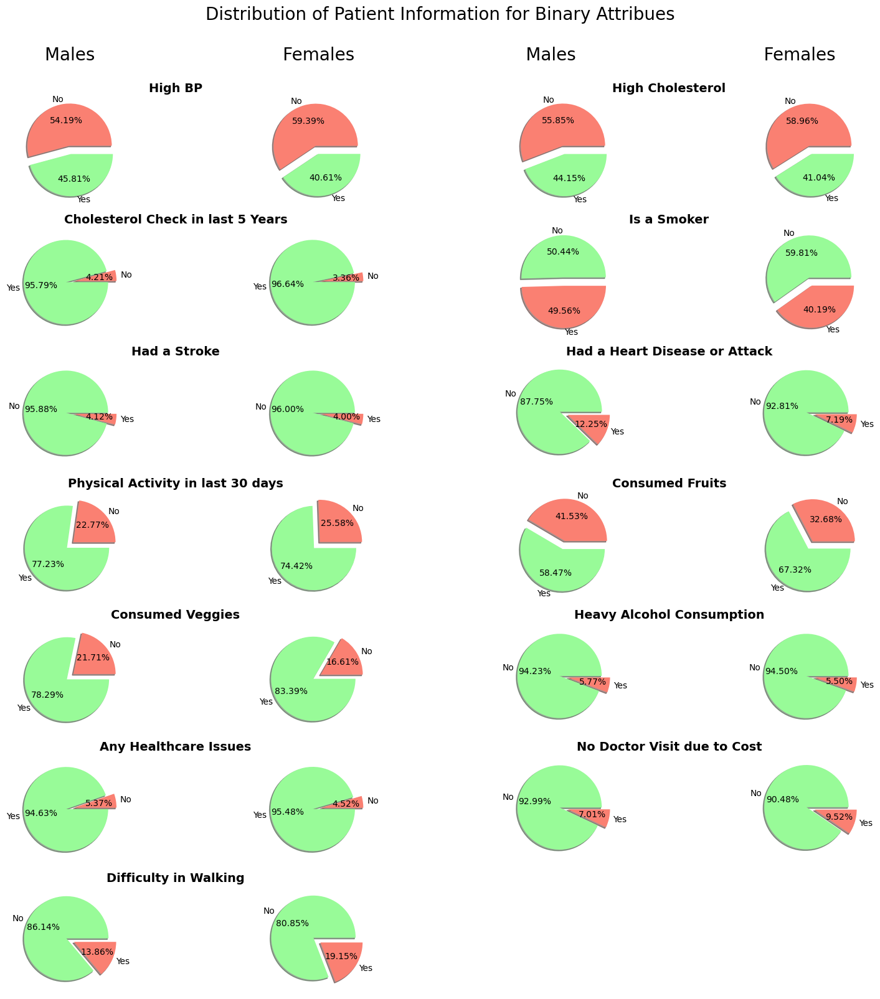

In [72]:
fig, axs = plt.subplots(nrows=7, ncols=4, figsize=(16, 16))

good_colors = ['salmon', 'palegreen']
bad_colors  = ['palegreen', 'salmon']

# Let's parse two columns at the same time and build the male and female comparison on the left side and right side.
# col 1 will have male for attribute odd  number attributes, col 2 will have female for attribute odd  number attributes,
# col 3 will have male for attribute even number attributes, col 4 will have female for attribute even number attributes

for i, col_1, col_2 in zip(range(len(binary_cols)//2),binary_cols[0::2], binary_cols[1::2]):
    grouped_vm_1 = Xm.groupby([col_1])[col_1].count().transform(lambda   x: x / x.sum() * 100)
    grouped_vf_1 = Xf.groupby([col_1])[col_1].count().transform(lambda x: x / x.sum() * 100)

    grouped_vm_2 = Xm.groupby([col_2])[col_2].count().transform(lambda   x: x / x.sum() * 100)
    grouped_vf_2 = Xf.groupby([col_2])[col_2].count().transform(lambda x: x / x.sum() * 100)

    
    label_val_m1 = grouped_vm_1.index.map({0:'No',1:'Yes'})
    label_val_f1 = grouped_vf_1.index.map({0:'No',1:'Yes'})

    label_val_m2 = grouped_vm_2.index.map({0:'No',1:'Yes'})
    label_val_f2 = grouped_vm_2.index.map({0:'No',1:'Yes'})
    
    if col_1 in ['Smoker', 'Stroke', 'HeartDiseaseorAttack', 'HvyAlcoholConsump', 'DiffWalk', 'NoDocbcCost']:
        color_set_1 = bad_colors
    else:
        color_set_1 = good_colors

    if col_2 in ['Smoker', 'Stroke', 'HeartDiseaseorAttack', 'HvyAlcoholConsump', 'DiffWalk', 'NoDocbcCost']:
        color_set_2 = bad_colors
    else:
        color_set_2 = good_colors

    texts, autotexts, wedges = axs[i,0].pie(grouped_vm_1,
                                      labels=label_val_m1,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = color_set_1,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )
    axs[i,0].set_title(cols_detailed[(i*2)], size=14, weight="bold", y=1, x = 1.5)

    texts, autotexts, wedges = axs[i,1].pie(grouped_vf_1,
                                      labels=label_val_f1,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = color_set_1,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )

    texts, autotexts, wedges = axs[i,2].pie(grouped_vm_2,
                                      labels=label_val_m2,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = color_set_2,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )
    axs[i,2].set_title(cols_detailed[(i*2)+1], size=14, weight="bold", y=1, x = 1.5)

    texts, autotexts, wedges = axs[i,3].pie(grouped_vf_2,
                                      labels=label_val_f2,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = color_set_2,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )


col_1 = binary_cols[-1]
grouped_vm_1 = Xm.groupby([col_1])[col_1].count().transform(lambda x: x / x.sum() * 100)
grouped_vf_1 = Xf.groupby([col_1])[col_1].count().transform(lambda x: x / x.sum() * 100)

texts, autotexts, wedges = axs[6,0].pie(grouped_vm_1,
                                      labels=label_val_m1,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = bad_colors,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )
axs[6,0].set_title(cols_detailed[-1], size=14, weight="bold", y=1, x = 1.5)

texts, autotexts, wedges = axs[6,1].pie(grouped_vf_1,
                                      labels=label_val_f1,
                                      shadow=True, explode=[0.1, 0.1],
                                      colors = bad_colors,
                                      startangle=0,
                                      autopct='%1.2f%%',
                                    )

axs[6, 2].set_visible(False)
axs[6, 3].set_visible(False)

line_1 = 'Distribution of Patient Information for Binary Attribues'
males_txt = 'Males'
females_txt = 'Females'

plt.suptitle(f'{line_1}\n\n{males_txt:<20} {females_txt:>25} {males_txt:>35} {females_txt:>40}',
             fontsize=20, y=1)
plt.tight_layout()
plt.savefig('Patient Information for Binary Attributes.png')
plt.show()

### Data Analysis - Conclusion

#### Data Quality:
We have a large population of data - 253,680 records to work with. There is an good distribution of data between male and female patients (56 - 44%). There are no null values and it helps to apply and train the machine learning models for better performance.

There is a small percentage of BMI data that are outside the normal ranges. 4.5% of the data is bad (BMI greater than 40) with some of them reaching closer to 100. Since this is a small portion, we should be OK to keep this for model evaluation. The median BMI shows as 28 which is a bit higher than normal rates. Since we are analyzing Diabetes Health, this data should be OK for modeling.

#### Data Distribution and Correlation:
Based on the analysis between Males and Females, a higher percentage of men smoke or have heart disease or heart attack.
Women seem to be more healthier than Men.

In general, most of the population have healthcare, can afford to visit a doctor, and periodically get their cholesterol checked.

The Pearson's Correlation shows that there are only a few attributes that have a strong correlation to the target variable (Diabetes). Some of the attributes do not have any correlation and we may be able to eliminate them. Further analysis is required to determine the attribute elimination.

## Feature Engineering

In [73]:
# Let's look at the original dataset from X and y
X.shape, y.shape

((253680, 21), (253680, 1))

### Principal Component Analysis

In [74]:
X_std = StandardScaler().fit_transform(X)

In [75]:
# creating a pca object and specifying the number of principal components, here PCA = 3
pca_3 = PCA(n_components=3) 

# applying fit and transforming x
principalComponents = pca_3.fit_transform(X_std)

principalComponents

array([[ 4.77569195, -0.43214148,  0.3356638 ],
       [ 0.57292634, -5.45915935, -1.55664967],
       [ 4.94131986, -1.79586563,  2.02481371],
       ...,
       [-1.30555165, -1.71669629, -0.15111092],
       [ 0.46393464, -0.12676433, -0.14465724],
       [ 0.78648932,  1.5785753 , -0.31414497]])

In [76]:
# Find out the Explained Variance Ratio for PCA = 3
pca_3.explained_variance_ratio_

array([0.16713006, 0.08396704, 0.06480288])

In Principal Component Analysis (PCA), the explained variance ratio is a metric that measures the amount of variance in a dataset that each principal component explains. It's used to evaluate the usefulness of the principal components and to decide how many to use in a model.

In [77]:
print (f'The Explained Variance Ratio is {round((pca_3.explained_variance_ratio_.sum()*100),2)}')

The Explained Variance Ratio is 31.59


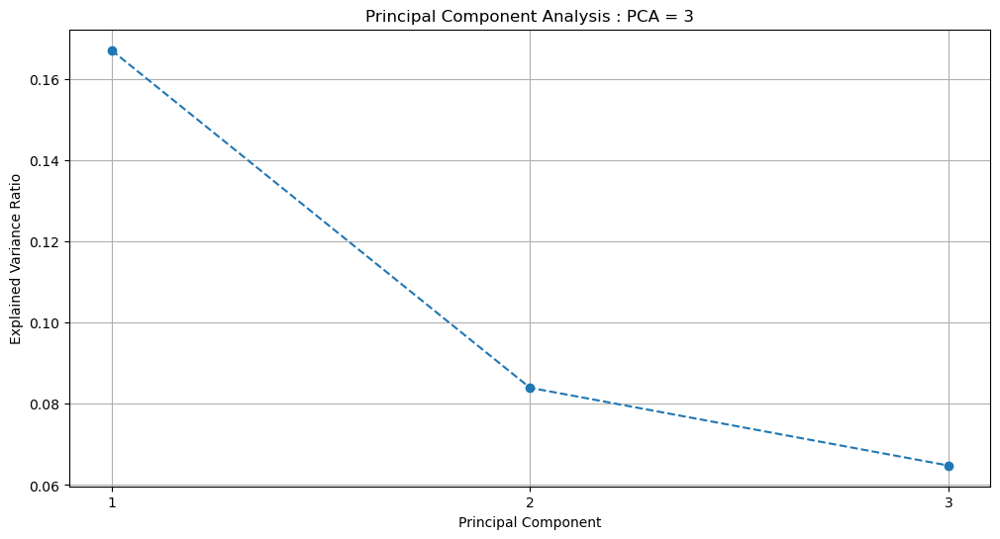

In [78]:
# Explained variance
explained_variance = pca_3.explained_variance_ratio_

# Scree plot
plt.figure(figsize=(12, 6))
plt.plot(range(1, len(explained_variance) + 1), explained_variance, marker='o', linestyle='--')
plt.title('Principal Component Analysis : PCA = 3')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.xticks(np.arange(1, len(explained_variance) + 1, step=1))
plt.grid(True)
plt.show()

In [79]:
# specifying the number of components
principalDf = pd.DataFrame(data = principalComponents
             , columns = ['PCA_1', 'PCA_2', 'PCA_3'])

# concatenating the target values and the new principal components

finalDf = pd.concat([principalDf, y], axis = 1)

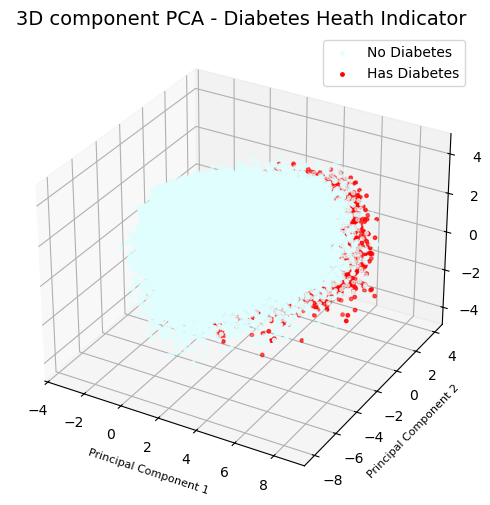

In [80]:
# Visualization of the PCA 

fig = plt.figure(figsize = (12,6))
ax = fig.add_subplot(111, projection='3d')

ax.set_xlabel('Principal Component 1', fontsize = 8)
ax.set_ylabel('Principal Component 2', fontsize = 8)
ax.set_zlabel('Principal Component 3', fontsize = 8)
ax.set_title('3D component PCA - Diabetes Heath Indicator', fontsize = 14)
targets = [0,1]
colors = ['lightcyan', 'red']
for target, color in zip(targets,colors):
    indicesToKeep = finalDf['Diabetes_binary'] == target
    ax.scatter(finalDf.loc[indicesToKeep, 'PCA_1']
               , finalDf.loc[indicesToKeep, 'PCA_2']
               , finalDf.loc[indicesToKeep, 'PCA_3']
               , c = color
               , s = 6
               )


mapping = {0:'No Diabetes',1:'Has Diabetes'}
ax.legend([mapping.get(m, m) for m in targets ])

ax.grid()
plt.show()

In [ ]:
fig = plt.figure(figsize = (12,6))

fig = px.scatter_3d(data_frame=finalDf, 
              x = 'PCA_3', 
              y = 'PCA_2', 
              z = 'PCA_1',
              range_x=[int(finalDf['PCA_1'].min()*0.5),int(finalDf['PCA_1'].max()*.5)], 
              range_y=[int(finalDf['PCA_2'].min()*0.5),int(finalDf['PCA_2'].max()*.5)], 
              range_z=[int(finalDf['PCA_3'].min()*0.5),int(finalDf['PCA_3'].max()*.5)],
              color = 'Diabetes_binary')
fig.update_traces(marker_size = 3)
#fig.layout.scene.aspectratio = {'x':1, 'y':1, 'z':1}
fig.update_layout(margin=dict(l=0, r=0, b=0, t=0))
fig.show()

### Principal Component Analysis for 2 to 20 

In [82]:
# Calculate the Principal Component Analysis explained variance ratio for the total number of columns in X
pn = []

print ('The Explained Variance Ratio for')

X_std = StandardScaler().fit_transform(X)

for n in range (2, len(X.columns)):

    # creating a pca object and specifying the number of principal components
    pca_x = PCA(n_components=n) 

    # applying fit and transforming x
    principalComponents = pca_x.fit_transform(X_std)
    
    pnx = round((pca_x.explained_variance_ratio_.sum()*100),2)
    pn.append(pnx)
    
    print ('PCA={:2} is {:.2f}%'.format(n, pnx))

The Explained Variance Ratio for
PCA= 2 is 25.11%
PCA= 3 is 31.59%
PCA= 4 is 37.26%
PCA= 5 is 42.77%
PCA= 6 is 47.95%
PCA= 7 is 52.86%
PCA= 8 is 57.38%
PCA= 9 is 61.78%
PCA=10 is 65.97%
PCA=11 is 69.83%
PCA=12 is 73.61%
PCA=13 is 77.16%
PCA=14 is 80.65%
PCA=15 is 84.04%
PCA=16 is 87.39%
PCA=17 is 90.56%
PCA=18 is 93.21%
PCA=19 is 95.64%
PCA=20 is 97.99%


In [83]:
# creating a pca object and specifying the number of principal components, here PCA = 3
pca_20 = PCA(n_components=20) 

# applying fit and transforming x
principalComponents = pca_20.fit_transform(X_std)

# Find out the Explained Variance Ratio for PCA = 20
pca_20.explained_variance_ratio_

array([0.16713006, 0.08396704, 0.06480288, 0.05667649, 0.05512874,
       0.05176754, 0.04916833, 0.04515407, 0.04399236, 0.04190459,
       0.03864939, 0.03771927, 0.03557995, 0.03488982, 0.03391184,
       0.03346775, 0.03166342, 0.0265529 , 0.02430867, 0.02348267])

### Plot the Elbow and identify optimal k

<Figure size 1200x600 with 0 Axes>

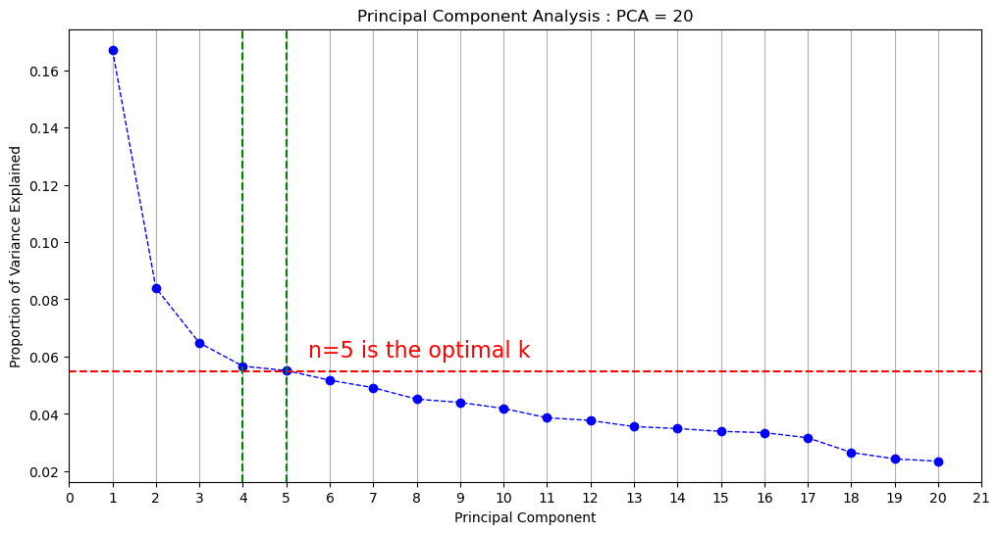

In [84]:
# Plot the Principal Component Analysis graph for PCA = 20
fig = plt.figure(figsize = (12,6))
PC20values = np.arange(pca_20.n_components_) + 1
plt.plot(PC20values, pca_20.explained_variance_ratio_, 'bo--', linewidth=1)
plt.title('Principal Component Analysis : PCA = 20')
plt.xlabel('Principal Component')
plt.ylabel('Proportion of Variance Explained')
plt.xticks(np.arange(0, 22, step=1)) #change from 0-based array index to 1-based human-readable label
plt.axhline(y=0.055, color='r', linestyle='--')
plt.axvline(x=4, color='g', linestyle='--')
plt.axvline(x=5, color='g', linestyle='--')
plt.text(5.5, 0.06, 'n=5 is the optimal k', color = 'red', fontsize=16)
plt.grid(axis='x')
plt.show()

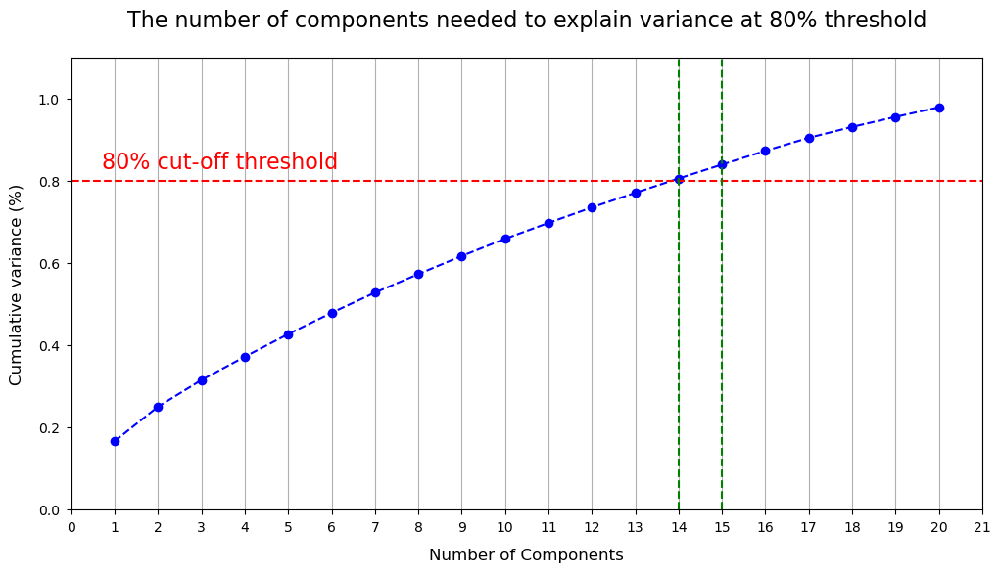

In [85]:
fig, ax = plt.subplots(figsize = (12,6))
xi = np.arange(1, 21, step=1)
yi = np.cumsum(pca_20.explained_variance_ratio_)

plt.ylim(0.0,1.1)
plt.plot(xi, yi, marker='o', linestyle='--', color='b')

plt.xlabel('Number of Components',fontsize=12, labelpad = 10)
plt.xticks(np.arange(0, 22, step=1)) #change from 0-based array index to 1-based human-readable label
plt.ylabel('Cumulative variance (%)',fontsize=12, labelpad = 10)
plt.title('The number of components needed to explain variance at 80% threshold', y = 1.05, fontsize=16)

plt.axhline(y=0.80, color='r', linestyle='--')
plt.axvline(x=14, color='g', linestyle='--')
plt.axvline(x=15, color='g', linestyle='--')
plt.text(0.7, 0.83, '80% cut-off threshold', color = 'red', fontsize=16)
ax.grid(axis='x')
ax.tick_params(axis='both', which='major', pad=5)
plt.show()

In [86]:
# Convert the PCA information into PCA = 14 into a dataframe for KMeans analysis

X_std = StandardScaler().fit_transform(X)

# creating a pca object and specifying the number of principal components, here PCA = 3
pca_14 = PCA(n_components=14) 

# applying fit and transforming x
principalComponents = pca_14.fit_transform(X_std)

data_pca = pd.DataFrame(data=principalComponents,
                        columns=[f'PC{i}' for i in range(1, 15)])

### Apply k-means++

In [87]:
# create the kmeans df to capture the 
X_kmeans = X.copy()

n_clusters=5
kmeans = KMeans(n_clusters, init='k-means++', random_state=42)
kmeans.fit(data_pca)

# Add the kmeans_cluster column to PCA and kmeans DFs
data_pca['kmeans_cluster'] = kmeans.labels_
X_kmeans['kmeans_cluster'] = kmeans.labels_
print('k-means++ Inertia: {:,.2f}'.format(kmeans.inertia_))

k-means++ Inertia: 3,019,189.52


In the K-means clustering algorithm, inertia is a metric that measures how well a dataset has been clustered. It's calculated by measuring the distance between each data point and its centroid, squaring the distance, and summing the squares for each data point in the cluster.

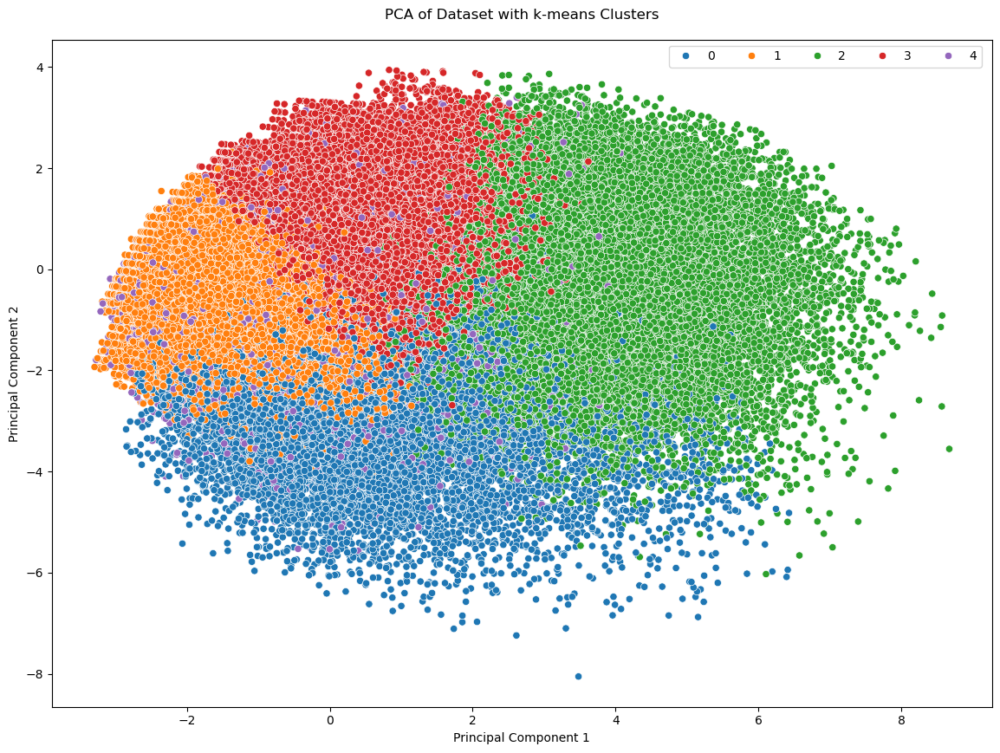

In [88]:
plt.figure(figsize=(14, 10))
sns.scatterplot(x='PC1', y='PC2', hue='kmeans_cluster', palette='tab10', data=data_pca)
plt.title('PCA of Dataset with k-means Clusters', y=1.02)
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend(bbox_to_anchor=(0.65, 1),loc='upper left', ncols=5)
plt.show()

##### Let's analyze the kMeans Clusters one by one for each of the 6 clusters

### Without any clustering
Let's review the Pearson's Correlation / Heatmap in the original form

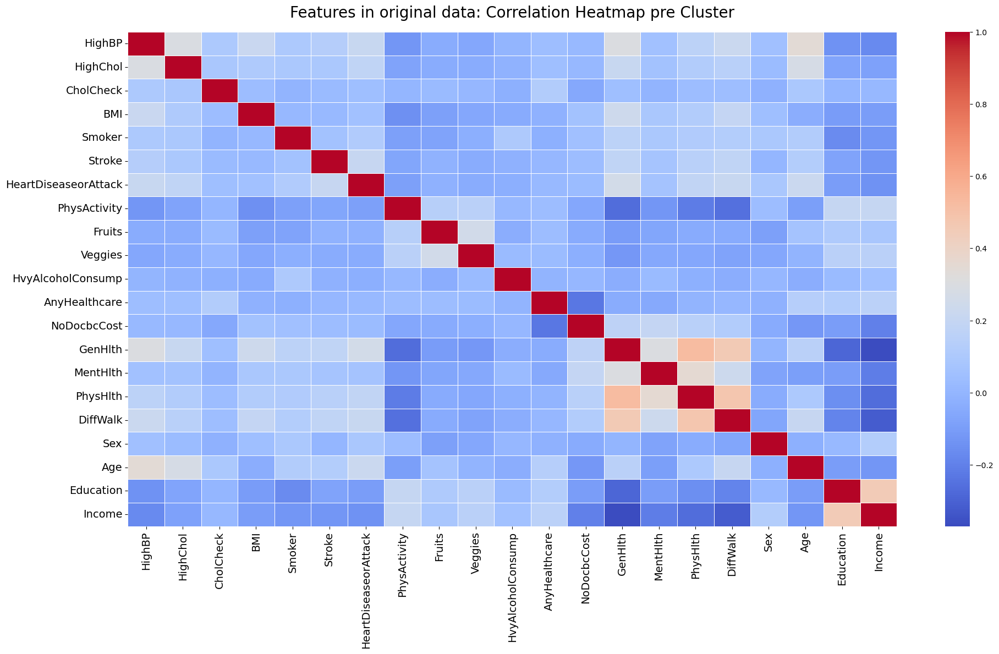

In [89]:
# Heatmap without kMeans Clustering
plt.figure(figsize=(20, 12))
sns.heatmap(X.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in original data: Correlation Heatmap pre Cluster', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

### With One (1) kMeans Cluster
Let's see how the Pearson's Correlation / Heatmap looks

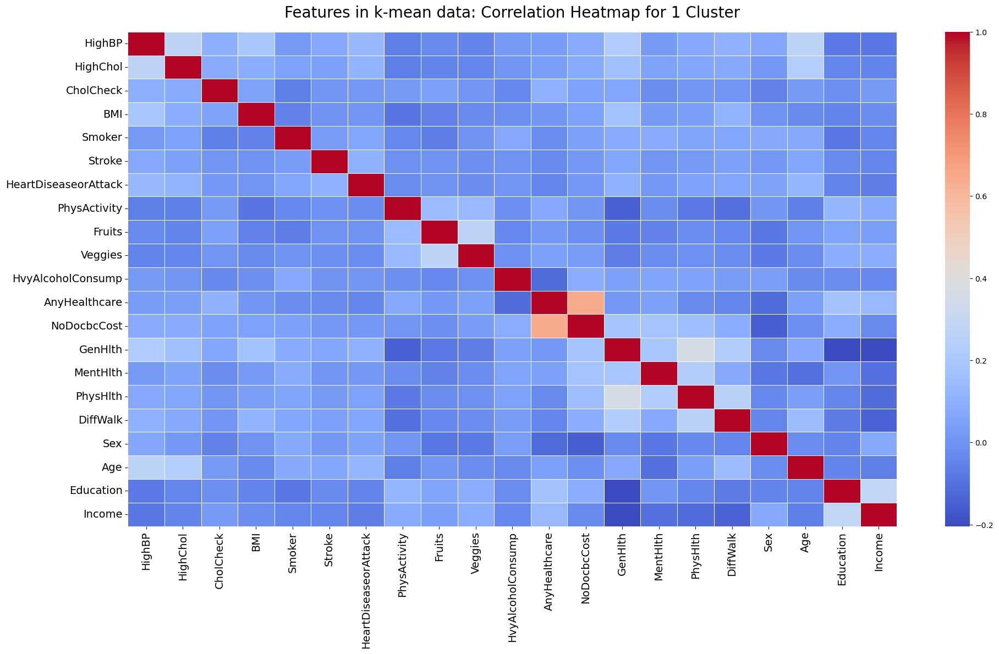

In [90]:
# Heatmap with kMeans Cluster = 0
plt.figure(figsize=(20, 12))
X_corr = X_kmeans.query('kmeans_cluster == 0')
X_corr.drop('kmeans_cluster',axis=1,inplace=True)
sns.heatmap(X_corr.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in k-mean data: Correlation Heatmap for 1 Cluster', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

### With Two (2) kMeans Cluster
Let's see how the Pearson's Correlation / Heatmap looks

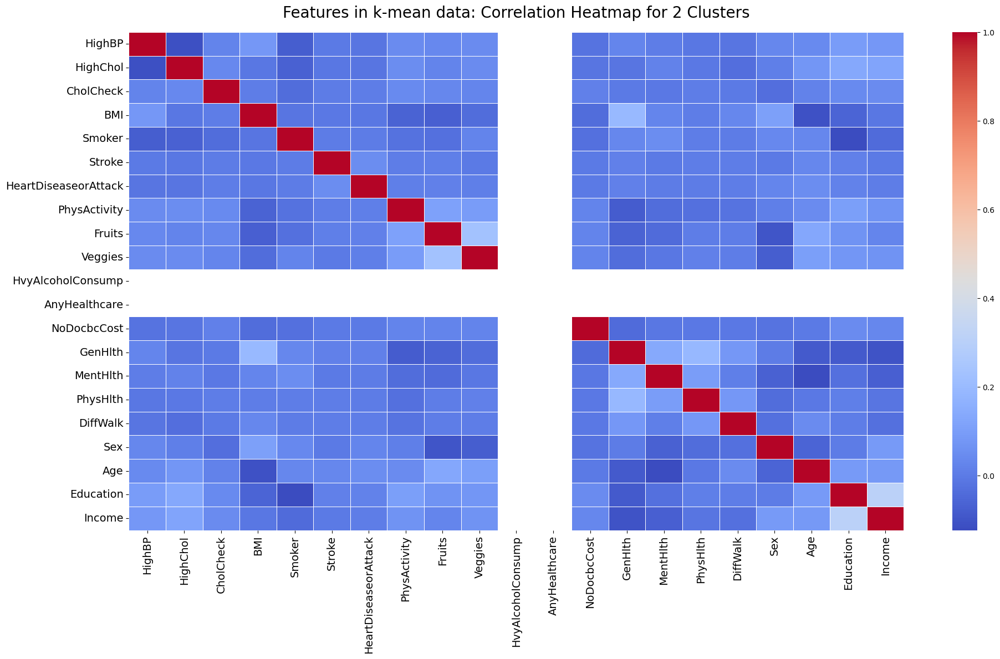

In [91]:
# Heatmap with kMeans Cluster = 1
plt.figure(figsize=(20, 12))
X_corr = X_kmeans.query('kmeans_cluster == 1')
X_corr.drop('kmeans_cluster',axis=1,inplace=True)
sns.heatmap(X_corr.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in k-mean data: Correlation Heatmap for 2 Clusters', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

### With Three (3) kMeans Cluster
Let's see how the Pearson's Correlation / Heatmap looks

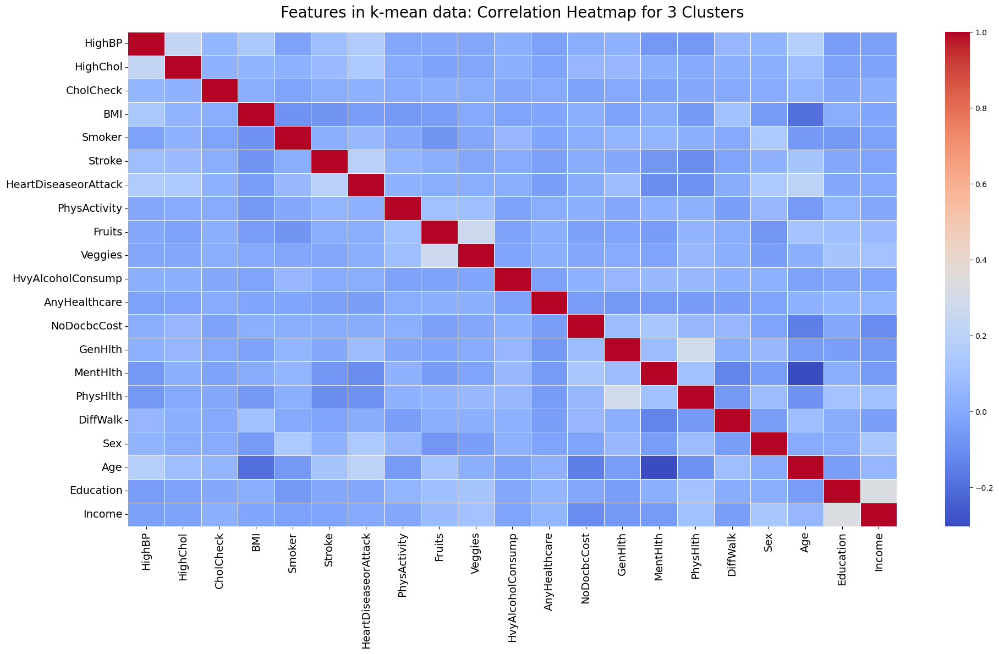

In [92]:
# Heatmap with kMeans Cluster = 2
plt.figure(figsize=(20, 12))
X_corr = X_kmeans.query('kmeans_cluster == 2')
X_corr.drop('kmeans_cluster',axis=1,inplace=True)
sns.heatmap(X_corr.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in k-mean data: Correlation Heatmap for 3 Clusters', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

### With Four (4) kMeans Cluster
Let's see how the Pearson's Correlation / Heatmap looks

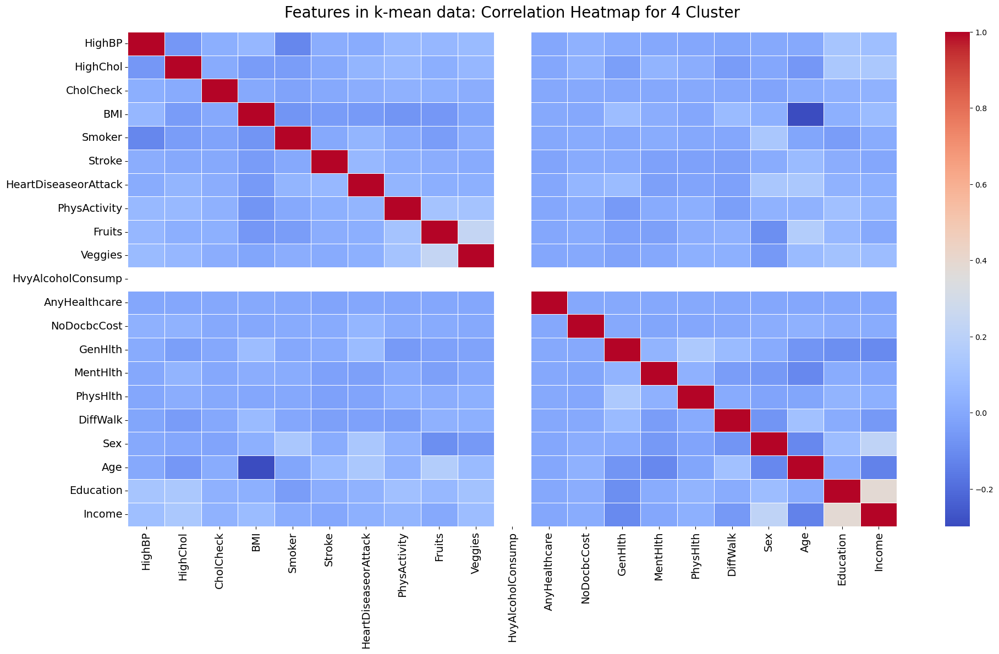

In [93]:
# Heatmap with kMeans Cluster = 3
plt.figure(figsize=(20, 12))
X_corr = X_kmeans.query('kmeans_cluster == 3')
X_corr.drop('kmeans_cluster',axis=1,inplace=True)
sns.heatmap(X_corr.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in k-mean data: Correlation Heatmap for 4 Cluster', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

### With Five (5) kMeans Cluster
Let's see how the Pearson's Correlation / Heatmap looks

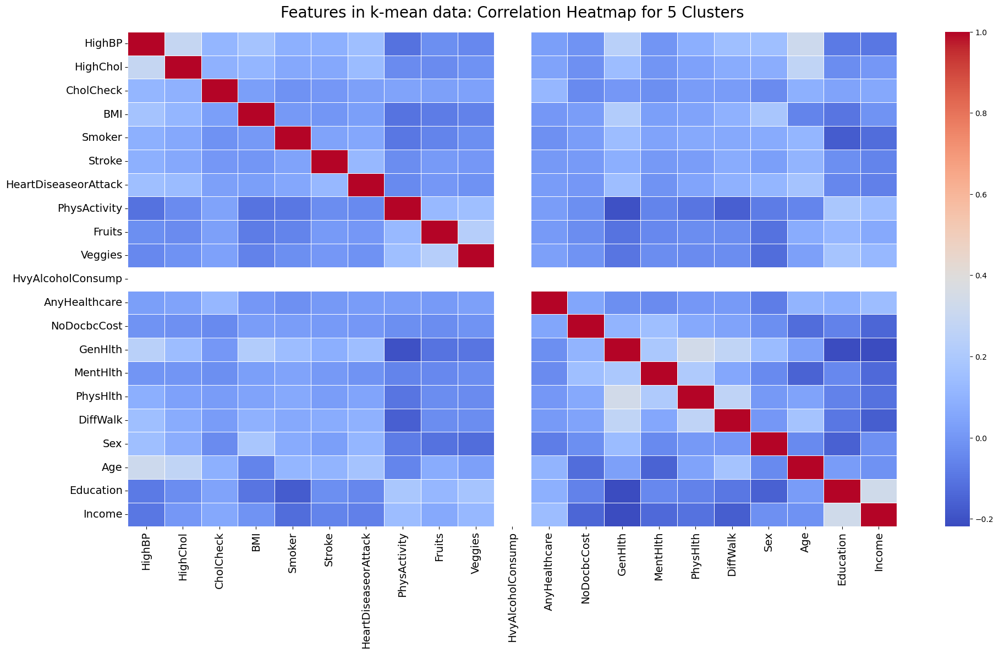

In [94]:
# Heatmap with kMeans Cluster = 4
plt.figure(figsize=(20, 12))
X_corr = X_kmeans.query('kmeans_cluster == 4')
X_corr.drop('kmeans_cluster',axis=1,inplace=True)
sns.heatmap(X_corr.corr(), annot=False, cmap='coolwarm', linewidths=0.5)
plt.title('Features in k-mean data: Correlation Heatmap for 5 Clusters', fontsize = 20, y=1.02)
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
plt.tight_layout()
plt.show()

In [95]:
# Let's split the data into training and test sets. We will use 70% of the data for training and 30% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42,stratify=y)

In [96]:
X_train.shape, X_test.shape

((177576, 21), (76104, 21))

In [97]:
y_train.shape, y_test.shape

((177576, 1), (76104, 1))

### Baseline Model - Dummy Classifier Model

In [98]:
# Create a Baseline Model using the DummyClassifier

# A baseline model for classification is a basic model that serves as a reference point for evaluating 
# other models' performance and guiding the development of more complex models

baseline_model = DummyClassifier(strategy="most_frequent")
baseline_model.fit(X_train, y_train)

# Make predictions
y_pred = baseline_model.predict(X_test)

# Evaluate performance
precision = precision_score(y_test, y_pred)
recall    = recall_score(y_test, y_pred)
accuracy  = accuracy_score(y_test, y_pred)
fscore    = f1_score(y_test, y_pred)

print('Baseline Model using Dummy Classifier')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

Baseline Model using Dummy Classifier
Precision is: 0.00
Recall    is: 0.00
F1 Score  is: 0.00
Accuracy  is: 0.86


In [99]:
# Let's evaluate the Confusion Matrix and print the results
conf_matrix = confusion_matrix(y_test, y_pred)

print(conf_matrix)

y_pred_1d = y_pred.ravel()
y_test_1d = y_test.values.ravel()
pd.crosstab(y_test_1d, y_pred_1d, rownames=['True'], colnames=['Predicted'], margins=True)

[[65500     0]
 [10604     0]]


Predicted,0,All
True,,
0,65500,65500
1,10604,10604
All,76104,76104


In [100]:
# Let us cross check the values against y_test, 
# we can see that the prediction from the Baseline Model (DummyClassifer) is the same as the groupby counts of y_test values

pd.DataFrame(y_test.groupby('Diabetes_binary').size(), columns = ['Total'])

,Total
Diabetes_binary,
0,65500
1,10604


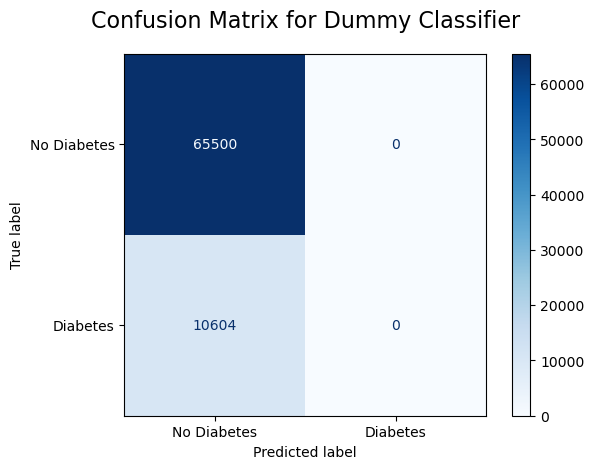

In [101]:
# Let's print the confusion matrix 

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test, y_pred, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'] )
plt.title('Confusion Matrix for Dummy Classifier', fontsize = 16, y=1.05)
plt.tight_layout()
plt.show()

In [102]:
# ROC Curve
y_score_yes = baseline_model.predict_proba(X_test)[:, 1]
fpr, tpr, thresholds = roc_curve(y_test, y_score_yes, pos_label=1)

roc_auc_value = auc(fpr, tpr)
print (f'The Accuracy Score : AUC is {roc_auc_value:.2f}')

roc_auc_val = roc_auc_score(y_test, y_score_yes)

print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}')

The Accuracy Score : AUC is 0.50
The ROC Accuracy Score : ROC-AUC is 0.50


### Regression Model - Logistic Regression

In [103]:
# Create a basic Logistic Regression Model
lr_model = LogisticRegression()

# Train the basic Logistic Regression Model
lr_model.fit(X_train, y_train)

# Make the Prediction using the basic Logistic Regression Model on the X_test data
lr_pred = lr_model.predict(X_test)

In [104]:
# Evaluate the performance of the model
precision = precision_score(y_test, lr_pred)
recall    = recall_score(y_test, lr_pred)
accuracy  = accuracy_score(y_test, lr_pred)
fscore    = f1_score(y_test, lr_pred)

print('Logistic Regression basic model')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

Logistic Regression basic model
Precision is: 0.52
Recall    is: 0.15
F1 Score  is: 0.23
Accuracy  is: 0.86


In [105]:
# Let's evaluate the Confusion Matrix and print the results
conf_matrix = confusion_matrix(y_test, lr_pred)

print(conf_matrix)

TN = conf_matrix[0, 0]
FP = conf_matrix[0, 1]
FN = conf_matrix[1, 0]
TP = conf_matrix[1, 1]

print()

print (f'True Positive  : {TP:4}')
print (f'True Negative  : {TN:4}')
print (f'False Positive : {FP:4}')
print (f'False Negative : {FN:4}')
print()

y_pred_1d = lr_pred.ravel()
y_test_1d = y_test.values.ravel()
pd.crosstab(y_test_1d, y_pred_1d, rownames=['True'], colnames=['Predicted'], margins=True)

[[64082  1418]
 [ 9048  1556]]

True Positive  : 1556
True Negative  : 64082
False Positive : 1418
False Negative : 9048



Predicted,0,1,All
True,,,
0,64082,1418,65500
1,9048,1556,10604
All,73130,2974,76104


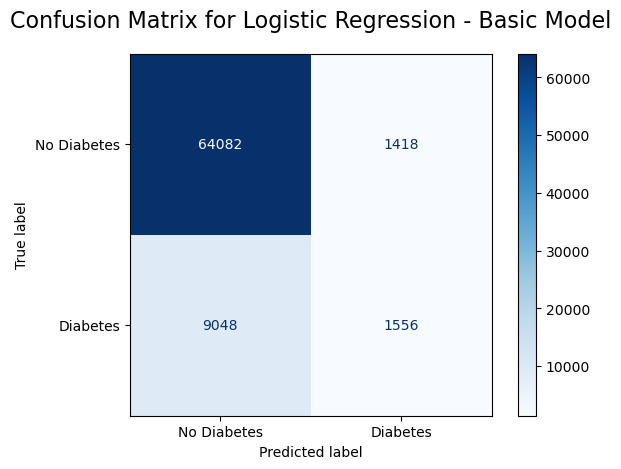

In [106]:
# Let's print the confusion matrix 

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test, lr_pred, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix for Logistic Regression - Basic Model', fontsize = 16, y=1.05)
plt.tight_layout()
plt.show()

In [107]:
precision = precision_score(y_test, lr_pred)
recall    = recall_score(y_test, lr_pred)
accuracy  = accuracy_score(y_test, lr_pred)
fscore    = f1_score(y_test, lr_pred)

print(f'Performance Report for Logistic Regression\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(y_test, lr_pred))

Performance Report for Logistic Regression

Precision is: 0.52
Recall    is: 0.15
F1 Score  is: 0.23
Accuracy  is: 0.86

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.98      0.92     65500
           1       0.52      0.15      0.23     10604

    accuracy                           0.86     76104
   macro avg       0.70      0.56      0.58     76104
weighted avg       0.83      0.86      0.83     76104



### Regression Model - Support Vector Machines

In [108]:
# Let's split the data into training and test sets for males only. We will use 70% of the data for training and 30% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.

X_train, X_test, y_train, y_test = train_test_split(Xm, ym, test_size = 0.3, random_state=42,stratify=ym)

In [109]:
# Create a basic Support Vector Machine Model
sv_model = SVC(probability=True)

# Train the basic Logistic Regression Model
sv_model.fit(X_train, y_train)

# Make the Prediction using the basic Logistic Regression Model on the X_test data
sc_pred = sv_model.predict(X_test)

In [110]:
# Let's evaluate the Confusion Matrix and print the results
conf_matrix = confusion_matrix(y_test, sc_pred)

print(conf_matrix)

TN = conf_matrix[0, 0]
FP = conf_matrix[0, 1]
FN = conf_matrix[1, 0]
TP = conf_matrix[1, 1]

print()

print (f'True Positive  : {TP:4}')
print (f'True Negative  : {TN:4}')
print (f'False Positive : {FP:4}')
print (f'False Negative : {FN:4}')
print()

y_pred_1d = sc_pred.ravel()
y_test_1d = y_test.values.ravel()
pd.crosstab(y_test_1d, y_pred_1d, rownames=['True'], colnames=['Predicted'], margins=True)

[[28379    52]
 [ 5017    64]]

True Positive  :   64
True Negative  : 28379
False Positive :   52
False Negative : 5017



Predicted,0,1,All
True,,,
0,28379,52,28431
1,5017,64,5081
All,33396,116,33512


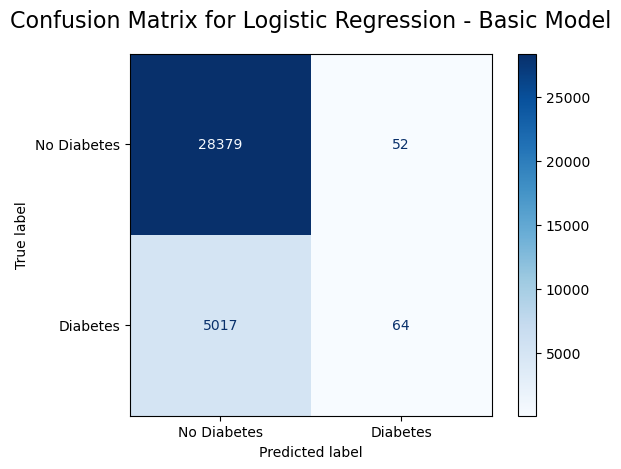

In [111]:
# Let's print the confusion matrix 

# Confusion Matrix
ConfusionMatrixDisplay.from_predictions(y_test, sc_pred, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title('Confusion Matrix for Logistic Regression - Basic Model', fontsize = 16, y=1.05)
plt.tight_layout()
plt.show()

In [112]:
precision = precision_score(y_test, sc_pred)
recall    = recall_score(y_test, sc_pred)
accuracy  = accuracy_score(y_test, sc_pred)
fscore    = f1_score(y_test, sc_pred)

print(f'Performance Report for Support Vector Machines\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(y_test, sc_pred))

Performance Report for Support Vector Machines

Precision is: 0.55
Recall    is: 0.01
F1 Score  is: 0.02
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     28431
           1       0.55      0.01      0.02      5081

    accuracy                           0.85     33512
   macro avg       0.70      0.51      0.47     33512
weighted avg       0.80      0.85      0.78     33512



**Observations**
The results from Support Vector Machines shows a recall value of 0.01 with accuracy at 0.85. The processing time was also very high. Due to these factors, we will skip evaluating Support Vector Machines from future analysis.

In [113]:
# Initialize all the models requested in this exercise
# Models are: Logistic Regression, Decision Tree Classifer, K Nearest Neighbor Classifer, and Support Vector Machines
model_dict = {
    'Dummy Classifier': DummyClassifier(),
    'Logistic Regression': LogisticRegression(),
    'Decision Tree Classifier': DecisionTreeClassifier(),
    'K Nearest Neighbor Classifier': KNeighborsClassifier(),
}

In [114]:
# Before we get started, let's create a function to do some routine tasks

# Function to Evaluate the performance of the model and Print the Results
def print_performance(pred_val, model_name):
    
    precision = precision_score(y_test, pred_val)
    recall    = recall_score(y_test, pred_val)
    accuracy  = accuracy_score(y_test, pred_val)
    fscore    = f1_score(y_test, pred_val)

    print(f'Performance Report for {model_name}\n')
    print(f'Precision is: {precision:.2f}')
    print(f'Recall    is: {recall:.2f}')
    print(f'F1 Score  is: {fscore:.2f}')
    print(f'Accuracy  is: {accuracy:.2f}')

    # Classification report
    print('\nClassification Report:')
    print(classification_report(y_test, pred_val))
    return precision, recall, accuracy, fscore

In [115]:
# Function to Evaluate the Confusion Matrix and Print the Results
def print_confusion_matrix(pred_val, model_name):
    
    conf_matrix = confusion_matrix(y_test, pred_val)

    TN = conf_matrix[0, 0]
    FP = conf_matrix[0, 1]
    FN = conf_matrix[1, 0]
    TP = conf_matrix[1, 1]

    print(f'Results for {model_name}\n')
    print('Confusion Matrix:\n')
    print(conf_matrix)
    print()

    print (f'True Negative  : {TN:4}')
    print (f'False Positive : {FP:4}')
    print (f'False Negative : {FN:4}')
    print (f'True Positive  : {TP:4}')
    print()
    
    y_pred_1d = pred_val.ravel()
    y_test_1d = y_test.values.ravel()
    ctab = pd.crosstab(y_test_1d, y_pred_1d, rownames=['True'], colnames=['Predicted'], margins=True)

    print(ctab)

    # Let's print the confusion matrix 

    # Confusion Matrix
    ConfusionMatrixDisplay.from_predictions(y_test, pred_val, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
    plt.title(f'Confusion Matrix for {model_name}', y=1.02)
    plt.tight_layout()
    plt.show()
    return conf_matrix, TN, FP, FN, TP

In [116]:
# Function to calculate the ROC Accuracy Score and Print the Results

def print_roc_scores(y_prob,model_name):
    print(f'Model Name: {model_name}\n')
    
    fpr, tpr, thresholds = roc_curve(y_test, y_prob, pos_label=1)

    roc_auc_val = roc_auc_score(y_test, y_prob)

    print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}\n')

    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_val:.2f})')
    plt.plot([0, 1], [0, 1], 'k--',color='red')
    plt.xlabel('False Positive Rate (FPR)')
    plt.ylabel('True Positive Rate (TPR)')
    plt.title(f'{model_name} : Receiver Operating Characteristic (ROC) Curve',y=1.03)
    plt.legend(loc='lower right')
    plt.show()
    return roc_auc_val, fpr, tpr

In [117]:
# Function to create the Evaluate the Model (Train the model /Fit the model, then perform prediction using Predict)
# We will also calculate the time to train the model and print all the key values using the print functions we defined

# Use a flag for Optimized to check if we are doing basic model review or optimization model reviews

def evaluate_model(model, model_name, optimized):

    # Train the Model and also capture the training time
    tic=timeit.default_timer()
    if model_name in ['K Nearest Neighbor Classifier', 'Support Vector Machines']:
        model.fit(X_train.values, y_train)
    else:
        model.fit(X_train, y_train)
    toc=timeit.default_timer()
    tsec = toc - tic #elapsed time in seconds
    
    print (f'Results for {model_name}\n')
    print (f'Training Time     : {tsec:.4f} seconds\n')

    # Calculate the Training and Test Accuracy
    if model_name in ['K Nearest Neighbor Classifier', 'Support Vector Machines']:
        train_accuracy = model.score(X_train.values, y_train)
        test_accuracy  = model.score(X_test.values, y_test)
    else:
        train_accuracy = model.score(X_train, y_train)
        test_accuracy  = model.score(X_test, y_test)
    
    print (f'Training Accuracy : {train_accuracy:.2f}\n')
    print (f'Test     Accuracy : {test_accuracy:.2f}\n')

    #For Optimization request, use best_estimator to pick the predict values and predict probability
    if optimized:
        best_model = model.best_estimator_
        if model_name in ['K Nearest Neighbor Classifier', 'Support Vector Machines']:
            pred_val = best_model.predict(X_test.values)
            y_prob  = best_model.predict_proba(X_test.values)[:, 1]
        else:
            pred_val = best_model.predict(X_test)
            y_prob  = best_model.predict_proba(X_test)[:, 1]

        evaluate_feature_importance(model, X_test, y_test)
    else:
        # Predict the results for the model
        if model_name in ['K Nearest Neighbor Classifier', 'Support Vector Machines']:
            pred_val = model.predict(X_test.values)
        else:
            pred_val = model.predict(X_test)
    
        # Calculate the Prediction Probability for each test set
        if model_name in ['K Nearest Neighbor Classifier', 'Support Vector Machines']:
            y_prob  = model.predict_proba(X_test.values)[:, 1]
        else:
            y_prob  = model.predict_proba(X_test)[:, 1]

    # Calculate and Print the Performance of the Model
    precision, recall, accuracy, fscore = print_performance(pred_val, model_name)

    # Compute and Print the Confusion Matrix
    conf_matrix, tn, fp, fn, tp = print_confusion_matrix(pred_val, model_name)

    # Compute and Print the ROC Curve
    auc_roc_val, fpr, tpr = print_roc_scores(y_prob, model_name)

    return [f'{tsec:.4f}', f'{train_accuracy:.2f}', f'{test_accuracy:.2f}', 
            f'{precision:.2f}', f'{recall:.2f}', f'{accuracy:.2f}', f'{fscore:.2f}', f'{auc_roc_val:.2f}', 
            tn, fp, fn, tp, fpr, tpr, conf_matrix]

In [118]:
# Function to identify the Permuatation Importance of a given model
# We will pass the model to the function, X_test and y_test and calculate the Permuatation Importance

def evaluate_feature_importance(model, xtest, ytest):
    r = permutation_importance(model, xtest, ytest,
                           n_repeats=30,
                           random_state=42)
    print ('The Permutation Importance for all the Patient attributes are:\n')
    print ('Attribute            Mean        Standard Deviation')
    for i in r.importances_mean.argsort()[::-1]:
        if (round(r.importances_mean[i],3) > 0) or (round(r.importances_std[i],3) > 0):
            print(f"{xtest.columns[i]:<24}"
                  f"{r.importances_mean[i]:.3f}     "
                  f" +/- {r.importances_std[i]:.3f}")


## Evaluate for Male Patients

In [119]:
# Let's split the data into training and test sets. We will use 80% of the data for training and 20% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.

X_train, X_test, y_train, y_test = train_test_split(Xm, ym, test_size = 0.3, random_state=42,stratify=ym)

Results for Dummy Classifier

Training Time     : 0.0025 seconds

Training Accuracy : 0.85

Test     Accuracy : 0.85

Performance Report for Dummy Classifier

Precision is: 0.00
Recall    is: 0.00
F1 Score  is: 0.00
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     28431
           1       0.00      0.00      0.00      5081

    accuracy                           0.85     33512
   macro avg       0.42      0.50      0.46     33512
weighted avg       0.72      0.85      0.78     33512

Results for Dummy Classifier

Confusion Matrix:

[[28431     0]
 [ 5081     0]]

True Negative  : 28431
False Positive :    0
False Negative : 5081
True Positive  :    0

Predicted      0    All
True                   
0          28431  28431
1           5081   5081
All        33512  33512


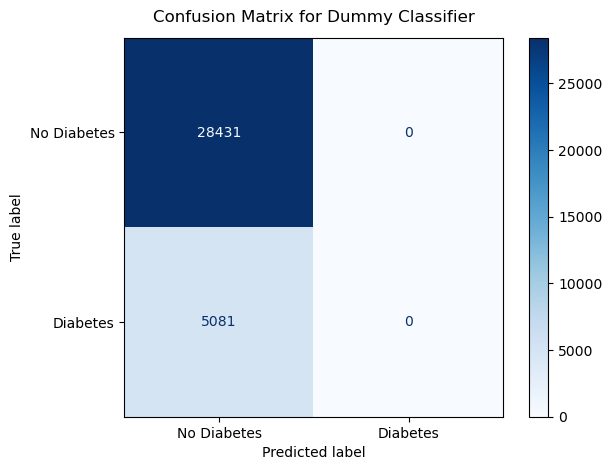

Model Name: Dummy Classifier

The ROC Accuracy Score : ROC-AUC is 0.50



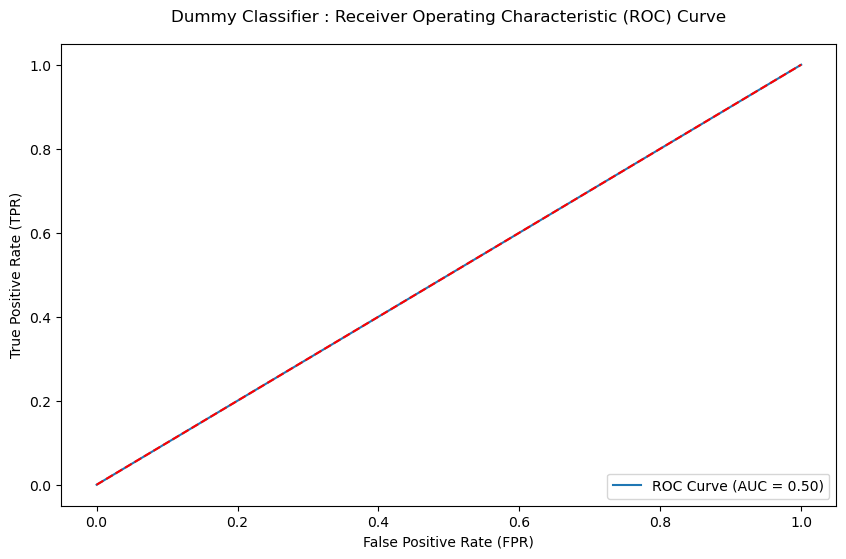



Results for Logistic Regression

Training Time     : 0.2805 seconds

Training Accuracy : 0.85

Test     Accuracy : 0.85

Performance Report for Logistic Regression

Precision is: 0.51
Recall    is: 0.12
F1 Score  is: 0.20
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92     28431
           1       0.51      0.12      0.20      5081

    accuracy                           0.85     33512
   macro avg       0.69      0.55      0.56     33512
weighted avg       0.81      0.85      0.81     33512

Results for Logistic Regression

Confusion Matrix:

[[27822   609]
 [ 4446   635]]

True Negative  : 27822
False Positive :  609
False Negative : 4446
True Positive  :  635

Predicted      0     1    All
True                         
0          27822   609  28431
1           4446   635   5081
All        32268  1244  33512


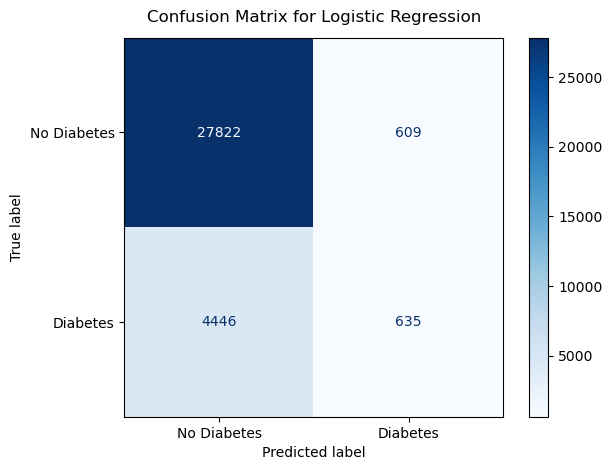

Model Name: Logistic Regression

The ROC Accuracy Score : ROC-AUC is 0.79



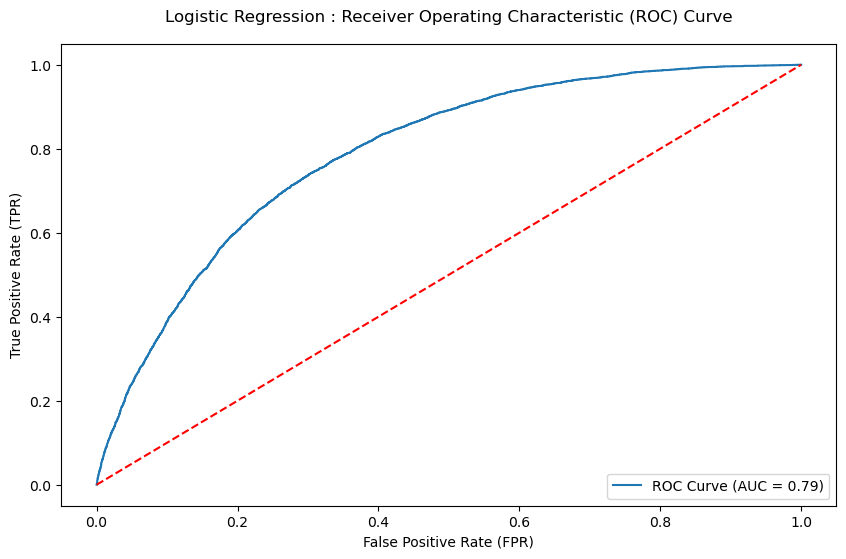



Results for Decision Tree Classifier

Training Time     : 0.1887 seconds

Training Accuracy : 0.99

Test     Accuracy : 0.78

Performance Report for Decision Tree Classifier

Precision is: 0.29
Recall    is: 0.32
F1 Score  is: 0.31
Accuracy  is: 0.78

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.86      0.87     28431
           1       0.29      0.32      0.31      5081

    accuracy                           0.78     33512
   macro avg       0.59      0.59      0.59     33512
weighted avg       0.79      0.78      0.78     33512

Results for Decision Tree Classifier

Confusion Matrix:

[[24532  3899]
 [ 3459  1622]]

True Negative  : 24532
False Positive : 3899
False Negative : 3459
True Positive  : 1622

Predicted      0     1    All
True                         
0          24532  3899  28431
1           3459  1622   5081
All        27991  5521  33512


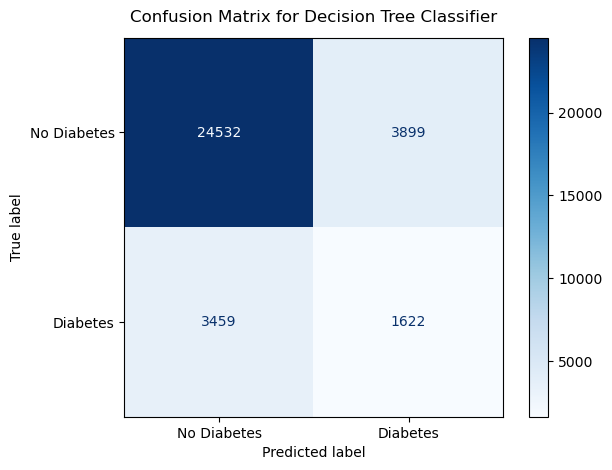

Model Name: Decision Tree Classifier

The ROC Accuracy Score : ROC-AUC is 0.59



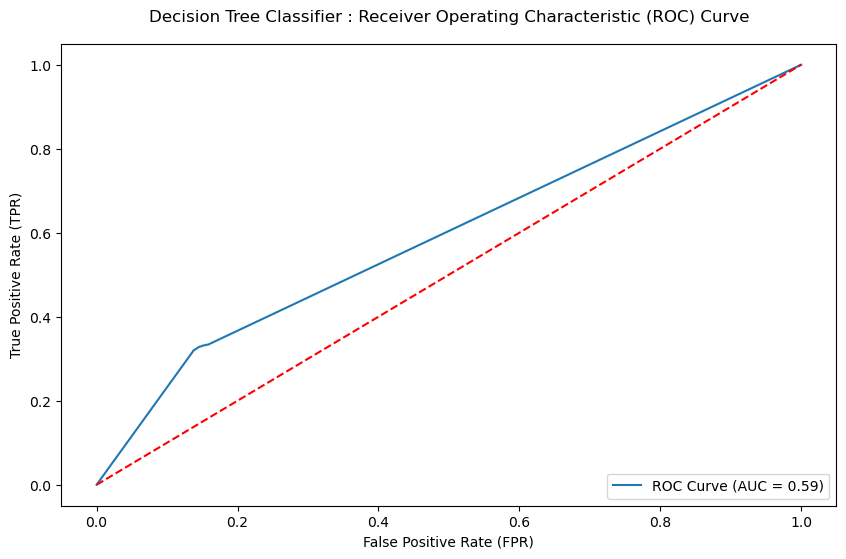



Results for K Nearest Neighbor Classifier

Training Time     : 0.0036 seconds

Training Accuracy : 0.87

Test     Accuracy : 0.83

Performance Report for K Nearest Neighbor Classifier

Precision is: 0.40
Recall    is: 0.21
F1 Score  is: 0.27
Accuracy  is: 0.83

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.94      0.91     28431
           1       0.40      0.21      0.27      5081

    accuracy                           0.83     33512
   macro avg       0.64      0.58      0.59     33512
weighted avg       0.80      0.83      0.81     33512

Results for K Nearest Neighbor Classifier

Confusion Matrix:

[[26866  1565]
 [ 4024  1057]]

True Negative  : 26866
False Positive : 1565
False Negative : 4024
True Positive  : 1057

Predicted      0     1    All
True                         
0          26866  1565  28431
1           4024  1057   5081
All        30890  2622  33512


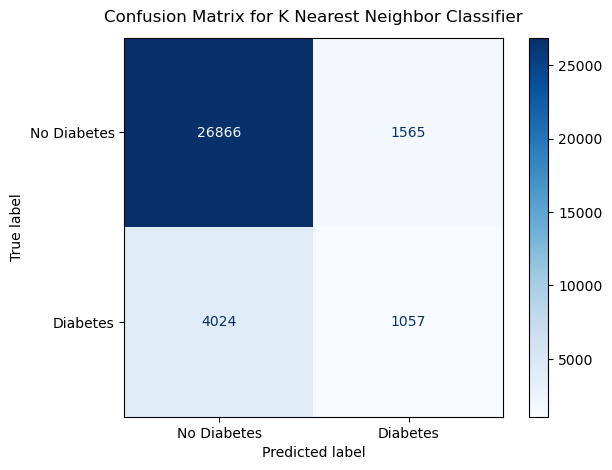

Model Name: K Nearest Neighbor Classifier

The ROC Accuracy Score : ROC-AUC is 0.69



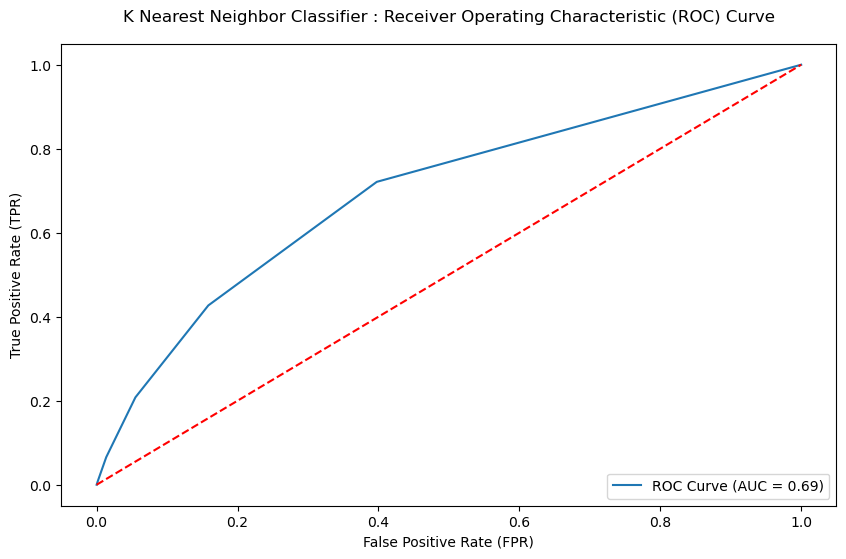

In [120]:
# Evaluate all the Model

final_results = {}

for model_name, model in model_dict.items():
    final_results[model_name] = evaluate_model(model, model_name, False)
    print('\n','='*120,'\n')

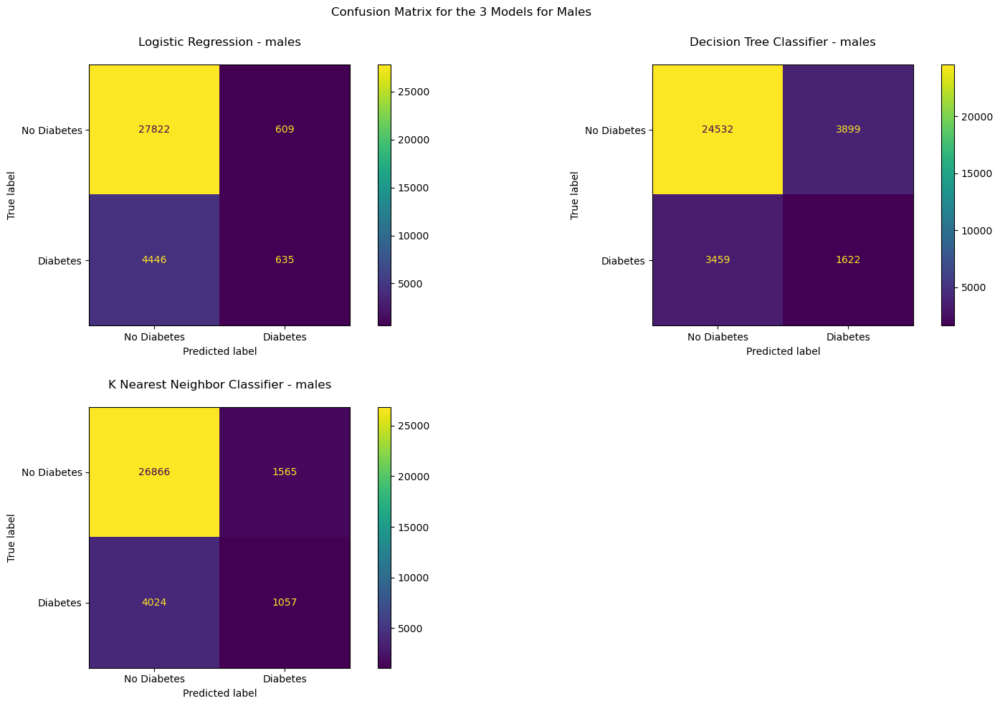

In [121]:
# Creating a 2x2 Grid of the Confusion Matrix for the 4 models

fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Confusion Matrix for the 3 Models for Males')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove confusion matrix from final results
        final_results[model_name] = results[:-1]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    conf_matrix = results[-1]
    
    #remove confusion matrix from final results
    final_results[model_name] = results[:-1]
    
    # Visualizing Confusion Matrix
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Diabetes', 'Diabetes'])

    # plot the Confusion Matrix Graph to the appropriate axes
    
    disp.plot(ax=axes[r,c])

    # set the title of each axes to the corresponding model name
    axes[r,c].set_title(f'\n{model_name} - males\n')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Confusion Matrix Comparison for 3 Models-Males.png')
plt.show()

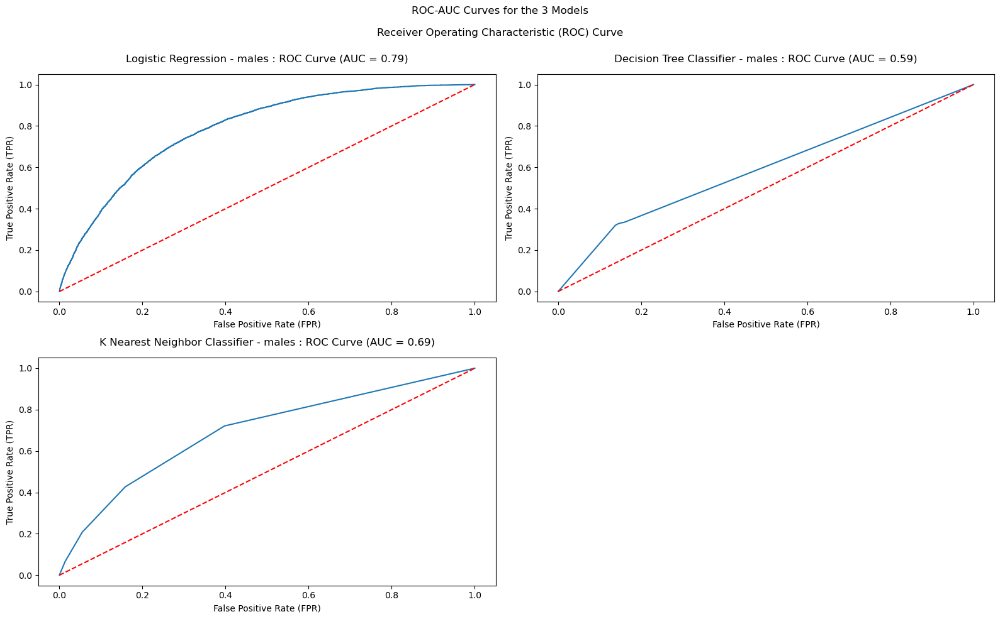

In [122]:
# Creating a 2x2 Grid of the ROC-AUC Curves for the 4 models
fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('ROC-AUC Curves for the 3 Models\n\nReceiver Operating Characteristic (ROC) Curve\n')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove fpr and tpr from final results
        final_results[model_name] = results[:-2]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    fpr, tpr = results[-2], results[-1]

    #remove fpr and tpr from final results
    final_results[model_name] = results[:-2]
    roc_auc_val = results[7]
    
    # plot the ROC AUC Curve to the appropriate axes
    label_val = 'ROC Curve (AUC = ' + roc_auc_val + ')'
    
    axes[r,c].plot(fpr, tpr, label=label_val)
    axes[r,c].plot([0, 1], [0, 1], 'k--',color='red')
    axes[r,c].set_xlabel('False Positive Rate (FPR)')
    axes[r,c].set_ylabel('True Positive Rate (TPR)')
    axes[r,c].set_title(f'{model_name} - males : {label_val}',y=1.03)
    
    # set the title of each axes to the corresponding model name
    #axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('ROC-AUC Curve Comparison for 3 Models-males.png')
plt.show()

In [123]:
final_df = pd.DataFrame(final_results).T
final_df.columns = ['Train Time', 'Train Accuracy', 'Test Accuracy', 'Precision Score', 
                    'Recall Score', 'Accuracy Score', 'F1 Score', 'ROC AUC', 
                   'True Negative', 'False Positive', 'False Negative', 'True Positive'] 
final_df

,Train Time,Train Accuracy,Test Accuracy,Precision Score,Recall Score,Accuracy Score,F1 Score,ROC AUC,True Negative,False Positive,False Negative,True Positive
Dummy Classifier,0.0025,0.85,0.85,0.00,0.00,0.85,0.00,0.50,28431,0,5081,0
Logistic Regression,0.2805,0.85,0.85,0.51,0.12,0.85,0.20,0.79,27822,609,4446,635
Decision Tree Classifier,0.1887,0.99,0.78,0.29,0.32,0.78,0.31,0.59,24532,3899,3459,1622
K Nearest Neighbor Classifier,0.0036,0.87,0.83,0.40,0.21,0.83,0.27,0.69,26866,1565,4024,1057


## Evaluate for Female Patients

In [124]:
# Let's split the data into training and test sets. We will use 70% of the data for training and 30% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.

X_train, X_test, y_train, y_test = train_test_split(Xf, yf, test_size = 0.3, random_state=42,stratify=yf)

Results for Dummy Classifier

Training Time     : 0.0021 seconds

Training Accuracy : 0.87

Test     Accuracy : 0.87

Performance Report for Dummy Classifier

Precision is: 0.00
Recall    is: 0.00
F1 Score  is: 0.00
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.87      1.00      0.93     37070
           1       0.00      0.00      0.00      5523

    accuracy                           0.87     42593
   macro avg       0.44      0.50      0.47     42593
weighted avg       0.76      0.87      0.81     42593

Results for Dummy Classifier

Confusion Matrix:

[[37070     0]
 [ 5523     0]]

True Negative  : 37070
False Positive :    0
False Negative : 5523
True Positive  :    0

Predicted      0    All
True                   
0          37070  37070
1           5523   5523
All        42593  42593


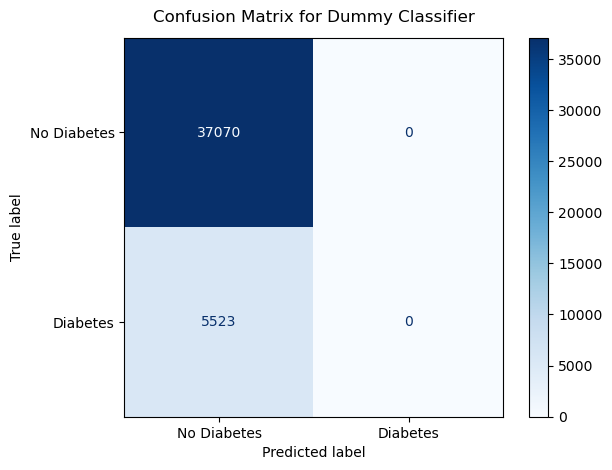

Model Name: Dummy Classifier

The ROC Accuracy Score : ROC-AUC is 0.50



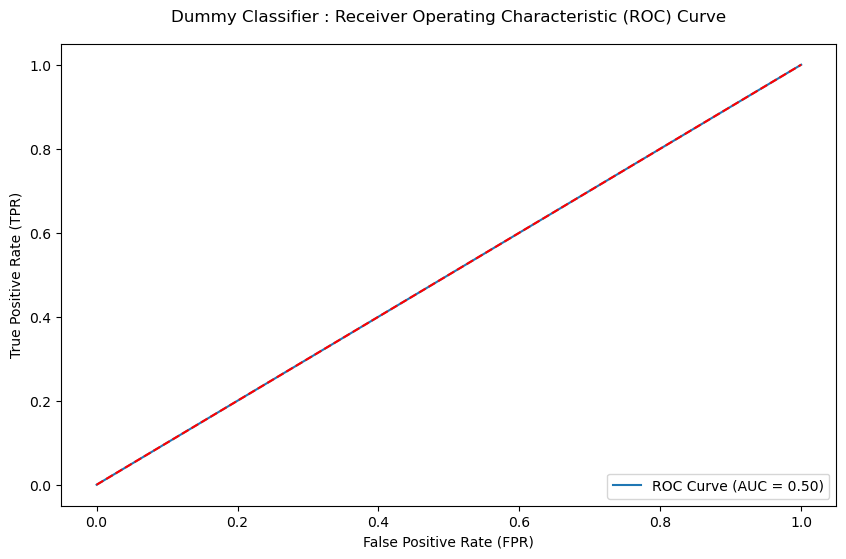



Results for Logistic Regression

Training Time     : 0.5928 seconds

Training Accuracy : 0.87

Test     Accuracy : 0.87

Performance Report for Logistic Regression

Precision is: 0.52
Recall    is: 0.15
F1 Score  is: 0.23
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93     37070
           1       0.52      0.15      0.23      5523

    accuracy                           0.87     42593
   macro avg       0.71      0.57      0.58     42593
weighted avg       0.84      0.87      0.84     42593

Results for Logistic Regression

Confusion Matrix:

[[36315   755]
 [ 4690   833]]

True Negative  : 36315
False Positive :  755
False Negative : 4690
True Positive  :  833

Predicted      0     1    All
True                         
0          36315   755  37070
1           4690   833   5523
All        41005  1588  42593


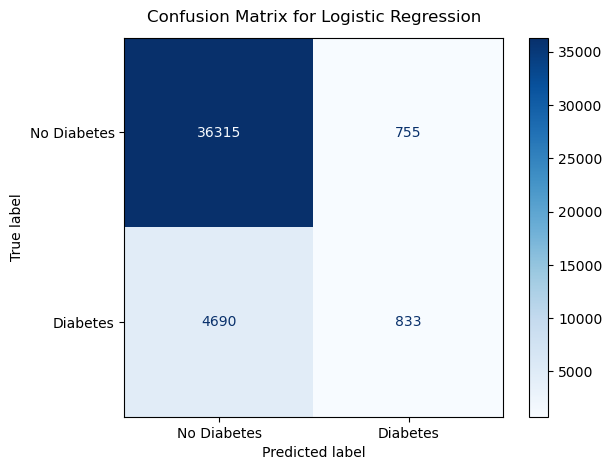

Model Name: Logistic Regression

The ROC Accuracy Score : ROC-AUC is 0.82



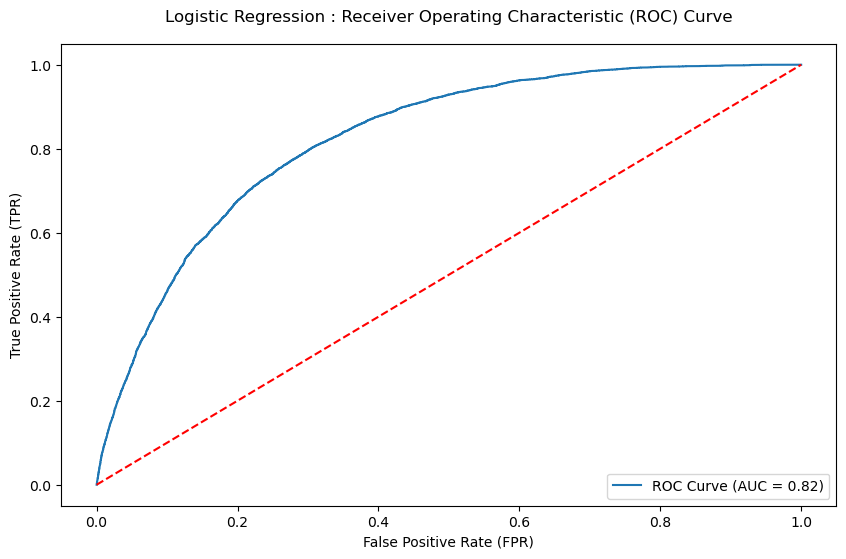



Results for Decision Tree Classifier

Training Time     : 0.2327 seconds

Training Accuracy : 1.00

Test     Accuracy : 0.81

Performance Report for Decision Tree Classifier

Precision is: 0.29
Recall    is: 0.33
F1 Score  is: 0.31
Accuracy  is: 0.81

Classification Report:
              precision    recall  f1-score   support

           0       0.90      0.88      0.89     37070
           1       0.29      0.33      0.31      5523

    accuracy                           0.81     42593
   macro avg       0.59      0.60      0.60     42593
weighted avg       0.82      0.81      0.81     42593

Results for Decision Tree Classifier

Confusion Matrix:

[[32657  4413]
 [ 3727  1796]]

True Negative  : 32657
False Positive : 4413
False Negative : 3727
True Positive  : 1796

Predicted      0     1    All
True                         
0          32657  4413  37070
1           3727  1796   5523
All        36384  6209  42593


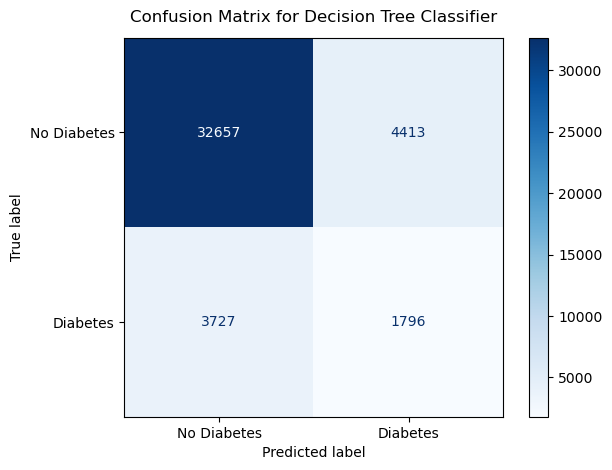

Model Name: Decision Tree Classifier

The ROC Accuracy Score : ROC-AUC is 0.60



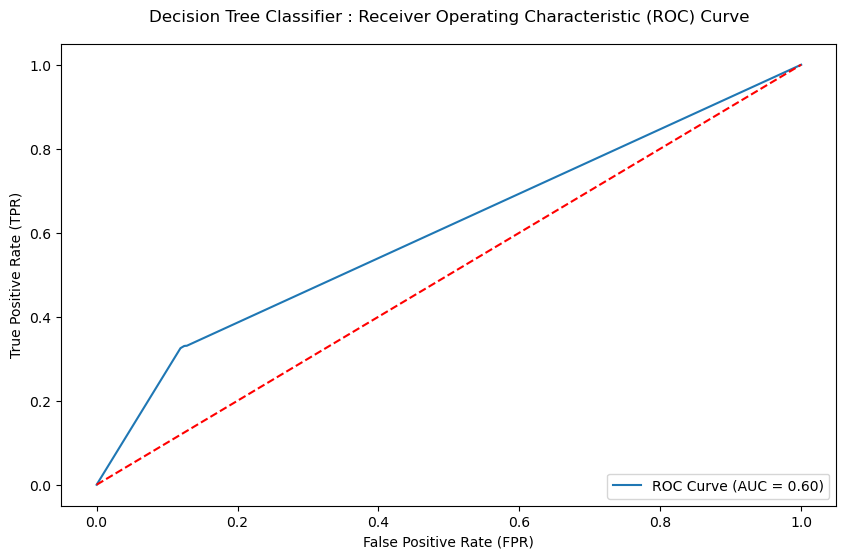



Results for K Nearest Neighbor Classifier

Training Time     : 0.0048 seconds

Training Accuracy : 0.89

Test     Accuracy : 0.86

Performance Report for K Nearest Neighbor Classifier

Precision is: 0.40
Recall    is: 0.18
F1 Score  is: 0.25
Accuracy  is: 0.86

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.96      0.92     37070
           1       0.40      0.18      0.25      5523

    accuracy                           0.86     42593
   macro avg       0.64      0.57      0.59     42593
weighted avg       0.82      0.86      0.83     42593

Results for K Nearest Neighbor Classifier

Confusion Matrix:

[[35550  1520]
 [ 4518  1005]]

True Negative  : 35550
False Positive : 1520
False Negative : 4518
True Positive  : 1005

Predicted      0     1    All
True                         
0          35550  1520  37070
1           4518  1005   5523
All        40068  2525  42593


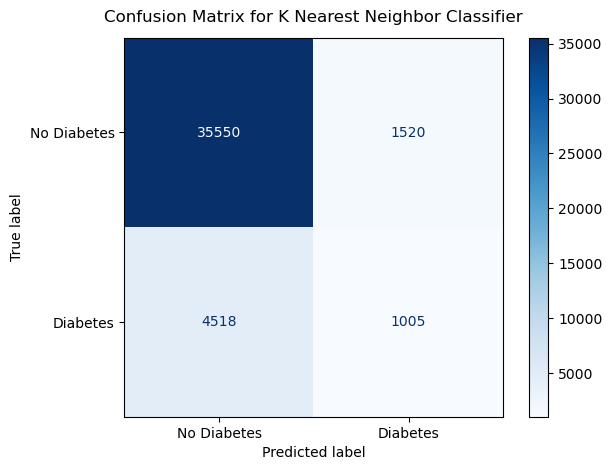

Model Name: K Nearest Neighbor Classifier

The ROC Accuracy Score : ROC-AUC is 0.72



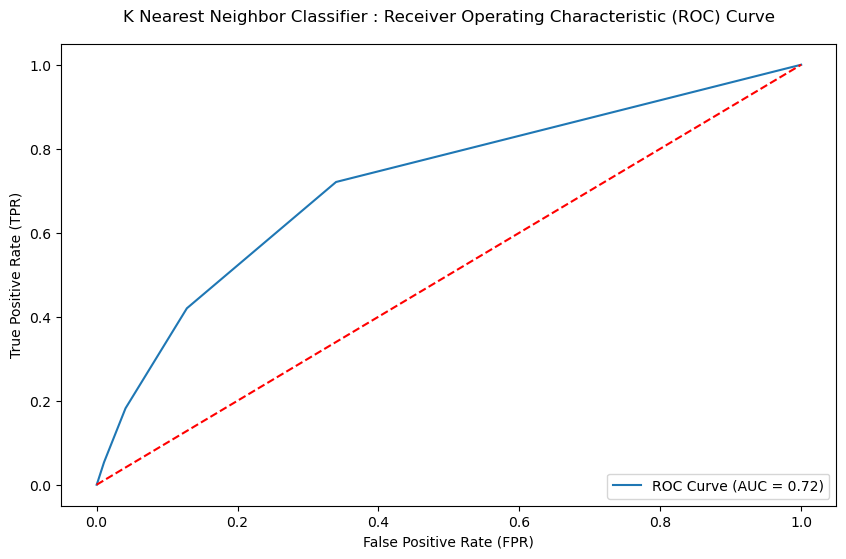

In [125]:
# Evaluate all the Model

final_results = {}

for model_name, model in model_dict.items():
    final_results[model_name] = evaluate_model(model, model_name, False)
    print('\n','='*120,'\n')

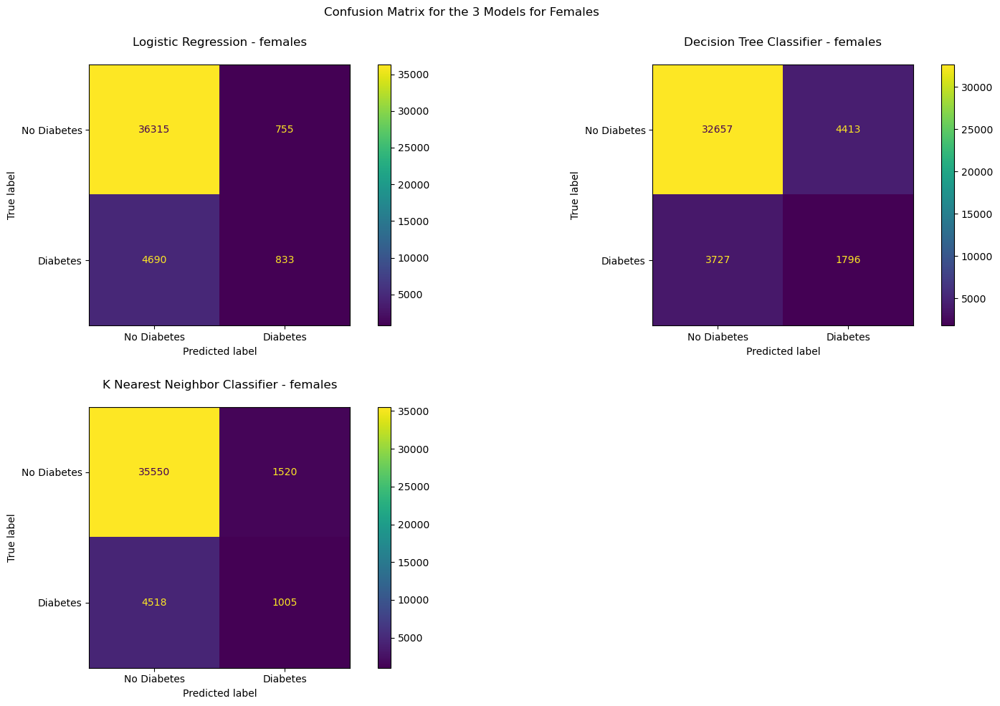

In [126]:
# Creating a 2x2 Grid of the Confusion Matrix for the 4 models

fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Confusion Matrix for the 3 Models for Females')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove confusion matrix from final results
        final_results[model_name] = results[:-1]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    conf_matrix = results[-1]

    #remove confusion matrix from final results
    final_results[model_name] = results[:-1]
    
    # Visualizing Confusion Matrix
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Diabetes', 'Diabetes'])

    # plot the Confusion Matrix Graph to the appropriate axes
    
    disp.plot(ax=axes[r,c])

    # set the title of each axes to the corresponding model name
    axes[r,c].set_title(f'\n{model_name} - females\n')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Confusion Matrix Comparison for 3 Models-females.png')
plt.show()

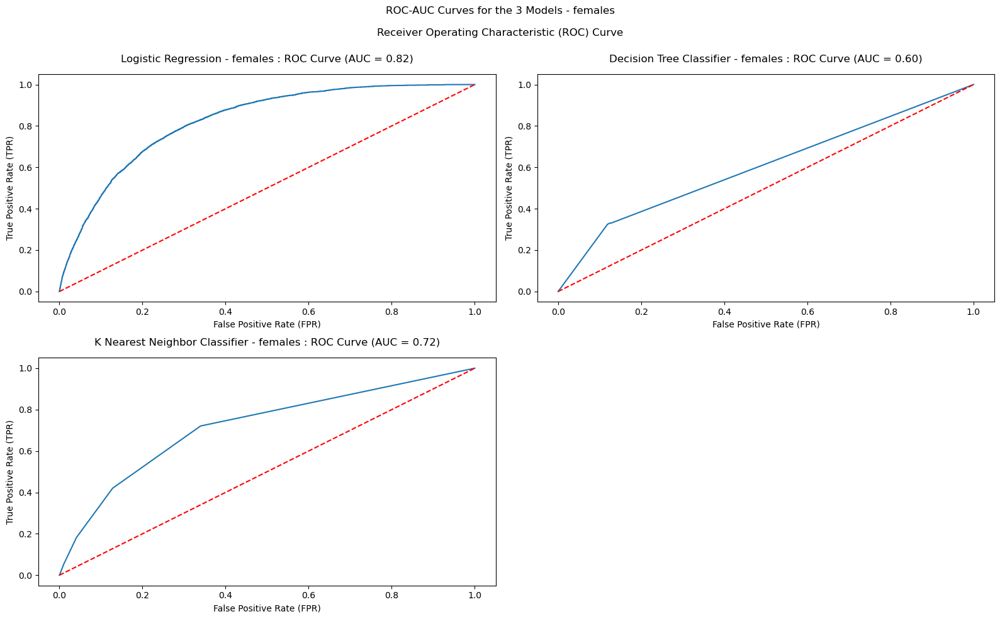

In [127]:
# Creating a 2x2 Grid of the ROC-AUC Curves for the 4 models
fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('ROC-AUC Curves for the 3 Models - females\n\nReceiver Operating Characteristic (ROC) Curve\n')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove fpr and tpr from final results
        final_results[model_name] = results[:-2]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    fpr, tpr = results[-2], results[-1]

    #remove fpr and tpr from final results
    final_results[model_name] = results[:-2]
    roc_auc_val = results[7]
    
    # plot the ROC AUC Curve to the appropriate axes
    label_val = 'ROC Curve (AUC = ' + roc_auc_val + ')'
    
    axes[r,c].plot(fpr, tpr, label=label_val)
    axes[r,c].plot([0, 1], [0, 1], 'k--',color='red')
    axes[r,c].set_xlabel('False Positive Rate (FPR)')
    axes[r,c].set_ylabel('True Positive Rate (TPR)')
    axes[r,c].set_title(f'{model_name} - females : {label_val}',y=1.03)
    
    # set the title of each axes to the corresponding model name
    #axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('ROC-AUC Curve Comparison for 3 Models-female.png')
plt.show()

In [128]:
final_df = pd.DataFrame(final_results).T
final_df.columns = ['Train Time', 'Train Accuracy', 'Test Accuracy', 'Precision Score', 
                    'Recall Score', 'Accuracy Score', 'F1 Score', 'ROC AUC', 
                   'True Negative', 'False Positive', 'False Negative', 'True Positive'] 
final_df

,Train Time,Train Accuracy,Test Accuracy,Precision Score,Recall Score,Accuracy Score,F1 Score,ROC AUC,True Negative,False Positive,False Negative,True Positive
Dummy Classifier,0.0021,0.87,0.87,0.00,0.00,0.87,0.00,0.50,37070,0,5523,0
Logistic Regression,0.5928,0.87,0.87,0.52,0.15,0.87,0.23,0.82,36315,755,4690,833
Decision Tree Classifier,0.2327,1.00,0.81,0.29,0.33,0.81,0.31,0.60,32657,4413,3727,1796
K Nearest Neighbor Classifier,0.0048,0.89,0.86,0.40,0.18,0.86,0.25,0.72,35550,1520,4518,1005


In [129]:
# We will also introduce some hyperparameters to see if the models can do better

param_grids = {
    'Logistic Regression': {
        'classifier__C': [0.01, 0.1, 1, 10, 100],
        'classifier__penalty': ['l2'],
        'classifier__solver': ['lbfgs', 'saga']
    },
    
    'Decision Tree Classifier': {
        'classifier__criterion': ['gini', 'entropy'],
        'classifier__max_depth': [None, 10, 20, 30, 40, 50],
        'classifier__min_samples_split': [2, 5, 10]
    },
    
    'K Nearest Neighbor Classifier': {
        'classifier__n_neighbors': [3, 5, 7, 9, 11],
        'classifier__weights': ['uniform', 'distance'],
        'classifier__algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute']
    }
}

## Evaluate for Males with Hyperparameters using GridSearchCV

In [130]:
# Let's split the data into training and test sets. We will use 70% of the data for training and 30% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.

X_train, X_test, y_train, y_test = train_test_split(Xm, ym, test_size = 0.3, random_state=42,stratify=ym)

/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was e

Results for Logistic Regression

Training Time     : 2.3364 seconds

Training Accuracy : 0.85

Test     Accuracy : 0.85

The Permutation Importance for all the Patient attributes are:

Attribute            Mean        Standard Deviation
BMI                     0.006      +/- 0.001
GenHlth                 0.005      +/- 0.001
Age                     0.002      +/- 0.001
HighBP                  0.002      +/- 0.000
DiffWalk                0.001      +/- 0.000
HighChol                0.001      +/- 0.000
Performance Report for Logistic Regression

Precision is: 0.52
Recall    is: 0.15
F1 Score  is: 0.23
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92     28431
           1       0.52      0.15      0.23      5081

    accuracy                           0.85     33512
   macro avg       0.69      0.56      0.57     33512
weighted avg       0.81      0.85      0.81     33512

Results for Logistic R

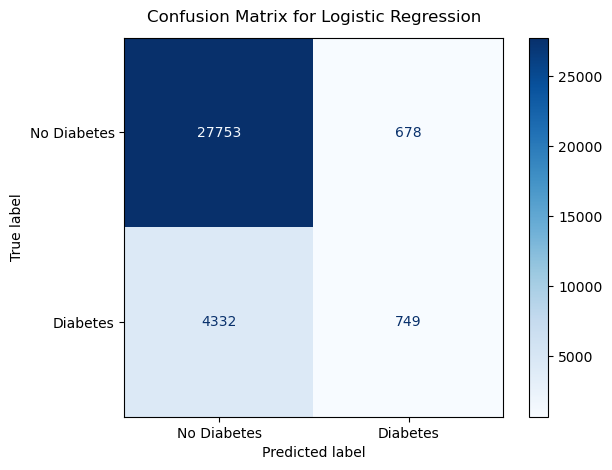

Model Name: Logistic Regression

The ROC Accuracy Score : ROC-AUC is 0.80



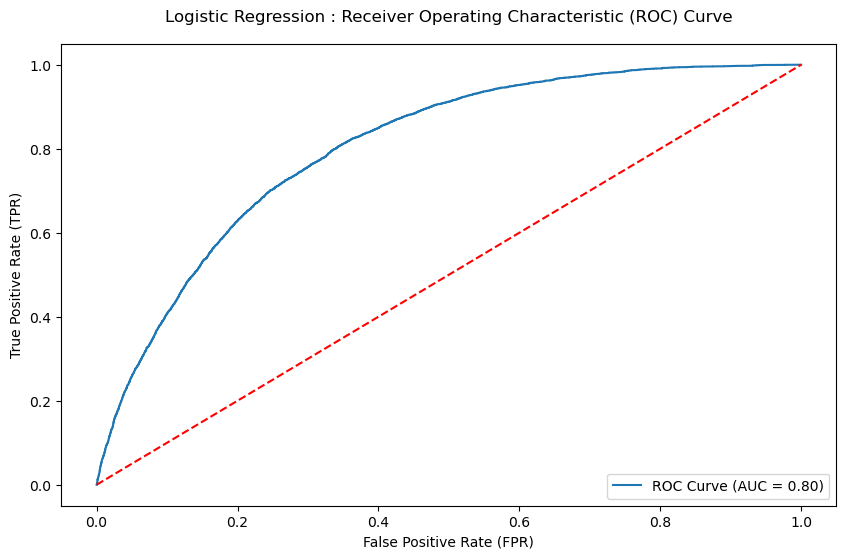

In [131]:
final_results = {}

# Evaluate Logistic Regression Model

model = LogisticRegression()
model_name = 'Logistic Regression'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, True)
print('\n','='*120,'\n')

Results for Decision Tree Classifier

Training Time     : 3.7887 seconds

Training Accuracy : 0.86

Test     Accuracy : 0.85

Performance Report for Decision Tree Classifier

Precision is: 0.49
Recall    is: 0.16
F1 Score  is: 0.24
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.97      0.92     28431
           1       0.49      0.16      0.24      5081

    accuracy                           0.85     33512
   macro avg       0.68      0.56      0.58     33512
weighted avg       0.81      0.85      0.81     33512

Results for Decision Tree Classifier

Confusion Matrix:

[[27605   826]
 [ 4278   803]]

True Negative  : 27605
False Positive :  826
False Negative : 4278
True Positive  :  803

Predicted      0     1    All
True                         
0          27605   826  28431
1           4278   803   5081
All        31883  1629  33512


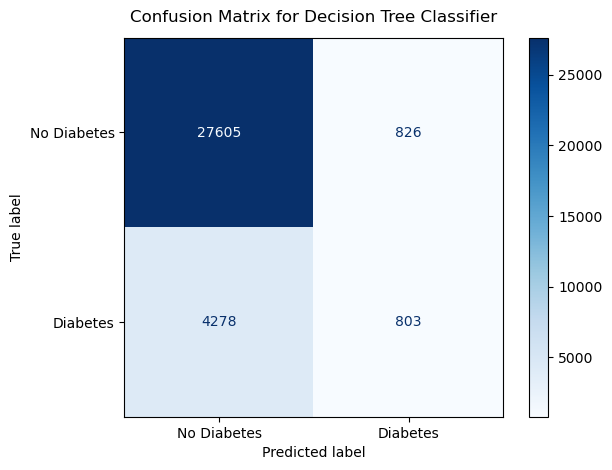

Model Name: Decision Tree Classifier

The ROC Accuracy Score : ROC-AUC is 0.78



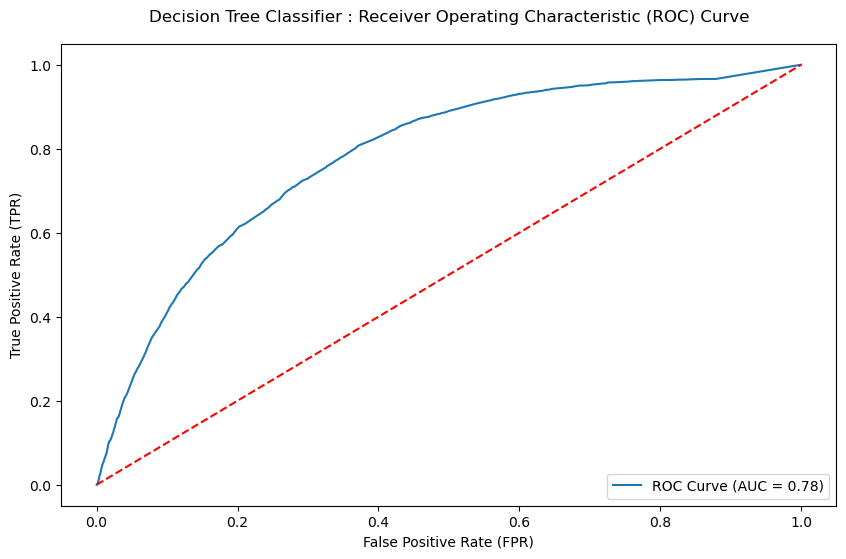

In [132]:
# Evaluate Decision Tree Classifier Model

model = DecisionTreeClassifier()
model_name = 'Decision Tree Classifier'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, False)
print('\n','='*120,'\n')

/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array 

Results for K Nearest Neighbor Classifier

Training Time     : 355.5008 seconds

Training Accuracy : 0.86

Test     Accuracy : 0.84

The Permutation Importance for all the Patient attributes are:

Attribute            Mean        Standard Deviation
BMI                     0.002      +/- 0.001
GenHlth                 0.002      +/- 0.001
DiffWalk                0.002      +/- 0.001
HvyAlcoholConsump       0.001      +/- 0.000
HeartDiseaseorAttack    0.001      +/- 0.001
Age                     0.000      +/- 0.001
Fruits                  0.000      +/- 0.001
PhysActivity            0.000      +/- 0.001
Smoker                  -0.000      +/- 0.001
HighChol                -0.001      +/- 0.001
Income                  -0.001      +/- 0.001
HighBP                  -0.002      +/- 0.001
Education               -0.002      +/- 0.001
Performance Report for K Nearest Neighbor Classifier

Precision is: 0.45
Recall    is: 0.16
F1 Score  is: 0.23
Accuracy  is: 0.84

Classification Report:
       

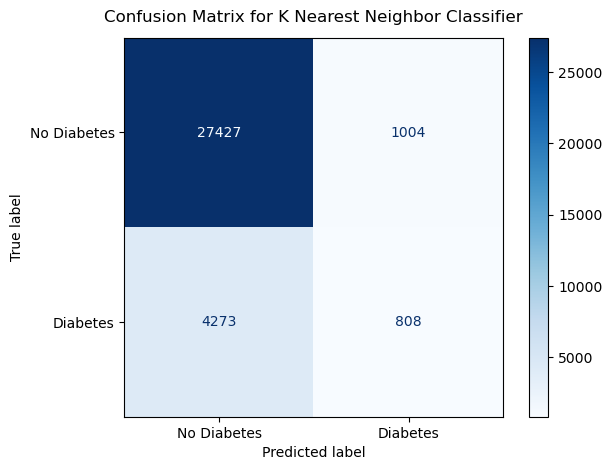

Model Name: K Nearest Neighbor Classifier

The ROC Accuracy Score : ROC-AUC is 0.75



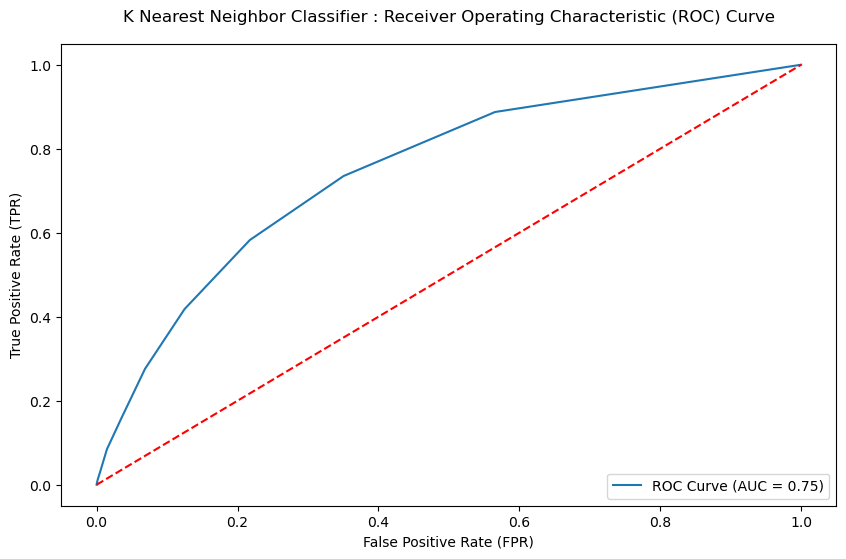

In [133]:
# Evaluate K Neighbors Classifier Model

model = KNeighborsClassifier()
model_name = 'K Nearest Neighbor Classifier'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, True)
print('\n','='*120,'\n')

In [134]:
# Evaluate Logistic Regression Model

#final_results = {}

#for model_name, model in model_dict.items():
#    if model_name == 'Dummy Classifier': continue
#    pipeline = Pipeline([
#            ('scaler', StandardScaler()),
#            ('classifier', model)
#    ])
#    grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
#    final_results[model_name] = evaluate_model(grid_search, model_name, True)
#    print('\n','='*120,'\n')

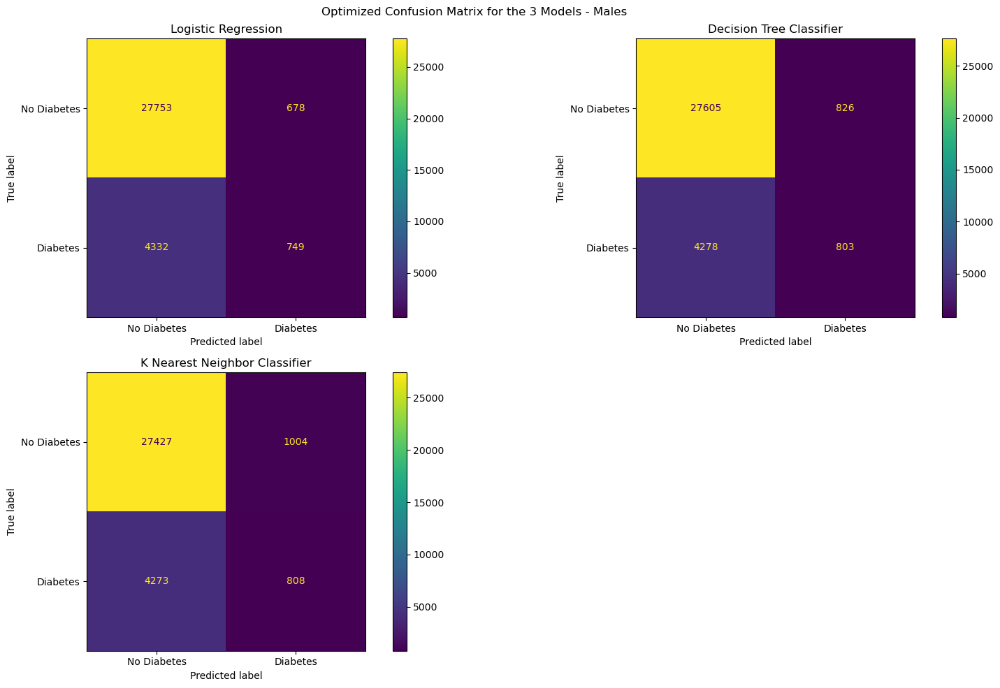

In [135]:
# Creating a 2x2 Grid of the Confusion Matrix for the 4 models

fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Optimized Confusion Matrix for the 3 Models - Males')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove confusion matrix from final results
        final_results[model_name] = results[:-1]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    conf_matrix = results[-1]

    #remove confusion matrix from final results
    final_results[model_name] = results[:-1]
    
    # Visualizing Confusion Matrix
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Diabetes', 'Diabetes'])

    # plot the Confusion Matrix Graph to the appropriate axes
    
    disp.plot(ax=axes[r,c])

    # set the title of each axes to the corresponding model name
    axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Optimized Confusion Matrix Comparison for 3 Models - Males.png')
plt.show()

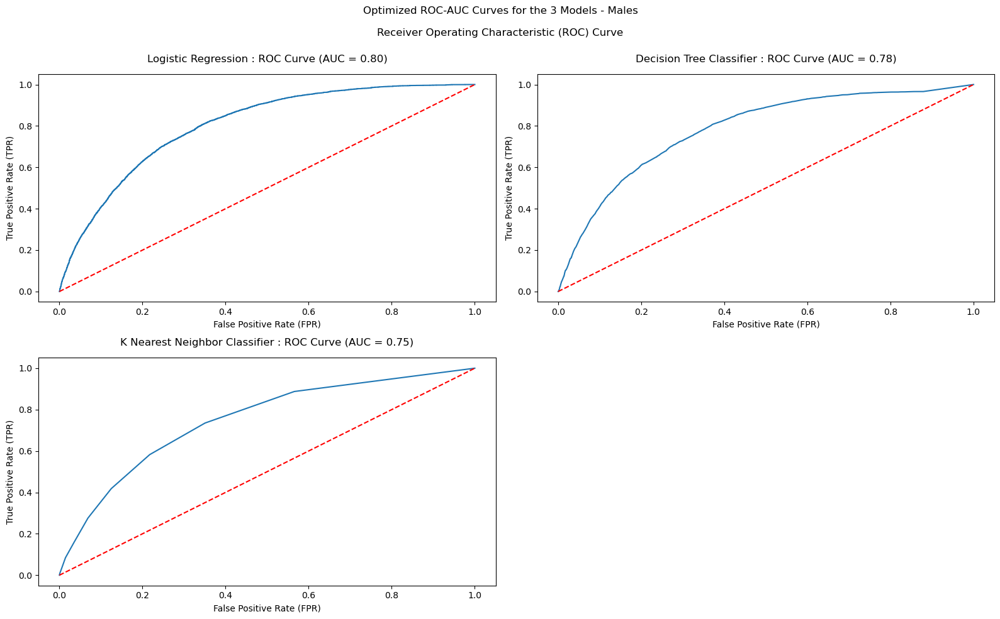

In [136]:
# Creating a 2x2 Grid of the ROC-AUC Curves for the 4 models
fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Optimized ROC-AUC Curves for the 3 Models - Males\n\nReceiver Operating Characteristic (ROC) Curve\n')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove fpr and tpr from final results
        final_results[model_name] = results[:-2]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    fpr, tpr = results[-2], results[-1]

    #remove fpr and tpr from final results
    final_results[model_name] = results[:-2]
    roc_auc_val = results[7]
    
    # plot the ROC AUC Curve to the appropriate axes
    label_val = 'ROC Curve (AUC = ' + roc_auc_val + ')'
    
    axes[r,c].plot(fpr, tpr, label=label_val)
    axes[r,c].plot([0, 1], [0, 1], 'k--',color='red')
    axes[r,c].set_xlabel('False Positive Rate (FPR)')
    axes[r,c].set_ylabel('True Positive Rate (TPR)')
    axes[r,c].set_title(f'{model_name} : {label_val}',y=1.03)
    
    # set the title of each axes to the corresponding model name
    #axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Optimized ROC-AUC Curve Comparison for 3 Models - Males.png')
plt.show()

In [137]:
final_df = pd.DataFrame(final_results).T
final_df.columns = ['Train Time', 'Train Accuracy', 'Test Accuracy', 'Precision Score', 
                    'Recall Score', 'Accuracy Score', 'F1 Score', 'ROC AUC', 
                   'True Negative', 'False Positive', 'False Negative', 'True Positive'] 
final_df

,Train Time,Train Accuracy,Test Accuracy,Precision Score,Recall Score,Accuracy Score,F1 Score,ROC AUC,True Negative,False Positive,False Negative,True Positive
Logistic Regression,2.3364,0.85,0.85,0.52,0.15,0.85,0.23,0.80,27753,678,4332,749
Decision Tree Classifier,3.7887,0.86,0.85,0.49,0.16,0.85,0.24,0.78,27605,826,4278,803
K Nearest Neighbor Classifier,355.5008,0.86,0.84,0.45,0.16,0.84,0.23,0.75,27427,1004,4273,808


## Evaluate for Females with Hyperparameters using GridSearchCV

In [138]:
# Let's split the data into training and test sets. We will use 80% of the data for training and 20% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.
warnings.filterwarnings("ignore")

X_train, X_test, y_train, y_test = train_test_split(Xf, yf, test_size = 0.3, random_state=42,stratify=yf)

/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/utils/validation.py:1339: DataConversionWarning: A column-vector y was passed when a 1d array was e

Results for Logistic Regression

Training Time     : 2.4094 seconds

Training Accuracy : 0.87

Test     Accuracy : 0.87

The Permutation Importance for all the Patient attributes are:

Attribute            Mean        Standard Deviation
BMI                     0.007      +/- 0.001
GenHlth                 0.006      +/- 0.000
HighChol                0.002      +/- 0.000
HighBP                  0.002      +/- 0.000
Performance Report for Logistic Regression

Precision is: 0.54
Recall    is: 0.16
F1 Score  is: 0.25
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93     37070
           1       0.54      0.16      0.25      5523

    accuracy                           0.87     42593
   macro avg       0.72      0.57      0.59     42593
weighted avg       0.84      0.87      0.84     42593

Results for Logistic Regression

Confusion Matrix:

[[36333   737]
 [ 4644   879]]

True Negative  : 36333
False

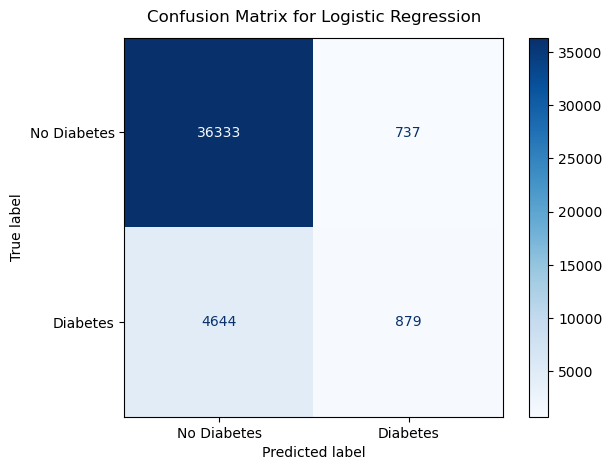

Model Name: Logistic Regression

The ROC Accuracy Score : ROC-AUC is 0.83



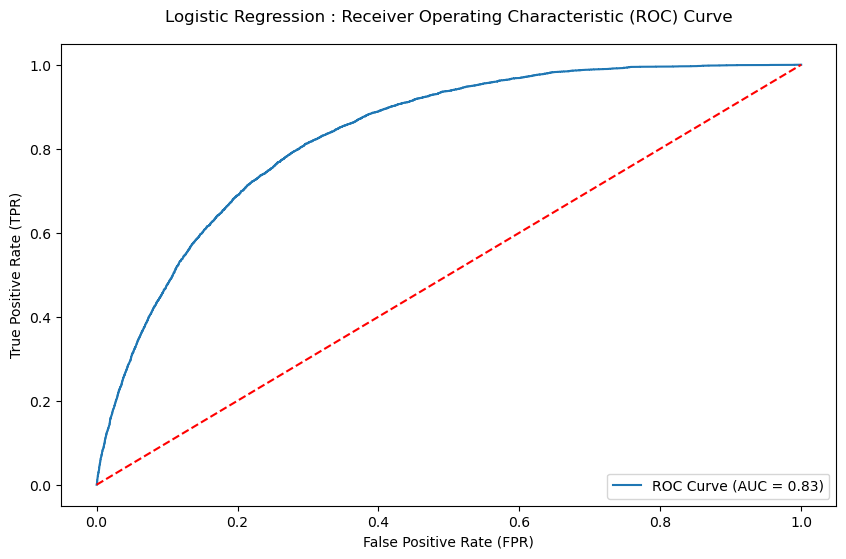

In [139]:
final_results = {}

# Evaluate Logistic Regression Model

model = LogisticRegression()
model_name = 'Logistic Regression'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, True)
print('\n','='*120,'\n')

Results for Decision Tree Classifier

Training Time     : 4.7810 seconds

Training Accuracy : 0.88

Test     Accuracy : 0.87

The Permutation Importance for all the Patient attributes are:

Attribute            Mean        Standard Deviation
BMI                     0.010      +/- 0.001
GenHlth                 0.006      +/- 0.001
HighChol                0.005      +/- 0.001
HighBP                  0.004      +/- 0.000
Age                     0.001      +/- 0.000
PhysHlth                0.001      +/- 0.000
HeartDiseaseorAttack    0.001      +/- 0.000
Performance Report for Decision Tree Classifier

Precision is: 0.53
Recall    is: 0.19
F1 Score  is: 0.28
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     37070
           1       0.53      0.19      0.28      5523

    accuracy                           0.87     42593
   macro avg       0.71      0.58      0.61     42593
weighted avg       0.8

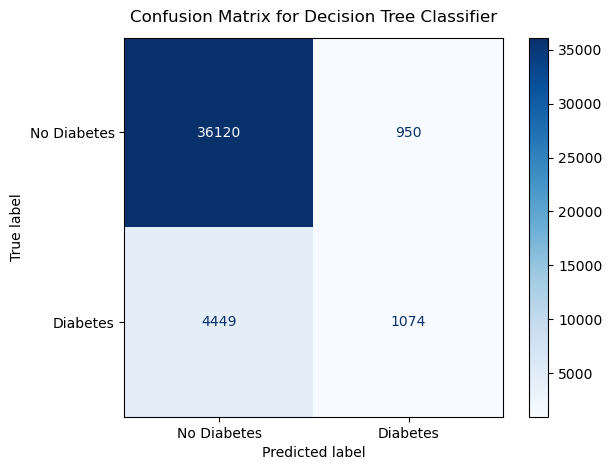

Model Name: Decision Tree Classifier

The ROC Accuracy Score : ROC-AUC is 0.81



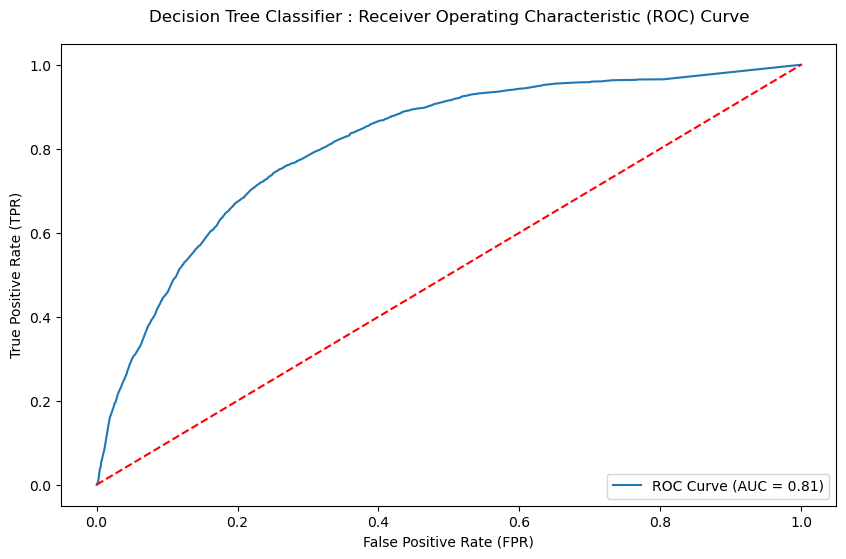

In [140]:
# Evaluate Decision Tree Classifier Model

model = DecisionTreeClassifier()
model_name = 'Decision Tree Classifier'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, True)
print('\n','='*120,'\n')

/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)
/Users/ferndzjoe/anaconda3/lib/python3.10/site-packages/sklearn/neighbors/_classification.py:238: DataConversionWarning: A column-vector y was passed when a 1d array 

Results for K Nearest Neighbor Classifier

Training Time     : 589.4481 seconds

Training Accuracy : 0.88

Test     Accuracy : 0.87

The Permutation Importance for all the Patient attributes are:

Attribute            Mean        Standard Deviation
BMI                     0.003      +/- 0.001
HighChol                0.002      +/- 0.000
GenHlth                 0.002      +/- 0.001
Fruits                  0.000      +/- 0.001
Smoker                  -0.000      +/- 0.001
Income                  -0.000      +/- 0.001
Education               -0.001      +/- 0.001
Performance Report for K Nearest Neighbor Classifier

Precision is: 0.46
Recall    is: 0.15
F1 Score  is: 0.23
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.97      0.93     37070
           1       0.46      0.15      0.23      5523

    accuracy                           0.87     42593
   macro avg       0.67      0.56      0.58     42593
weighte

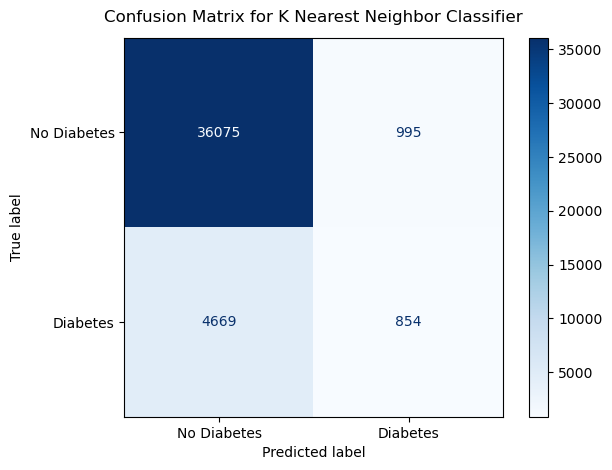

Model Name: K Nearest Neighbor Classifier

The ROC Accuracy Score : ROC-AUC is 0.78



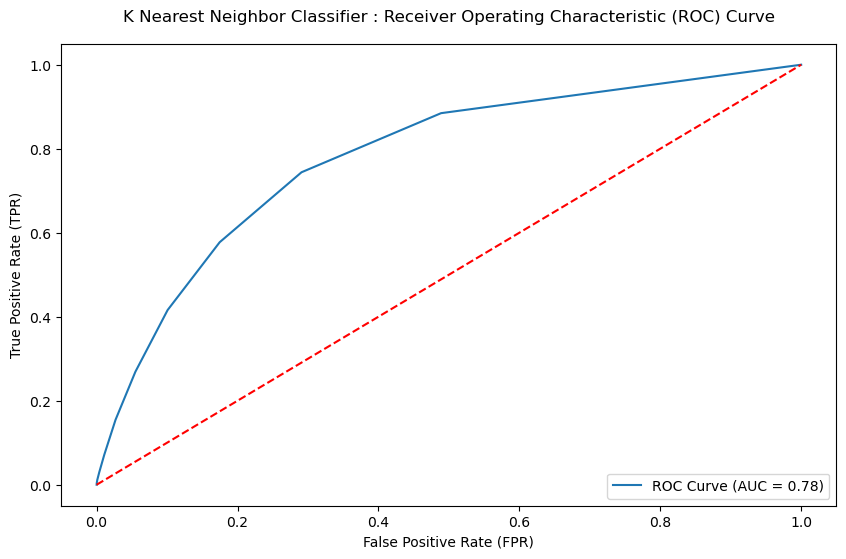

In [141]:
# Evaluate K Neighbors Classifier Model

model = KNeighborsClassifier()
model_name = 'K Nearest Neighbor Classifier'

pipeline = Pipeline([
            ('scaler', StandardScaler()),
            ('classifier', model)
    ])
grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
final_results[model_name] = evaluate_model(grid_search, model_name, True)
print('\n','='*120,'\n')

In [142]:
# Evaluate Logistic Regression Model

#final_results = {}

#for model_name, model in model_dict.items():
#    if model_name == 'Dummy Classifier': continue
#    pipeline = Pipeline([
#            ('scaler', StandardScaler()),
#            ('classifier', model)
#    ])
#    grid_search = GridSearchCV(pipeline, param_grids[model_name], cv=5, scoring='accuracy', n_jobs=-1, verbose=False)
#    final_results[model_name] = evaluate_model(grid_search, model_name, True)
#    print('\n','='*120,'\n')

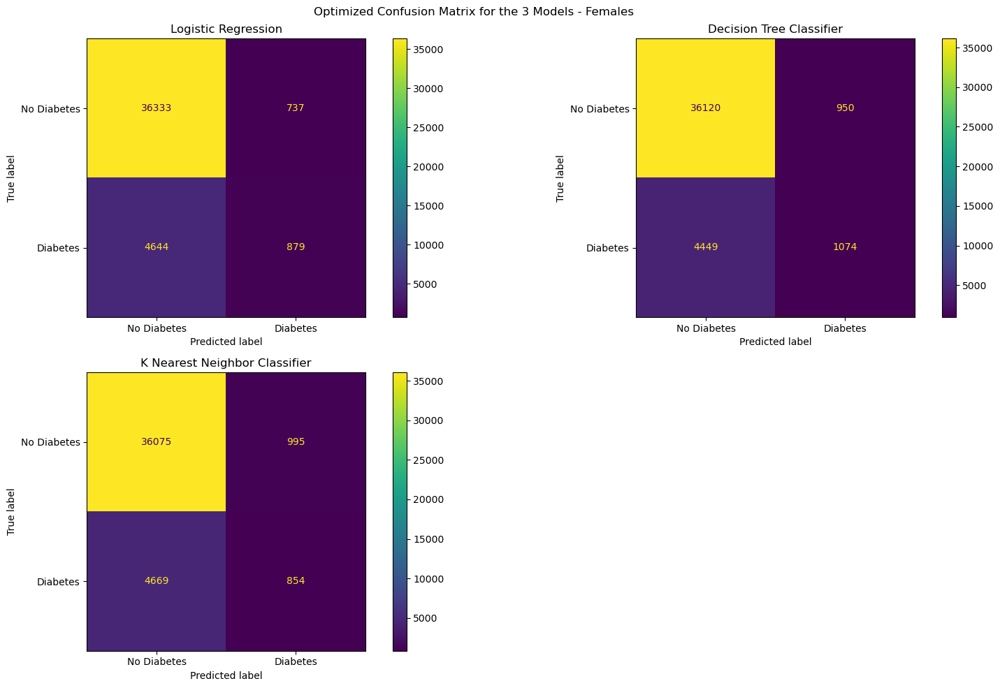

In [143]:
# Creating a 2x2 Grid of the Confusion Matrix for the 4 models

fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Optimized Confusion Matrix for the 3 Models - Females')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove confusion matrix from final results
        final_results[model_name] = results[:-1]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    conf_matrix = results[-1]

    #remove confusion matrix from final results
    final_results[model_name] = results[:-1]
    
    # Visualizing Confusion Matrix
    disp = ConfusionMatrixDisplay(conf_matrix, display_labels=['No Diabetes', 'Diabetes'])

    # plot the Confusion Matrix Graph to the appropriate axes
    
    disp.plot(ax=axes[r,c])

    # set the title of each axes to the corresponding model name
    axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Optimized Confusion Matrix Comparison for 3 Models - Females.png')
plt.show()

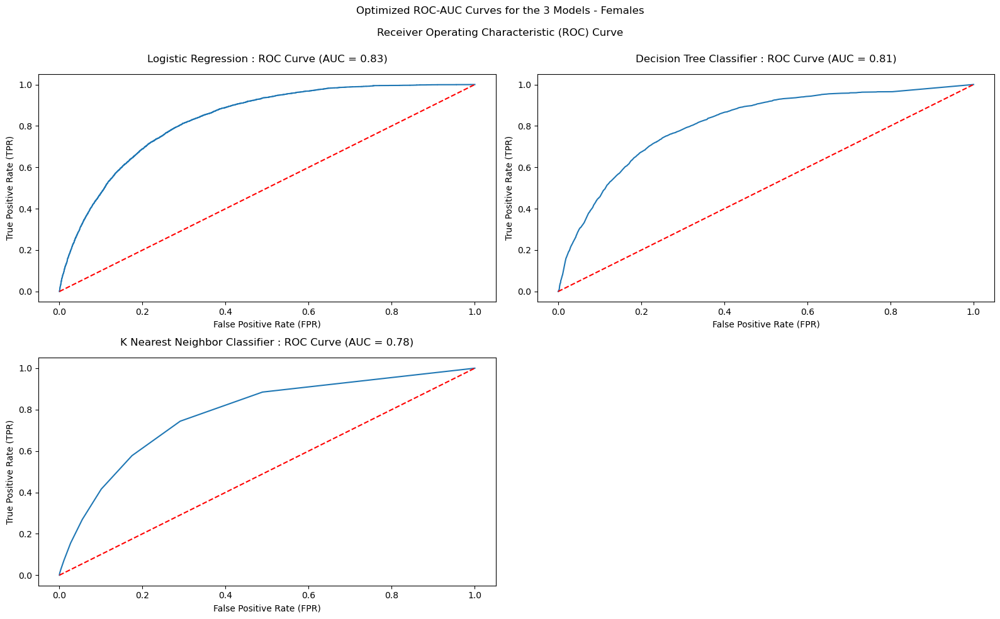

In [144]:
# Creating a 2x2 Grid of the ROC-AUC Curves for the 4 models
fig, axes = plt.subplots(2, 2, figsize=(16, 10))    # Create a 2x2 grid of subplots
fig.suptitle('Optimized ROC-AUC Curves for the 3 Models - Females\n\nReceiver Operating Characteristic (ROC) Curve\n')  # Add a title for the entire figure

# Counter to keep track of subplot position
plot_count = 0

for model_name, results in final_results.items():
    if model_name == 'Dummy Classifier': 
        #remove fpr and tpr from final results
        final_results[model_name] = results[:-2]
        continue
    r,c = int(plot_count/2),int(plot_count%2)

    # Get the Confusion Matrix from the result set. The last value in the list is the Confusion Matrix for each Model
    
    fpr, tpr = results[-2], results[-1]

    #remove fpr and tpr from final results
    final_results[model_name] = results[:-2]
    roc_auc_val = results[7]
    
    # plot the ROC AUC Curve to the appropriate axes
    label_val = 'ROC Curve (AUC = ' + roc_auc_val + ')'
    
    axes[r,c].plot(fpr, tpr, label=label_val)
    axes[r,c].plot([0, 1], [0, 1], 'k--',color='red')
    axes[r,c].set_xlabel('False Positive Rate (FPR)')
    axes[r,c].set_ylabel('True Positive Rate (TPR)')
    axes[r,c].set_title(f'{model_name} : {label_val}',y=1.03)
    
    # set the title of each axes to the corresponding model name
    #axes[r,c].set_title(f'{model_name}')

    plot_count += 1

axes[1, 1].set_visible(False)

plt.tight_layout()
plt.savefig('Optimized ROC-AUC Curve Comparison for 3 Models - Females.png')
plt.show()

In [145]:
final_df = pd.DataFrame(final_results).T
final_df.columns = ['Train Time', 'Train Accuracy', 'Test Accuracy', 'Precision Score', 
                    'Recall Score', 'Accuracy Score', 'F1 Score', 'ROC AUC', 
                   'True Negative', 'False Positive', 'False Negative', 'True Positive'] 
final_df

,Train Time,Train Accuracy,Test Accuracy,Precision Score,Recall Score,Accuracy Score,F1 Score,ROC AUC,True Negative,False Positive,False Negative,True Positive
Logistic Regression,2.4094,0.87,0.87,0.54,0.16,0.87,0.25,0.83,36333,737,4644,879
Decision Tree Classifier,4.7810,0.88,0.87,0.53,0.19,0.87,0.28,0.81,36120,950,4449,1074
K Nearest Neighbor Classifier,589.4481,0.88,0.87,0.46,0.15,0.87,0.23,0.78,36075,995,4669,854


### **Observations:**  
Adding hyperparameters, I was able to see a much better result for all 3 models. The test accuracy ratio improved from **0.81** to **0.87** with the ROC-AOC score pushing from **0.7x** to **0.8x**. However, as we can see, the hyperparameters comes with a cost. The time to process this takes longer with kNN Classifier taking more than **13 minutes** to process compared to earlier process less than **1 seconds**.

### **Recommendation**  
Use Logistic Regression with hyperparameters as the precision is higher, recall is higher, and ROC AUC score is also higher. The overall time it takes to process Logistic Regression is much lower than all others making it the best option among the 3 models

### Ensemble Techniques

Looking at the Permuatation Importance, it shows the following attributes have high importance. 

```
HighBP
HighChol
BMI
Smoker
HeartDiseaseorAttack
Fruits
GenHlth
PhysHlth
Age
Education
Income
```

Let's use these attributes to select a subset of the dataset and run the following ensemble models:
- AdaBoostClassifier
- Random Forest Classifier
- VotingClassifier
- XGBoost

In [146]:
Xm.columns

Index(['HighBP', 'HighChol', 'CholCheck', 'BMI', 'Smoker', 'Stroke',
       'HeartDiseaseorAttack', 'PhysActivity', 'Fruits', 'Veggies',
       'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'GenHlth',
       'MentHlth', 'PhysHlth', 'DiffWalk', 'Age', 'Education', 'Income'],
      dtype='object')

In [147]:
#Xm.columns = ['HighBP', 'HighChol', 'BMI', 'Smoker', 'HeartDiseaseorAttack', 'Fruits',
#        'GenHlth', 'PhysHlth', 'Age', 'Education', 'Income']
dropcols = ['CholCheck', 'Stroke', 'PhysActivity', 'Veggies', 'HvyAlcoholConsump', 'AnyHealthcare', 'NoDocbcCost', 'MentHlth', 'DiffWalk']

Xm.drop(dropcols, axis=1, inplace=True)

In [148]:
Xm.columns

Index(['HighBP', 'HighChol', 'BMI', 'Smoker', 'HeartDiseaseorAttack', 'Fruits',
       'GenHlth', 'PhysHlth', 'Age', 'Education', 'Income'],
      dtype='object')

In [149]:
Xf.drop(dropcols, axis=1, inplace=True)
Xf.columns

Index(['HighBP', 'HighChol', 'BMI', 'Smoker', 'HeartDiseaseorAttack', 'Fruits',
       'GenHlth', 'PhysHlth', 'Age', 'Education', 'Income'],
      dtype='object')

In [150]:
# Let's create a dictionary to capture all the results for the Ensemble Techniques

model_names    = []
precision_vals = []
recall_vals    = []
f1score_vals   = []
accuracy_vals  = []

In [151]:
# Let's split the data into training and test sets. We will use 70% of the data for training and 30% for test.
# stratify argument ensures that the same proportion of examples is preserved across each class of training and testing data.
warnings.filterwarnings("ignore")

Xm_train, Xm_test, ym_train, ym_test = train_test_split(Xm, ym, test_size = 0.3, random_state=42,stratify=ym)
Xf_train, Xf_test, yf_train, yf_test = train_test_split(Xf, yf, test_size = 0.3, random_state=42,stratify=yf)

### AdaBoost Classifier - Decision Tree Classifier

In [152]:
params = {'n_estimators': [100, 200],
         'estimator__max_depth': [1, 2, 3]}

tree_grid_m = GridSearchCV(AdaBoostClassifier(estimator=DecisionTreeClassifier()), 
                         param_grid=params).fit(Xm_train, ym_train)
grid_acc = tree_grid_m.score(Xm_test, ym_test)

In [153]:
train_accuracy = tree_grid_m.score(Xm_train, ym_train)
test_accuracy  = tree_grid_m.score(Xm_test, ym_test)
    
print (f'Training Accuracy : {train_accuracy:.2f}\n')
print (f'Test     Accuracy : {test_accuracy:.2f}\n')

best_model = tree_grid_m.best_estimator_
pred_val = best_model.predict(Xm_test)
y_prob  = best_model.predict_proba(Xm_test)[:, 1]

model_name = 'AdaBoostClassifier - Decision Tree Classifier (Males)'

Training Accuracy : 0.85

Test     Accuracy : 0.85



In [154]:
# Calculate and Print the Performance of the Model

precision = precision_score(ym_test, pred_val)
recall    = recall_score(ym_test, pred_val)
accuracy  = accuracy_score(ym_test, pred_val)
fscore    = f1_score(ym_test, pred_val)

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(ym_test, pred_val))

Performance Report for AdaBoostClassifier - Decision Tree Classifier (Males)

Precision is: 0.55
Recall    is: 0.17
F1 Score  is: 0.25
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.98      0.92     28431
           1       0.55      0.17      0.25      5081

    accuracy                           0.85     33512
   macro avg       0.71      0.57      0.59     33512
weighted avg       0.82      0.85      0.82     33512



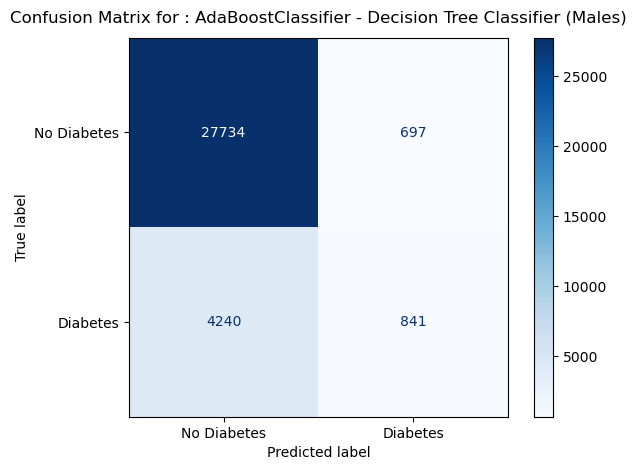

In [155]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(ym_test, pred_val, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix for : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

Model Name: AdaBoostClassifier - Decision Tree Classifier (Males)

The ROC Accuracy Score : ROC-AUC is 0.81



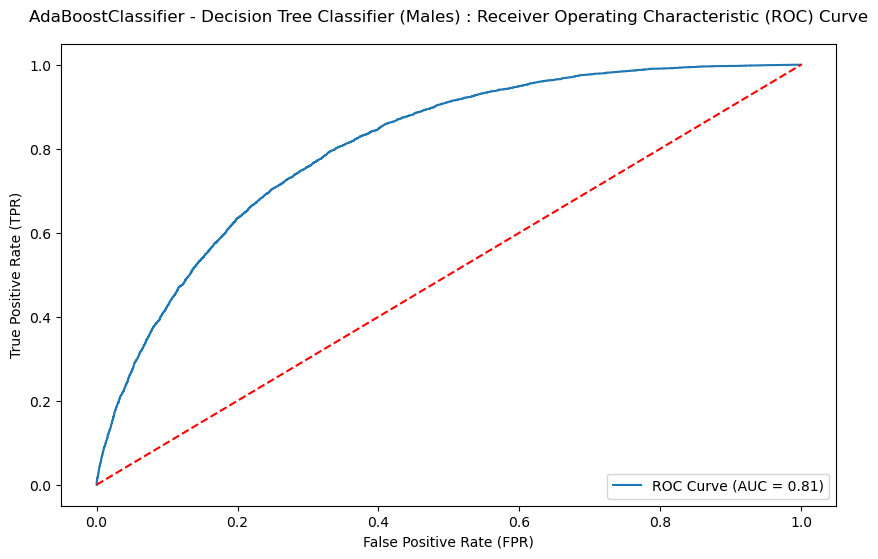

In [156]:
# Compute and Print the ROC Curve

print(f'Model Name: {model_name}\n')
    
fpr, tpr, thresholds = roc_curve(ym_test, y_prob, pos_label=1)

roc_auc_val = roc_auc_score(ym_test, y_prob)

print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}\n')

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_val:.2f})')
plt.plot([0, 1], [0, 1], 'k--',color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title(f'{model_name} : Receiver Operating Characteristic (ROC) Curve',y=1.03)
plt.legend(loc='lower right')
plt.show()

In [157]:
params = {'n_estimators': [100, 200],
         'estimator__max_depth': [1, 2, 3]}

tree_grid_f = GridSearchCV(AdaBoostClassifier(estimator=DecisionTreeClassifier()), 
                         param_grid=params).fit(Xf_train, yf_train)
grid_acc = tree_grid_f.score(Xf_test, yf_test)

In [158]:
train_accuracy = tree_grid_f.score(Xf_train, yf_train)
test_accuracy  = tree_grid_f.score(Xf_test, yf_test)
    
print (f'Training Accuracy : {train_accuracy:.2f}\n')
print (f'Test     Accuracy : {test_accuracy:.2f}\n')

best_model = tree_grid_f.best_estimator_
pred_val = best_model.predict(Xf_test)
y_prob  = best_model.predict_proba(Xf_test)[:, 1]

model_name = 'AdaBoostClassifier - Decision Tree Classifier (Females)'

Training Accuracy : 0.88

Test     Accuracy : 0.88



In [159]:
# Calculate and Print the Performance of the Model

precision = precision_score(yf_test, pred_val)
recall    = recall_score(yf_test, pred_val)
accuracy  = accuracy_score(yf_test, pred_val)
fscore    = f1_score(yf_test, pred_val)

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(yf_test, pred_val))

Performance Report for AdaBoostClassifier - Decision Tree Classifier (Females)

Precision is: 0.57
Recall    is: 0.17
F1 Score  is: 0.26
Accuracy  is: 0.88

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93     37070
           1       0.57      0.17      0.26      5523

    accuracy                           0.88     42593
   macro avg       0.73      0.57      0.60     42593
weighted avg       0.85      0.88      0.84     42593



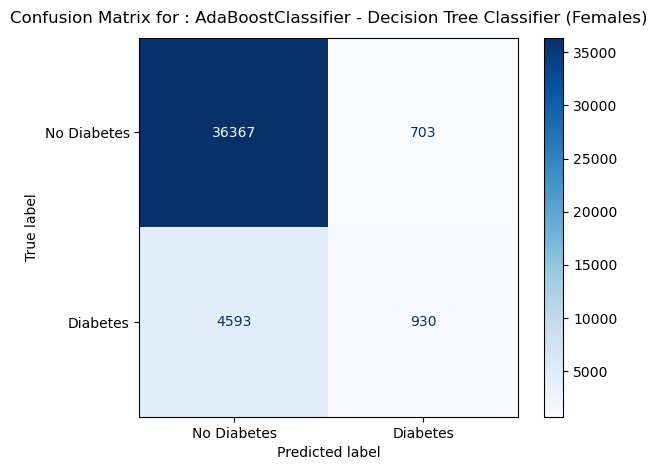

In [160]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(yf_test, pred_val, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix for : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

Model Name: AdaBoostClassifier - Decision Tree Classifier (Females)

The ROC Accuracy Score : ROC-AUC is 0.84



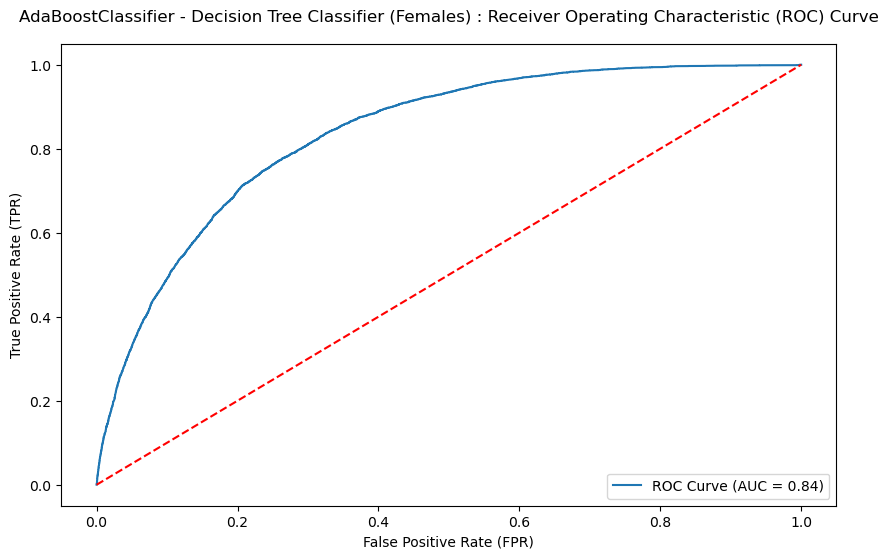

In [161]:
# Compute and Print the ROC Curve

print(f'Model Name: {model_name}\n')
    
fpr, tpr, thresholds = roc_curve(yf_test, y_prob, pos_label=1)

roc_auc_val = roc_auc_score(yf_test, y_prob)

print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}\n')

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_val:.2f})')
plt.plot([0, 1], [0, 1], 'k--',color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title(f'{model_name} : Receiver Operating Characteristic (ROC) Curve',y=1.03)
plt.legend(loc='lower right')
plt.show()

### Random Forest Classifier

#### Random Forest Classifier : for Males

In [162]:
oob_scores = []
n_trees = [1, 10, 100, 500, 1000, 2000]
for i in n_trees:
    forest = RandomForestClassifier(oob_score=True, n_estimators=i).fit(Xm_train, ym_train)
    oob_scores.append(forest.oob_score_)

In [163]:
best_trees = np.argmax(oob_scores)
print (f'Best scores for Random Forest Classifier (for Males) is using tree size of {n_trees[best_trees]} with a score of {oob_scores[best_trees]:.2f}')

Best scores for Random Forest Classifier (for Males) is using tree size of 2000 with a score of 0.84


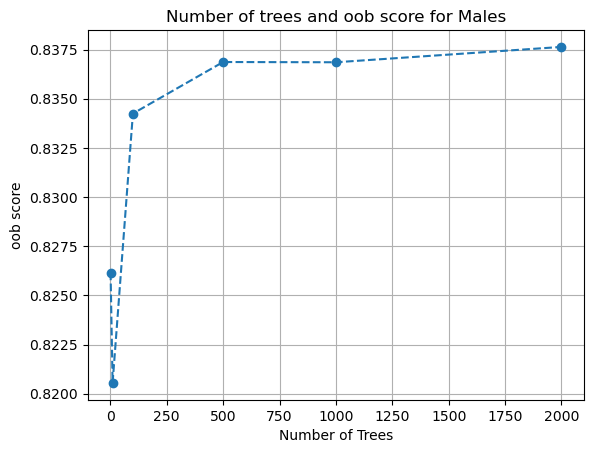

In [164]:
plt.plot(n_trees, oob_scores, '--o')
plt.grid()
plt.title('Number of trees and oob score for Males')
plt.xlabel('Number of Trees')
plt.ylabel("oob score");
plt.show()

In [165]:
depths = [1, 2, 3, 4, 5, None]
depth_oobs = []
for d in depths:
    forest = RandomForestClassifier(oob_score=True, n_estimators=best_trees,
                                   max_depth = d).fit(Xm_train, ym_train)
    depth_oobs.append(forest.oob_score_)

In [166]:
best_depth = np.argmax(depth_oobs)
print (f'Best scores for Random Forest Classifier (for Males) is using depth size of {depths[best_depth]} with a score of {depth_oobs[best_depth]:.2f}')

Best scores for Random Forest Classifier (for Males) is using depth size of 5 with a score of 0.85


In [167]:
# Best hyperparameters to use for Random Forest Classifier
rf_best_training = RandomForestClassifier(oob_score=True, n_estimators=n_trees[best_trees],
                                   max_depth = depths[best_depth]).fit(Xm_train, ym_train)

rf_best_test = RandomForestClassifier(oob_score=True, n_estimators=n_trees[best_trees],
                                   max_depth = depths[best_depth]).fit(Xm_test, ym_test)

In [168]:
print (f'Random Forest Classifier (for Males) with tree size : {n_trees[best_trees]} and depth size : {depths[best_depth]}\n')

print (f'Best Training scores is {rf_best_training.oob_score_:.2f}')
print (f'Best Test scores is     {rf_best_test.oob_score_:.2f}')

Random Forest Classifier (for Males) with tree size : 2000 and depth size : 5

Best Training scores is 0.85
Best Test scores is     0.85


In [169]:
pred_val = rf_best_training.predict(Xm_test)
y_prob  = rf_best_training.predict_proba(Xm_test)[:, 1]

In [170]:
# Calculate and Print the Performance of the Model

precision = precision_score(ym_test, pred_val)
recall    = recall_score(ym_test, pred_val)
accuracy  = accuracy_score(ym_test, pred_val)
fscore    = f1_score(ym_test, pred_val)

model_name = 'Random Forest Classifier (Males)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(ym_test, pred_val))

Performance Report for Random Forest Classifier (Males)

Precision is: 0.59
Recall    is: 0.03
F1 Score  is: 0.05
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.85      1.00      0.92     28431
           1       0.59      0.03      0.05      5081

    accuracy                           0.85     33512
   macro avg       0.72      0.51      0.49     33512
weighted avg       0.81      0.85      0.79     33512



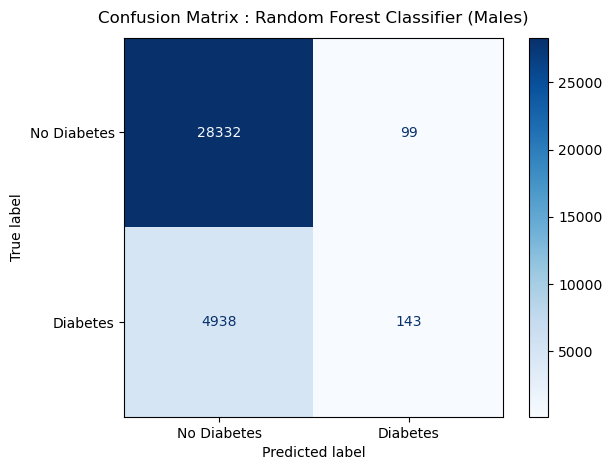

In [171]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(ym_test, pred_val, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

Model Name: Random Forest Classifier (Males)

The ROC Accuracy Score : ROC-AUC is 0.80



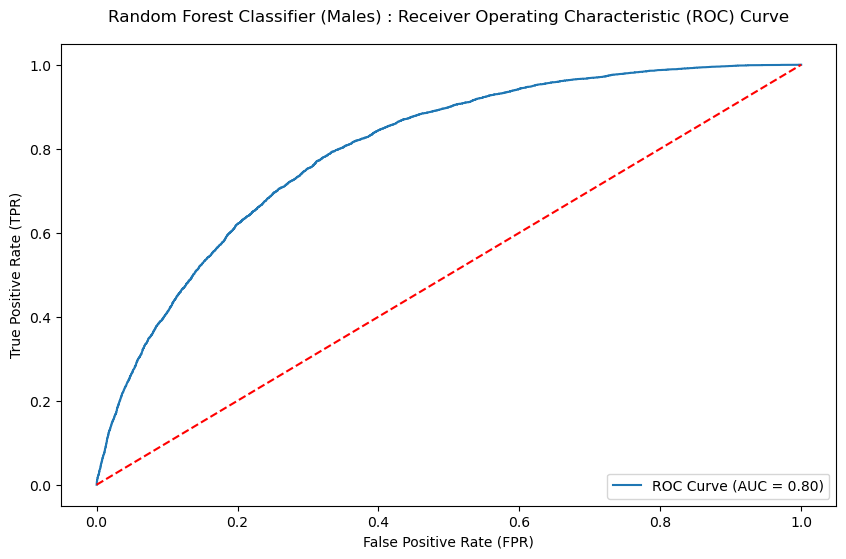

In [172]:
# Compute and Print the ROC Curve

print(f'Model Name: {model_name}\n')
    
fpr, tpr, thresholds = roc_curve(ym_test, y_prob, pos_label=1)

roc_auc_val = roc_auc_score(ym_test, y_prob)

print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}\n')

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_val:.2f})')
plt.plot([0, 1], [0, 1], 'k--',color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title(f'{model_name} : Receiver Operating Characteristic (ROC) Curve',y=1.03)
plt.legend(loc='lower right')
plt.show()

#### Random Forest Classifier : for Females

In [173]:
oob_scores = []
n_trees = [1, 10, 100, 500, 1000, 2000]
for i in n_trees:
    forest = RandomForestClassifier(oob_score=True, n_estimators=i).fit(Xf_train, yf_train)
    oob_scores.append(forest.oob_score_)

In [174]:
best_trees = np.argmax(oob_scores)
print (f'Best scores for Random Forest Classifier (for Females) is using tree size of {n_trees[best_trees]} with a score of {oob_scores[best_trees]:.2f}')

Best scores for Random Forest Classifier (for Females) is using tree size of 500 with a score of 0.86


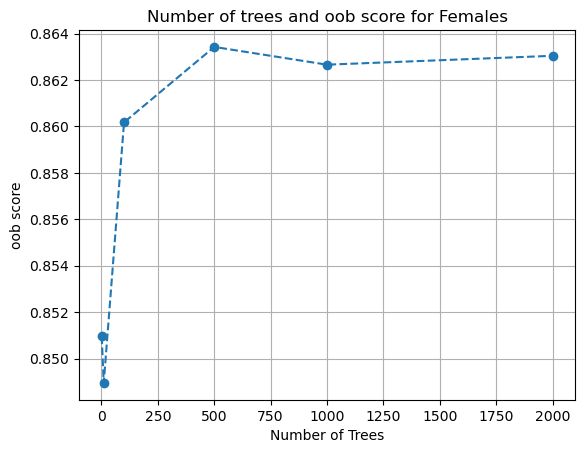

In [175]:
plt.plot(n_trees, oob_scores, '--o')
plt.grid()
plt.title('Number of trees and oob score for Females')
plt.xlabel('Number of Trees')
plt.ylabel("oob score");
plt.show()

In [176]:
depths = [1, 2, 3, 4, 5, None]
depth_oobs = []
for d in depths:
    forest = RandomForestClassifier(oob_score=True, n_estimators=best_trees,
                                   max_depth = d).fit(Xf_train, yf_train)
    depth_oobs.append(forest.oob_score_)

In [177]:
best_depth = np.argmax(depth_oobs)
print (f'Best scores for Random Forest Classifier (for Females) is using depth size of {depths[best_depth]} with a score of {depth_oobs[best_depth]:.2f}')

Best scores for Random Forest Classifier (for Females) is using depth size of 4 with a score of 0.87


In [178]:
# Best hyperparameters to use for Random Forest Classifier
rf_best_training = RandomForestClassifier(oob_score=True, n_estimators=n_trees[best_trees],
                                   max_depth = depths[best_depth]).fit(Xf_train, yf_train)

rf_best_test = RandomForestClassifier(oob_score=True, n_estimators=n_trees[best_trees],
                                   max_depth = depths[best_depth]).fit(Xf_test, yf_test)

In [179]:
print (f'Random Forest Classifier (for Females) with tree size : {n_trees[best_trees]} and depth size : {depths[best_depth]}\n')

print (f'Best Training scores is {rf_best_training.oob_score_:.2f}')
print (f'Best Test scores is     {rf_best_test.oob_score_:.2f}')

Random Forest Classifier (for Females) with tree size : 500 and depth size : 4

Best Training scores is 0.87
Best Test scores is     0.87


In [180]:
pred_val = rf_best_training.predict(Xf_test)
y_prob  = rf_best_training.predict_proba(Xf_test)[:, 1]

In [181]:
# Calculate and Print the Performance of the Model

precision = precision_score(yf_test, pred_val)
recall    = recall_score(yf_test, pred_val)
accuracy  = accuracy_score(yf_test, pred_val)
fscore    = f1_score(yf_test, pred_val)

model_name = 'Random Forest Classifier (Females)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(yf_test, pred_val))

Performance Report for Random Forest Classifier (Females)

Precision is: 0.00
Recall    is: 0.00
F1 Score  is: 0.00
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.87      1.00      0.93     37070
           1       0.00      0.00      0.00      5523

    accuracy                           0.87     42593
   macro avg       0.44      0.50      0.47     42593
weighted avg       0.76      0.87      0.81     42593



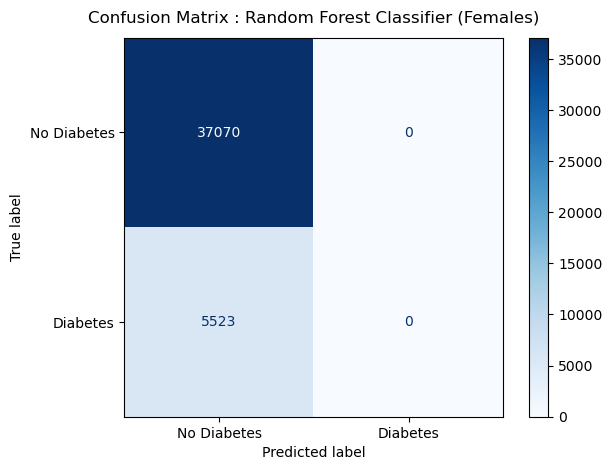

In [182]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(yf_test, pred_val, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

Model Name: Random Forest Classifier (Females)

The ROC Accuracy Score : ROC-AUC is 0.83



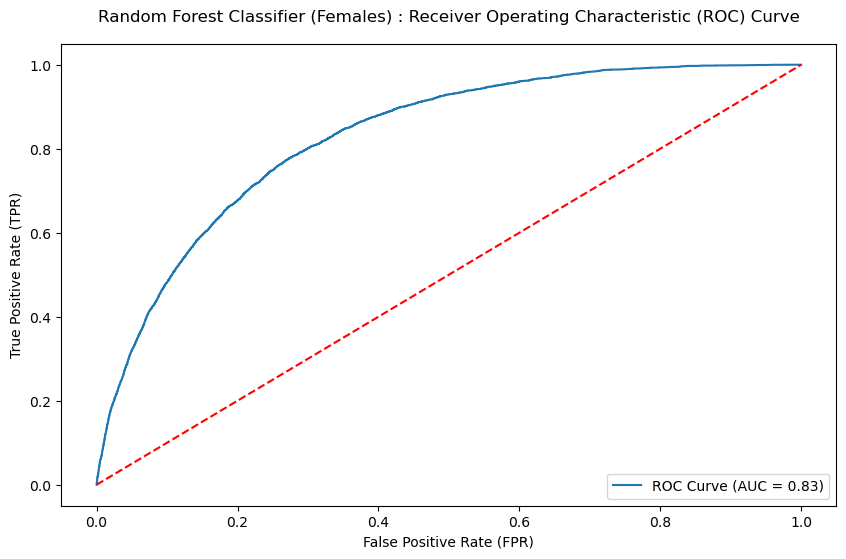

In [183]:
# Compute and Print the ROC Curve

print(f'Model Name: {model_name}\n')
    
fpr, tpr, thresholds = roc_curve(yf_test, y_prob, pos_label=1)

roc_auc_val = roc_auc_score(yf_test, y_prob)

print (f'The ROC Accuracy Score : ROC-AUC is {roc_auc_val:.2f}\n')

plt.figure(figsize=(10, 6))
plt.plot(fpr, tpr, label=f'ROC Curve (AUC = {roc_auc_val:.2f})')
plt.plot([0, 1], [0, 1], 'k--',color='red')
plt.xlabel('False Positive Rate (FPR)')
plt.ylabel('True Positive Rate (TPR)')
plt.title(f'{model_name} : Receiver Operating Characteristic (ROC) Curve',y=1.03)
plt.legend(loc='lower right')
plt.show()

### Voting Classifier

In [184]:
lin_reg = LogisticRegression()
knn_cls = KNeighborsClassifier()
dtr_cls = DecisionTreeClassifier()
rid_cls = RidgeClassifier()
svc_cls = SVC(kernel='sigmoid')

v_models = [('lgr', lin_reg), ('knn', knn_cls), ('dtc', dtr_cls), ('rid', rid_cls), ('svc', svc_cls)]

v_weights = [0.4, 0.5, 0.8, 0.7, 0.6]

In [185]:
# Evaluate Voting Classifier using base voting

base_vote_m = VotingClassifier(estimators = v_models)

In [186]:
# Evaluate Voting Claissifier using Weighted Voting - Weights are:
# 0.4 Logistic Regression
# 0.5 K Neighbors Classifier
# 0.8 Decision Tree Classifier
# 0.7 Ridge Classifier
# 0.6 Support Vector Machines Classifier (SVC)

weight_vote_m = VotingClassifier(estimators = v_models, weights= v_weights)

In [187]:
# Lets train the base voting classifier model with male patient training data

base_vote_m.fit(Xm_train, ym_train)

VotingClassifier(estimators=[('lgr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('dtc', DecisionTreeClassifier()),
                             ('rid', RidgeClassifier()),
                             ('svc', SVC(kernel='sigmoid'))])

In [188]:
# Let's predict the results for the male patient test data

pred_base_vote_m   = base_vote_m.predict(Xm_test)

In [189]:
# Calculate and Print the Performance of the Model for Base Voting Classifier Model

precision = precision_score(ym_test, pred_base_vote_m)
recall    = recall_score(ym_test, pred_base_vote_m)
accuracy  = accuracy_score(ym_test, pred_base_vote_m)
fscore    = f1_score(ym_test, pred_base_vote_m)

model_name = 'Voting Classifier - Base (Males)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(ym_test, pred_base_vote_m))

Performance Report for Voting Classifier - Base (Males)

Precision is: 0.53
Recall    is: 0.06
F1 Score  is: 0.10
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.99      0.92     28431
           1       0.53      0.06      0.10      5081

    accuracy                           0.85     33512
   macro avg       0.69      0.52      0.51     33512
weighted avg       0.81      0.85      0.79     33512



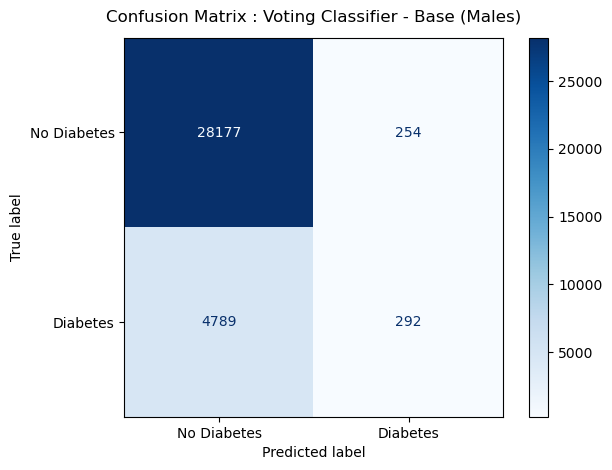

In [190]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(ym_test, pred_base_vote_m, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

In [191]:
# Lets train the weighted voting classifier model with male patient training data

weight_vote_m.fit(Xm_train, ym_train)

VotingClassifier(estimators=[('lgr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('dtc', DecisionTreeClassifier()),
                             ('rid', RidgeClassifier()),
                             ('svc', SVC(kernel='sigmoid'))],
                 weights=[0.4, 0.5, 0.8, 0.7, 0.6])

In [192]:
# Let's predict the results for the weighted model for male patient test data

pred_weight_vote_m = weight_vote_m.predict(Xm_test)

In [193]:
# Calculate and Print the Performance of the Model for Weight Voting Classifier Model

precision = precision_score(ym_test, pred_weight_vote_m)
recall    = recall_score(ym_test, pred_weight_vote_m)
accuracy  = accuracy_score(ym_test, pred_weight_vote_m)
fscore    = f1_score(ym_test, pred_weight_vote_m)

model_name = 'Voting Classifier - Weighted (Males)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(ym_test, pred_weight_vote_m))

Performance Report for Voting Classifier - Weighted (Males)

Precision is: 0.54
Recall    is: 0.06
F1 Score  is: 0.10
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.85      0.99      0.92     28431
           1       0.54      0.06      0.10      5081

    accuracy                           0.85     33512
   macro avg       0.70      0.52      0.51     33512
weighted avg       0.81      0.85      0.79     33512



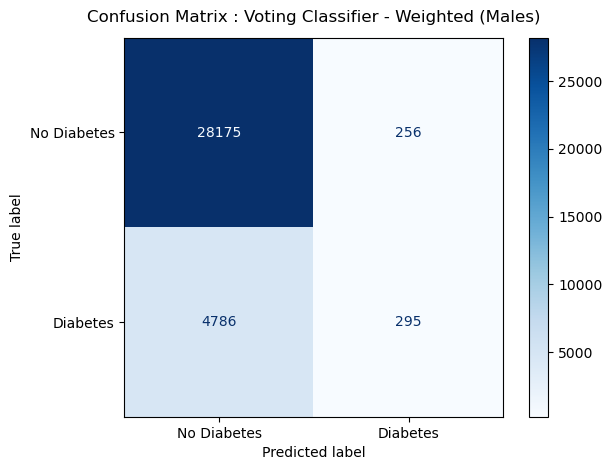

In [194]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(ym_test, pred_weight_vote_m, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

#### Voting Classifier for Female Patients

In [195]:
# Evaluate Voting Classifier using base voting for Female Patients

base_vote_f = VotingClassifier(estimators = v_models)

In [196]:
# Evaluate Voting Claissifier using Weighted Voting for Female Patients - Weights are:
# 0.4 Logistic Regression
# 0.5 K Neighbors Classifier
# 0.8 Decision Tree Classifier
# 0.7 Ridge Classifier
# 0.6 Support Vector Machines Classifier (SVC)

weight_vote_f = VotingClassifier(estimators = v_models, weights= v_weights)

In [197]:
# Lets train the base voting classifier model with female patient training data

base_vote_f.fit(Xf_train, yf_train)

VotingClassifier(estimators=[('lgr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('dtc', DecisionTreeClassifier()),
                             ('rid', RidgeClassifier()),
                             ('svc', SVC(kernel='sigmoid'))])

In [198]:
# Let's predict the results for the female patient test data

pred_base_vote_f   = base_vote_f.predict(Xf_test)

In [199]:
# Calculate and Print the Performance of the Model for Base Voting Classifier Model

precision = precision_score(yf_test, pred_base_vote_f)
recall    = recall_score(yf_test, pred_base_vote_f)
accuracy  = accuracy_score(yf_test, pred_base_vote_f)
fscore    = f1_score(yf_test, pred_base_vote_f)

model_name = 'Voting Classifier - Base (Females)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(yf_test, pred_base_vote_f))

Performance Report for Voting Classifier - Base (Females)

Precision is: 0.61
Recall    is: 0.06
F1 Score  is: 0.11
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.99      0.93     37070
           1       0.61      0.06      0.11      5523

    accuracy                           0.87     42593
   macro avg       0.74      0.53      0.52     42593
weighted avg       0.84      0.87      0.83     42593



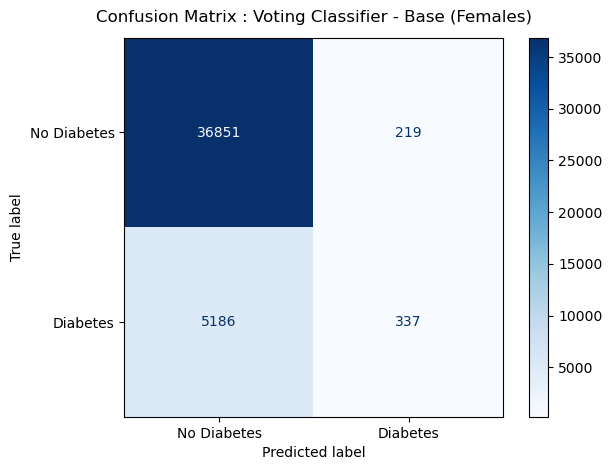

In [200]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(yf_test, pred_base_vote_f, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

In [201]:
# Lets train the weighted voting classifier model with female patient training data

weight_vote_f.fit(Xf_train, yf_train)

VotingClassifier(estimators=[('lgr', LogisticRegression()),
                             ('knn', KNeighborsClassifier()),
                             ('dtc', DecisionTreeClassifier()),
                             ('rid', RidgeClassifier()),
                             ('svc', SVC(kernel='sigmoid'))],
                 weights=[0.4, 0.5, 0.8, 0.7, 0.6])

In [202]:
# Let's predict the results for the weighted model for female patient test data

pred_weight_vote_f = weight_vote_f.predict(Xf_test)

In [203]:
# Calculate and Print the Performance of the Model for Base Voting Classifier Model

precision = precision_score(yf_test, pred_weight_vote_f)
recall    = recall_score(yf_test, pred_weight_vote_f)
accuracy  = accuracy_score(yf_test, pred_weight_vote_f)
fscore    = f1_score(yf_test, pred_weight_vote_f)

model_name = 'Voting Classifier - Weighted (Females)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(yf_test, pred_weight_vote_f))

Performance Report for Voting Classifier - Weighted (Females)

Precision is: 0.60
Recall    is: 0.06
F1 Score  is: 0.11
Accuracy  is: 0.87

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.99      0.93     37070
           1       0.60      0.06      0.11      5523

    accuracy                           0.87     42593
   macro avg       0.74      0.53      0.52     42593
weighted avg       0.84      0.87      0.83     42593



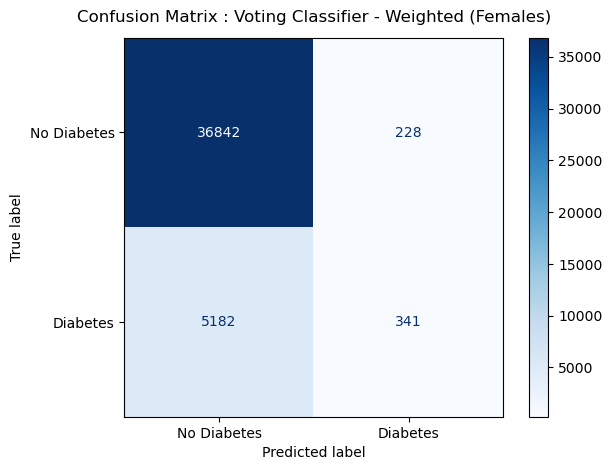

In [204]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(yf_test, pred_weight_vote_f, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

### XGBoost Classifier

#### XGBoost Classifier for Males

In [205]:
# Let's split the data into Training, Validation, and Test dataset for Male Patients 
# We will use the Training and Validation dataset for learning with early stopping option

Xm_train_full, Xm_test, ym_train_full, ym_test = train_test_split(Xm, ym, test_size = 0.3, random_state=42,stratify=ym)
Xm_train, Xm_val, ym_train, ym_val = train_test_split(Xm_train_full, ym_train_full, test_size = 0.3, random_state=42,stratify=ym_train_full)

In [206]:
# Let's create an XGBoost Classifier instance with early stopping option

xgb_clf_m = XGBClassifier(n_estimators = 1000,
                        learning_rate = 0.10,
                        alpha=10,
                        gamma=0,
                        max_depth=5,
                        eval_metric = "logloss",
                        early_stopping_rounds = 5,
                        n_jobs = -1)

In [207]:
# Let's train the data and use validation data for evaluation steps

xgb_clf_m.fit(Xm_train, ym_train, 
              eval_set = [(Xm_val,ym_val)],
              verbose = False)

XGBClassifier(alpha=10, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=5,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=-1, num_parallel_tree=None, ...)

In [208]:
# Let's predict the results for the male patient test data using XGBoost Classifier

xgb_pred_m = xgb_clf_m.predict(Xm_test)

In [209]:
# Calculate and Print the Performance of the Model for Base Voting Classifier Model

precision = precision_score(ym_test, xgb_pred_m)
recall    = recall_score(ym_test, xgb_pred_m)
accuracy  = accuracy_score(ym_test, xgb_pred_m)
fscore    = f1_score(ym_test, xgb_pred_m)

model_name = 'XGBoost Classifier - (Males)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(ym_test, xgb_pred_m))

Performance Report for XGBoost Classifier - (Males)

Precision is: 0.55
Recall    is: 0.14
F1 Score  is: 0.22
Accuracy  is: 0.85

Classification Report:
              precision    recall  f1-score   support

           0       0.86      0.98      0.92     28431
           1       0.55      0.14      0.22      5081

    accuracy                           0.85     33512
   macro avg       0.71      0.56      0.57     33512
weighted avg       0.82      0.85      0.81     33512



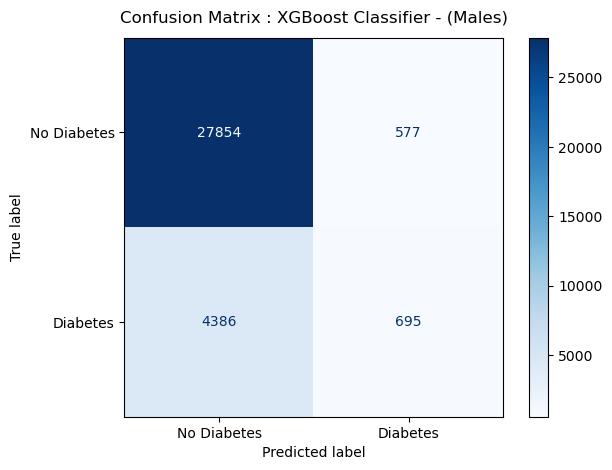

In [210]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(ym_test, xgb_pred_m, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

In [211]:
# Let's split the data into Training, Validation, and Test dataset for Female Patients 
# We will use the Training and Validation dataset for learning with early stopping option

Xf_train_full, Xf_test, yf_train_full, yf_test = train_test_split(Xf, yf, test_size = 0.3, random_state=42,stratify=yf)
Xf_train, Xf_val, yf_train, yf_val = train_test_split(Xf_train_full, yf_train_full, test_size = 0.3, random_state=42,stratify=yf_train_full)

In [212]:
# Let's create an XGBoost Classifier instance with early stopping option

xgb_clf_f = XGBClassifier(n_estimators = 1000,
                        learning_rate = 0.10,
                        alpha=10,
                        gamma=0,
                        max_depth=5,
                        eval_metric = "logloss",
                        early_stopping_rounds = 5,
                        n_jobs = -1)

In [213]:
# Let's train the data and use validation data for evaluation steps

xgb_clf_f.fit(Xf_train, yf_train, 
              eval_set = [(Xf_val,yf_val)],
              verbose = False)

XGBClassifier(alpha=10, base_score=None, booster=None, callbacks=None,
              colsample_bylevel=None, colsample_bynode=None,
              colsample_bytree=None, device=None, early_stopping_rounds=5,
              enable_categorical=False, eval_metric='logloss',
              feature_types=None, gamma=0, grow_policy=None,
              importance_type=None, interaction_constraints=None,
              learning_rate=0.1, max_bin=None, max_cat_threshold=None,
              max_cat_to_onehot=None, max_delta_step=None, max_depth=5,
              max_leaves=None, min_child_weight=None, missing=nan,
              monotone_constraints=None, multi_strategy=None, n_estimators=1000,
              n_jobs=-1, num_parallel_tree=None, ...)

In [214]:
# Let's predict the results for the male patient test data using XGBoost Classifier

xgb_pred_f = xgb_clf_f.predict(Xf_test)

In [215]:
# Calculate and Print the Performance of the Model for Base Voting Classifier Model

precision = precision_score(yf_test, xgb_pred_f)
recall    = recall_score(yf_test, xgb_pred_f)
accuracy  = accuracy_score(yf_test, xgb_pred_f)
fscore    = f1_score(yf_test, xgb_pred_f)

model_name = 'XGBoost Classifier - (Females)'

model_names.append(model_name)
precision_vals.append(f'{precision:.2f}')
recall_vals.append(f'{recall:.2f}')
f1score_vals.append(f'{fscore:.2f}')
accuracy_vals.append(f'{accuracy:.2f}')

print(f'Performance Report for {model_name}\n')
print(f'Precision is: {precision:.2f}')
print(f'Recall    is: {recall:.2f}')
print(f'F1 Score  is: {fscore:.2f}')
print(f'Accuracy  is: {accuracy:.2f}')

# Classification report
print('\nClassification Report:')
print(classification_report(yf_test, xgb_pred_f))

Performance Report for XGBoost Classifier - (Females)

Precision is: 0.58
Recall    is: 0.15
F1 Score  is: 0.24
Accuracy  is: 0.88

Classification Report:
              precision    recall  f1-score   support

           0       0.89      0.98      0.93     37070
           1       0.58      0.15      0.24      5523

    accuracy                           0.88     42593
   macro avg       0.73      0.57      0.59     42593
weighted avg       0.85      0.88      0.84     42593



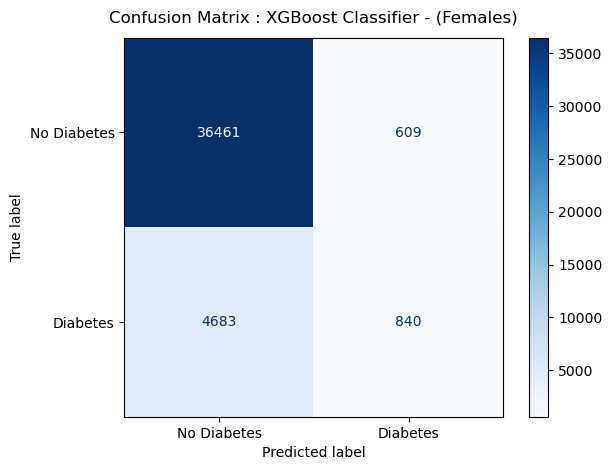

In [216]:
# Display the Confusion Matrix
ConfusionMatrixDisplay.from_predictions(yf_test, xgb_pred_f, cmap=plt.cm.Blues, display_labels=['No Diabetes', 'Diabetes'])
plt.title(f'Confusion Matrix : {model_name}', y=1.02)
plt.tight_layout()
plt.show()

In [217]:
results_df = pd.DataFrame({'Models':model_names, 'Precision':precision_vals, 'Recall': recall_vals, 
                           'F1 Score': f1score_vals, 'Accuracy': accuracy_vals})
results_df.set_index('Models', inplace=True)

In [218]:
results_df

,Precision,Recall,F1 Score,Accuracy
Models,,,,
AdaBoostClassifier - Decision Tree Classifier (Males),0.55,0.17,0.25,0.85
AdaBoostClassifier - Decision Tree Classifier (Females),0.57,0.17,0.26,0.88
Random Forest Classifier (Males),0.59,0.03,0.05,0.85
Random Forest Classifier (Females),0.00,0.00,0.00,0.87
Voting Classifier - Base (Males),0.53,0.06,0.10,0.85
Voting Classifier - Weighted (Males),0.54,0.06,0.10,0.85
Voting Classifier - Base (Females),0.61,0.06,0.11,0.87
Voting Classifier - Weighted (Females),0.60,0.06,0.11,0.87
XGBoost Classifier - (Males),0.55,0.14,0.22,0.85


### Conclusion

Looking at the results from the Ensemble techniques, we see eXtreme Graident Boosting (XGB) Classifier providing the best results with a higher Precision and low Recall and high Accuracy. 

Also, the processing time for XGBoost was much lower than the other ones. While Random Forest did give a good score, it may have done a lot more over fitting and my recommendation is to ignore that model.

### Next Steps:
- Continue to review and explore further on the data to identify variations of the dataset that can provide best results.
- Convert the XGBoost Classifier solution as an output and work on ML Operations to implement this as a production ready solution.

